# Market Indicators and Speech sentiment.

Thinking it more likely for a speech to have an influence on markets that move daily then this was the first line of examination.

The markets chosen for analysis were: Bonds (1m, 2y, 10y) FTSE100, FTSE250, Gold as well as Forex GBP/USD.

In [1]:
import pandas as pd
import seaborn as sns
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.dates as mdates
import warnings

# Suppress all warnings
warnings.filterwarnings("ignore")

In [2]:
# Import files
all_data = pd.read_csv('all_data.csv')

# View the dataframe
all_data

,date,reference,country,title,author,is_gov,word_count,body,central_bank,year,...,ftse_100,gdp_million,gold_price,avg_house_price,1_mo_bond,10_yr_bond,2_yr_bond,unemployment,usd,wage_growth
0,1999-01-04,r981215a_BOE,United Kingdom,Alice in Euroland,Buiter,False,4574,BOE,Bank of England,1998,...,5879.399902,255773,289,72903.17681,6.023,4.287,4.899,6.2,1.6585,NaN
1,1999-01-05,r981215a_BOE,United Kingdom,Alice in Euroland,Buiter,False,4574,BOE,Bank of England,1998,...,5958.200195,255773,289,72903.17681,6.022,4.330,4.895,6.2,1.6542,NaN
2,1999-01-06,r981215a_BOE,United Kingdom,Alice in Euroland,Buiter,False,4574,BOE,Bank of England,1998,...,6148.799805,255773,290,72903.17681,6.022,4.319,4.917,6.2,1.6549,NaN
3,1999-01-07,r981215a_BOE,United Kingdom,Alice in Euroland,Buiter,False,4574,BOE,Bank of England,1998,...,6101.200195,255773,293,72903.17681,6.022,4.277,4.941,6.2,1.6520,NaN
4,1999-01-08,r981215a_BOE,United Kingdom,Alice in Euroland,Buiter,False,4574,BOE,Bank of England,1998,...,6147.200195,255773,293,72903.17681,6.019,4.252,4.810,6.2,1.6423,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6121,2022-10-14,r221012a_BOE,United Kingdom,Monetary policy: an anchor in challenging times,Pill,False,3567,BOE,Bank of England,2022,...,6858.799805,645805,1649,291193.00000,2.208,4.323,3.877,3.8,1.1170,6.6
6122,2022-10-17,r221015a_BOE,United Kingdom,Monetary policy and financial stability interv...,Bailey,True,1767,BOE,Bank of England,2022,...,6920.200195,645805,1664,291193.00000,2.106,3.981,3.559,3.8,1.1353,6.6
6123,2022-10-18,r221015a_BOE,United Kingdom,Monetary policy and financial stability interv...,Bailey,True,1767,BOE,Bank of England,2022,...,6936.700195,645805,1656,291193.00000,2.329,3.943,3.547,3.8,1.1318,6.6
6124,2022-10-19,r221019a_BOE,United Kingdom,Governance of â€œDecentralisedâ€ Finance: Get...,Wilkins,False,5382,BOE,Bank of England,2022,...,6925.000000,645805,1634,291193.00000,2.292,3.871,3.465,3.8,1.1214,6.6


In [3]:
# Import files
speeches = pd.read_csv('all_speeches_scores_daily.csv')

# View the dataframe
speeches

,date,reference,country,title,author,is_gov,word_count,Body,central_bank,year,language,vader_polarity,lm_polarity,finbert_polarity
0,15/09/1998,r980915a_BOE,United Kingdom,Speech,George,False,2387,BOE,Bank of England,1998,en,0.9968,-0.418182,-0.269212
1,16/09/1998,r980915a_BOE,United Kingdom,Speech,George,False,2387,BOE,Bank of England,1998,en,0.9968,-0.418182,-0.269212
2,17/09/1998,r980915a_BOE,United Kingdom,Speech,George,False,2387,BOE,Bank of England,1998,en,0.9968,-0.418182,-0.269212
3,18/09/1998,r980915a_BOE,United Kingdom,Speech,George,False,2387,BOE,Bank of England,1998,en,0.9968,-0.418182,-0.269212
4,19/09/1998,r980915a_BOE,United Kingdom,Speech,George,False,2387,BOE,Bank of England,1998,en,0.9968,-0.418182,-0.269212
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8912,16/10/2022,r221015a_BOE,United Kingdom,Monetary policy and financial stability interv...,Bailey,True,1767,BOE,Bank of England,2022,en,-0.9848,-0.600000,-0.070586
8913,17/10/2022,r221015a_BOE,United Kingdom,Monetary policy and financial stability interv...,Bailey,True,1767,BOE,Bank of England,2022,en,-0.9848,-0.600000,-0.070586
8914,18/10/2022,r221015a_BOE,United Kingdom,Monetary policy and financial stability interv...,Bailey,True,1767,BOE,Bank of England,2022,en,-0.9848,-0.600000,-0.070586
8915,19/10/2022,r221019a_BOE,United Kingdom,Governance of â€œDecentralisedâ€ Finance: Get...,Wilkins,False,5382,BOE,Bank of England,2022,en,0.9999,0.287234,0.000144


In [4]:
# Convert the date column to datetime
speeches['date'] = pd.to_datetime(speeches['date'])

# View the dataframe
speeches

,date,reference,country,title,author,is_gov,word_count,Body,central_bank,year,language,vader_polarity,lm_polarity,finbert_polarity
0,1998-09-15,r980915a_BOE,United Kingdom,Speech,George,False,2387,BOE,Bank of England,1998,en,0.9968,-0.418182,-0.269212
1,1998-09-16,r980915a_BOE,United Kingdom,Speech,George,False,2387,BOE,Bank of England,1998,en,0.9968,-0.418182,-0.269212
2,1998-09-17,r980915a_BOE,United Kingdom,Speech,George,False,2387,BOE,Bank of England,1998,en,0.9968,-0.418182,-0.269212
3,1998-09-18,r980915a_BOE,United Kingdom,Speech,George,False,2387,BOE,Bank of England,1998,en,0.9968,-0.418182,-0.269212
4,1998-09-19,r980915a_BOE,United Kingdom,Speech,George,False,2387,BOE,Bank of England,1998,en,0.9968,-0.418182,-0.269212
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8912,2022-10-16,r221015a_BOE,United Kingdom,Monetary policy and financial stability interv...,Bailey,True,1767,BOE,Bank of England,2022,en,-0.9848,-0.600000,-0.070586
8913,2022-10-17,r221015a_BOE,United Kingdom,Monetary policy and financial stability interv...,Bailey,True,1767,BOE,Bank of England,2022,en,-0.9848,-0.600000,-0.070586
8914,2022-10-18,r221015a_BOE,United Kingdom,Monetary policy and financial stability interv...,Bailey,True,1767,BOE,Bank of England,2022,en,-0.9848,-0.600000,-0.070586
8915,2022-10-19,r221019a_BOE,United Kingdom,Governance of â€œDecentralisedâ€ Finance: Get...,Wilkins,False,5382,BOE,Bank of England,2022,en,0.9999,0.287234,0.000144


In [5]:
# Filter to keep only dates from 1999-01-01
speeches = speeches[speeches['date'] >= '1999-01-01']

# Select desired columns
speeches = speeches[['date', 'author', 'is_gov', 'vader_polarity', 'lm_polarity', 'finbert_polarity']]

# Drop duplicates in 'finbert_polarity', keeping only the first instance
speeches = speeches.drop_duplicates(subset='finbert_polarity', keep='first')

# Reset index
speeches.reset_index(drop=True, inplace=True)

# View the dataframe
speeches

,date,author,is_gov,vader_polarity,lm_polarity,finbert_polarity
0,1999-01-01,Buiter,False,0.9998,-0.213270,-0.007072
1,1999-01-12,George,False,0.9964,-0.528455,-0.748517
2,1999-01-18,George,False,0.9993,-0.229508,-0.436865
3,1999-02-01,George,False,0.9997,0.050505,0.184429
4,1999-02-10,George,False,0.9995,-0.156627,-0.345548
...,...,...,...,...,...,...
1190,2022-10-07,Ramsden,False,0.9947,-0.525180,-0.143693
1191,2022-10-12,Pill,False,0.9997,-0.166667,-0.011488
1192,2022-10-15,Bailey,True,-0.9848,-0.600000,-0.070586
1193,2022-10-19,Wilkins,False,0.9999,0.287234,0.000144


In [6]:
# Create a new dataframe with_daily markets
eco_daily = all_data[['date', 'gold_price', '1_mo_bond', '10_yr_bond', '2_yr_bond', 'ftse_100', 'ftse_250', 'usd']]

# View the dataframe
eco_daily.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6126 entries, 0 to 6125
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   date        6126 non-null   object 
 1   gold_price  6126 non-null   int64  
 2   1_mo_bond   6126 non-null   float64
 3   10_yr_bond  6126 non-null   float64
 4   2_yr_bond   6126 non-null   float64
 5   ftse_100    6126 non-null   float64
 6   ftse_250    6126 non-null   float64
 7   usd         6126 non-null   float64
dtypes: float64(6), int64(1), object(1)
memory usage: 383.0+ KB


In [7]:
# Convert the date column to datetime
eco_daily['date'] = pd.to_datetime(eco_daily['date'])

# Change the 'gold_price' column to float64
eco_daily['gold_price'] = eco_daily['gold_price'].astype(np.float64)

# View the dataframe
eco_daily.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6126 entries, 0 to 6125
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   date        6126 non-null   datetime64[ns]
 1   gold_price  6126 non-null   float64       
 2   1_mo_bond   6126 non-null   float64       
 3   10_yr_bond  6126 non-null   float64       
 4   2_yr_bond   6126 non-null   float64       
 5   ftse_100    6126 non-null   float64       
 6   ftse_250    6126 non-null   float64       
 7   usd         6126 non-null   float64       
dtypes: datetime64[ns](1), float64(7)
memory usage: 383.0 KB


In [8]:
# View the dataframe
eco_daily

,date,gold_price,1_mo_bond,10_yr_bond,2_yr_bond,ftse_100,ftse_250,usd
0,1999-01-04,289.0,6.023,4.287,4.899,5879.399902,4851.000000,1.6585
1,1999-01-05,289.0,6.022,4.330,4.895,5958.200195,4870.200195,1.6542
2,1999-01-06,290.0,6.022,4.319,4.917,6148.799805,4944.399902,1.6549
3,1999-01-07,293.0,6.022,4.277,4.941,6101.200195,4946.700195,1.6520
4,1999-01-08,293.0,6.019,4.252,4.810,6147.200195,4976.399902,1.6423
...,...,...,...,...,...,...,...,...
6121,2022-10-14,1649.0,2.208,4.323,3.877,6858.799805,17032.800780,1.1170
6122,2022-10-17,1664.0,2.106,3.981,3.559,6920.200195,17502.800780,1.1353
6123,2022-10-18,1656.0,2.329,3.943,3.547,6936.700195,17529.300780,1.1318
6124,2022-10-19,1634.0,2.292,3.871,3.465,6925.000000,17247.599610,1.1214


For an easier view of the effects the speeches could be having on the markets, a dataframe was created with the change in the markets each day.

In [9]:
# Extract the 'date' column
dates = eco_daily['date']

# Drop the 'date' column from 'eco_daily'
eco_daily = eco_daily.drop(columns=['date'])

# Calculate percentage change for each column
daily_change = eco_daily.pct_change() * 100

# Concatenate 'dates' and 'daily_change' dataframes horizontally
daily_change = pd.concat([dates, daily_change], axis=1)

# Drop the first row since it will have NaN values due to no previous day for calculation
daily_change = daily_change.dropna()

# Rename the columns
column_mapping = {
    'gold_price': 'gold %',
    '1_mo_bond': 'bond_1m %',
    '10_yr_bond': 'bond_10y %',
    '2_yr_bond': 'bond_2y %',
    'ftse_100': 'ftse100 %',
    'ftse_250': 'ftse250 %',
    'usd': 'forex %'}
daily_change = daily_change.rename(columns=column_mapping)

# Reorder the columns to have 'date' as the first column
daily_change = daily_change[['date', 'gold %', 'bond_1m %', 'bond_10y %', 'bond_2y %', 'ftse100 %', 'ftse250 %', 'forex %']]

# View the dataframe
daily_change

,date,gold %,bond_1m %,bond_10y %,bond_2y %,ftse100 %,ftse250 %,forex %
1,1999-01-05,0.000000,-0.016603,1.003032,-0.081649,1.340278,0.395799,-0.259270
2,1999-01-06,0.346021,0.000000,-0.254042,0.449438,3.198946,1.523545,0.042317
3,1999-01-07,1.034483,0.000000,-0.972447,0.488103,-0.774128,0.046523,-0.175237
4,1999-01-08,0.000000,-0.049817,-0.584522,-2.651285,0.753950,0.600394,-0.587167
5,1999-01-11,0.682594,0.182755,1.081844,-0.415800,-1.011846,0.112533,-0.767217
...,...,...,...,...,...,...,...,...
6121,2022-10-14,-1.669648,0.683995,3.322180,2.322513,0.124082,0.611366,-1.403478
6122,2022-10-17,0.909642,-4.619565,-7.911173,-8.202218,0.895206,2.759382,1.638317
6123,2022-10-18,-0.480769,10.588794,-0.954534,-0.337173,0.238432,0.151404,-0.308289
6124,2022-10-19,-1.328502,-1.588665,-1.826021,-2.311813,-0.168671,-1.607030,-0.918890


In [10]:
# Check for duplicates
duplicates_daily_change = daily_change.duplicated(subset=['date'], keep=False)

# View the result
duplicates_daily_change

1       False
2       False
3       False
4       False
5       False
        ...  
6121    False
6122    False
6123    False
6124    False
6125    False
Length: 6125, dtype: bool

In [11]:
# Count NaN values in each column
nan_count = daily_change.isna().sum()

# Display count of NaN values
print(nan_count) 

date          0
gold %        0
bond_1m %     0
bond_10y %    0
bond_2y %     0
ftse100 %     0
ftse250 %     0
forex %       0
dtype: int64


After creating and tweaking dataframes to have the appropriate columns and information, we decided to begin by examining the financial crisis period from 1st of June '07 until Jan 31st '10. 

In [12]:
# Filter the DataFrame for June '07 to Jan '10
daily_change_gfc = daily_change[daily_change['date'].between('2007-06-01', '2010-01-31')]

# View the Dataframe
daily_change_gfc

,date,gold %,bond_1m %,bond_10y %,bond_2y %,ftse100 %,ftse250 %,forex %
2133,2007-06-01,1.499250,-0.089960,0.076526,0.385559,0.833651,0.706795,0.070682
2134,2007-06-04,-0.147710,0.090041,0.841139,0.837989,-0.188717,-0.502593,0.489380
2135,2007-06-05,-0.147929,0.125945,0.227488,0.277008,-0.469685,-0.570234,0.075309
2136,2007-06-06,0.000000,0.035939,0.416115,-0.552486,-1.659927,-2.352023,-0.045151
2137,2007-06-07,-1.481481,0.143704,-0.772273,-1.024306,-0.269828,-1.324862,-0.727766
...,...,...,...,...,...,...,...,...
2808,2010-01-26,0.182482,0.779727,-0.870456,-3.450980,0.315573,-0.002144,-0.603411
2809,2010-01-27,-1.183971,-0.967118,0.490702,3.249391,-1.125659,-0.512225,0.117698
2810,2010-01-27,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2811,2010-01-28,0.000000,0.000000,0.873811,4.169945,-1.376134,-0.340714,-0.228932


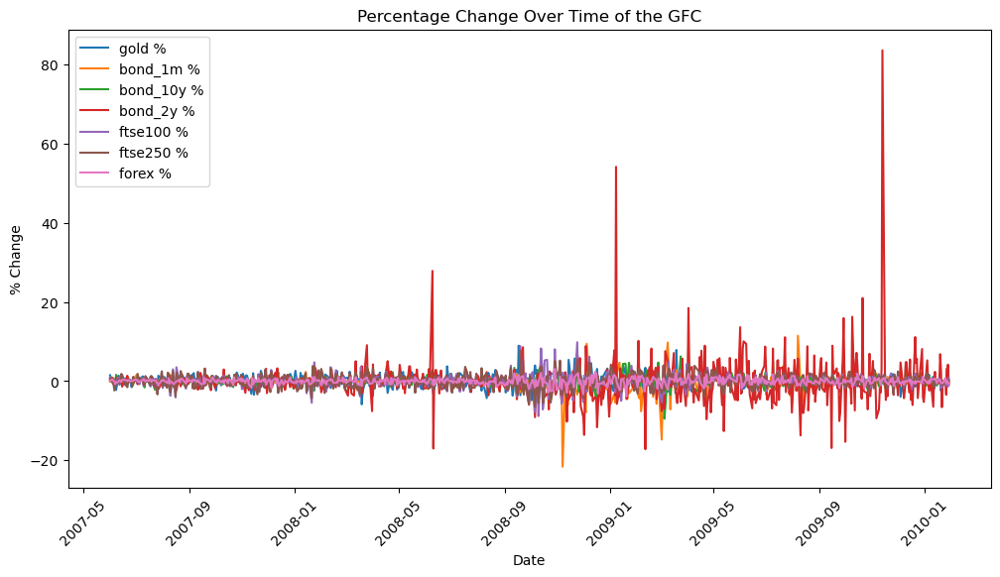

In [13]:
# Set the figure size
fig, ax = plt.subplots(figsize=(12, 6))

# Plot the data
plt.plot(daily_change_gfc['date'], daily_change_gfc.drop(columns=['date']))

# Set labels and title
plt.xlabel('Date')
plt.ylabel('% Change')
plt.title('Percentage Change Over Time of the GFC')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add a legend
plt.legend(daily_change_gfc.drop(columns=['date']).columns)

# Show plot
plt.show()

With such a long time frame and daily data then it's hard to tell much from this so a smaller time frame is needed.
I decided on the last 4 months of 2008 as there is a lot of movement in that period.

In [14]:
# Create a dataframe for Sep - Dec 2008
daily_change_08 = daily_change[daily_change['date'].between('2008-09-01', '2008-12-31')]
                                                  
# View the dataframe
daily_change_08                                              

,date,gold %,bond_1m %,bond_10y %,bond_2y %,ftse100 %,ftse250 %,forex %
2450,2008-09-01,0.000000,-0.293427,-0.401875,-1.624388,-0.599657,0.295255,-1.136488
2451,2008-09-02,-2.874251,-0.137336,0.963909,0.655960,0.319490,1.425151,-1.027378
2452,2008-09-03,-0.369914,0.039293,-0.111012,-0.696629,-2.152757,-1.822157,-0.426439
2453,2008-09-04,-0.618812,0.098193,-0.911314,-0.497850,-2.501956,-2.344794,-0.884706
2454,2008-09-05,0.000000,0.000000,-1.704800,-1.614737,-2.264036,-2.002188,0.403661
...,...,...,...,...,...,...,...,...
2532,2008-12-23,-1.062574,-1.913043,-0.256000,-0.918964,0.160026,0.908290,-0.431325
2533,2008-12-24,1.193317,-0.709220,-2.245749,-4.468803,-0.925750,0.440510,-0.162448
2534,2008-12-29,3.183962,-2.083333,1.673777,3.000883,2.437979,0.551004,-1.742373
2535,2008-12-30,-0.571429,-2.310030,0.096837,-4.284490,1.697002,1.584104,-0.379494


Lets have a look at how the market indicators have moved over the final 4 months of 2008

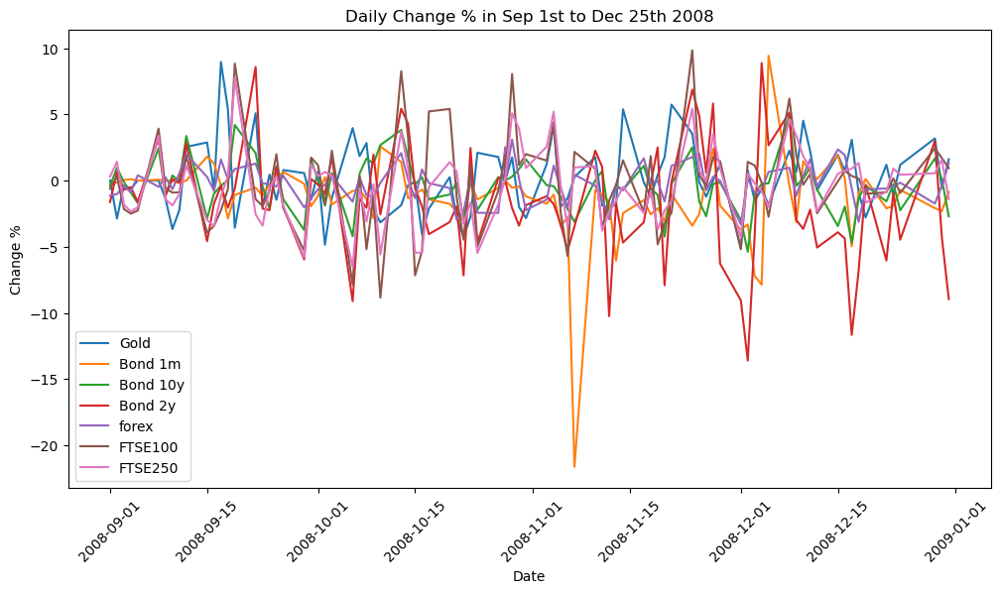

In [15]:
# Set the figure size
plt.figure(figsize=(12, 6))

# Sort the DataFrame by date ascending
daily_change_08 = daily_change_08.sort_values(by='date')

# Plot each column as a separate line
plt.plot(daily_change_08['date'], daily_change_08['gold %'], label='Gold')
plt.plot(daily_change_08['date'], daily_change_08['bond_1m %'], label='Bond 1m')
plt.plot(daily_change_08['date'], daily_change_08['bond_10y %'], label='Bond 10y')
plt.plot(daily_change_08['date'], daily_change_08['bond_2y %'], label='Bond 2y')
plt.plot(daily_change_08['date'], daily_change_08['forex %'], label='forex')
plt.plot(daily_change_08['date'], daily_change_08['ftse100 %'], label='FTSE100')
plt.plot(daily_change_08['date'], daily_change_08['ftse250 %'], label='FTSE250')

# Set the title and labels
plt.title('Daily Change % in Sep 1st to Dec 25th 2008')
plt.xlabel('Date')
plt.ylabel('Change %')

# Rotate x-axis 
plt.xticks(rotation=45)

# Add a legend
plt.legend()

# Show plot
plt.show()

Lot's of movement throughout the 4 months with multiple spikes in both directions

In [16]:
# Filter the speeches dataframe from Sep 1st to Dec 25th
speeches_08 = speeches[(speeches['date'] >= '2008-09-01') & (speeches['date'] <= '2008-12-25')]

# View the dataframe
speeches_08

,date,author,is_gov,vader_polarity,lm_polarity,finbert_polarity
305,2008-09-12,Tucker,False,0.9963,-0.465116,-0.101861
306,2008-09-18,No_Info,False,0.9970,-0.491525,-0.297006
307,2008-09-22,Gieve,False,0.9993,-0.422535,-0.182742
308,2008-09-24,Sentance,False,0.9987,-0.376471,-0.197890
309,2008-09-25,Barker,False,-0.9706,-0.446154,-0.311320
310,2008-10-13,Sentance,False,-0.9970,-0.681592,-0.686063
311,2008-10-21,King,True,-0.9673,-0.671642,-0.529721
312,2008-10-28,Besley,False,0.9998,-0.263158,-0.306998
313,2008-10-28,Gieve,False,0.9887,-0.530864,-0.275880
314,2008-10-29,Blanchflower,False,0.9980,-0.510086,-0.591367


Only one speech from the Governor Mervyn King in this time frame.

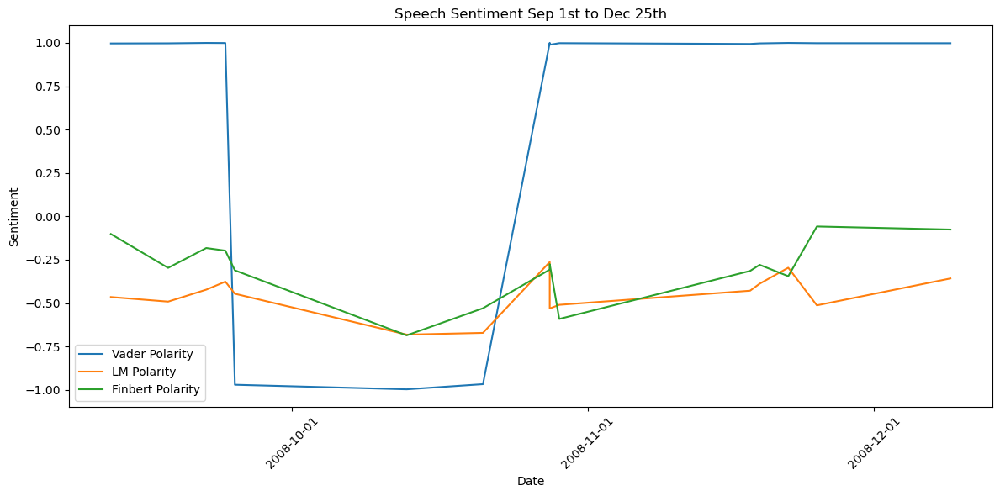

In [17]:
# Set the figure size
plt.figure(figsize=(12, 6))

# Plot each column as a separate line
plt.plot(speeches_08['date'], speeches_08['vader_polarity'], label='Vader Polarity')
plt.plot(speeches_08['date'], speeches_08['lm_polarity'], label='LM Polarity')
plt.plot(speeches_08['date'], speeches_08['finbert_polarity'], label='Finbert Polarity')

# Set the title and labels
plt.title('Speech Sentiment Sep 1st to Dec 25th')
plt.xlabel('Date')
plt.ylabel('Sentiment')

# Rotate x-axis
plt.xticks(rotation=45)

# Set the x-axis ticks to display every month
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))

# Format the date ticks
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

# Add a legend
plt.legend()

# Show plot
plt.tight_layout()
plt.show()

The speeches are especially variable in the Vader scores, it seems it's either very positive or very negative. Finbert and LM are loosely aligned but do not display much positive sentiment compared to Vader. Note: 28-10-2008 there is in bold as there were 2 speeches.

Will plot the 2 together and see if there are any correlations between the spikes and speeches. The 4 months 

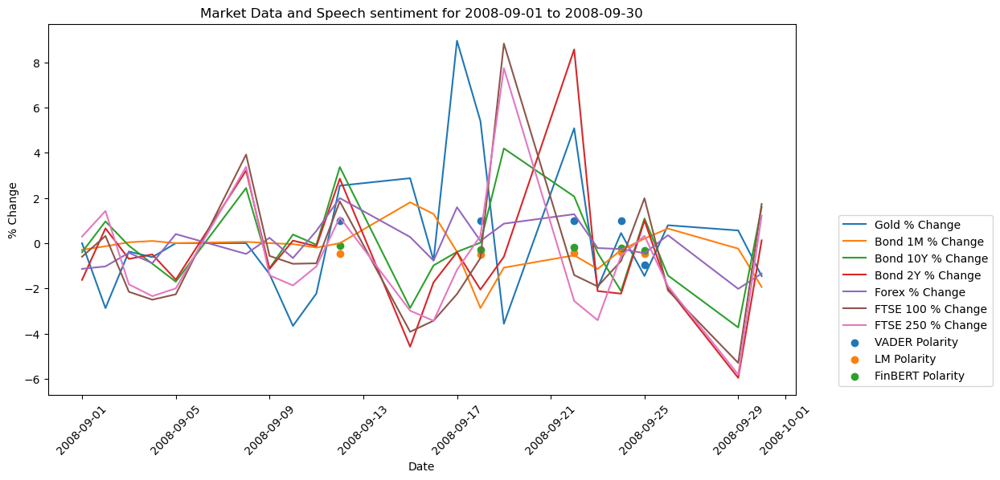

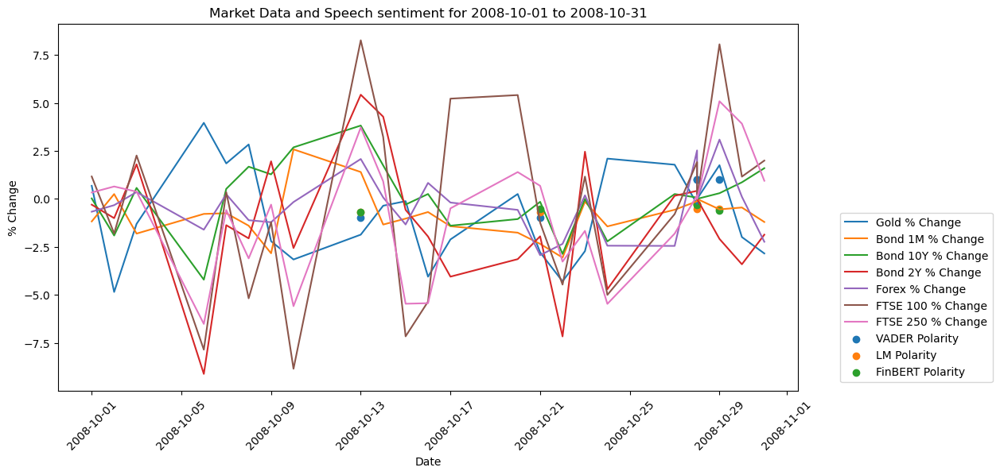

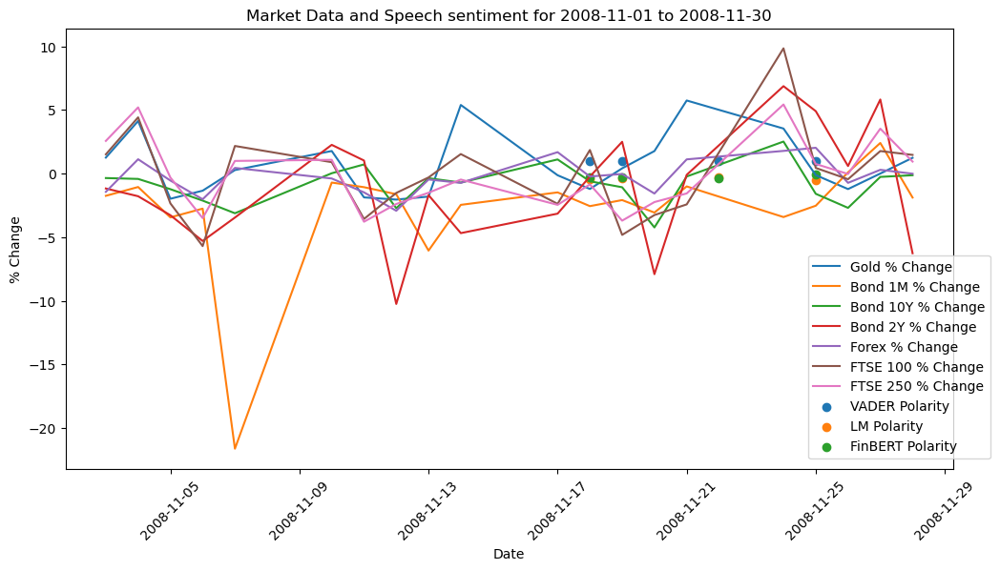

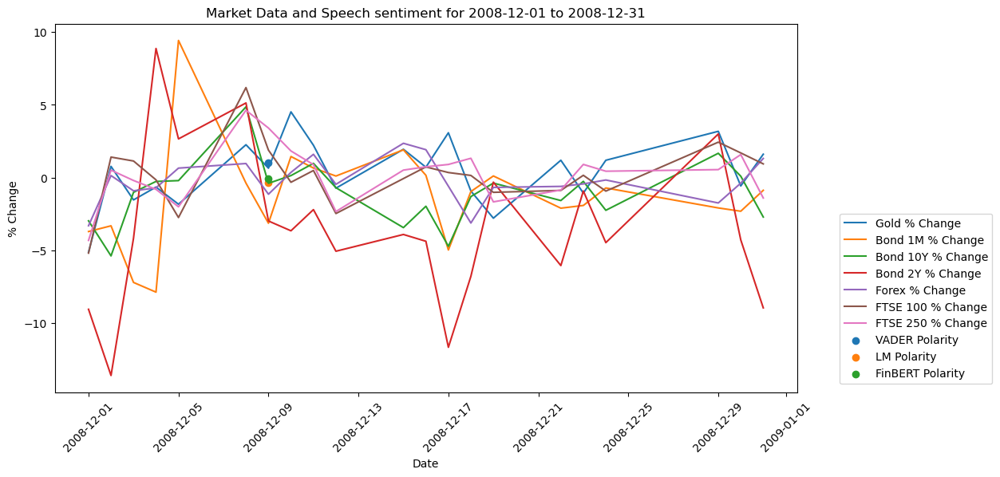

In [18]:
# Create a function to plot the market indicators with the speech dates and sentiment.
def plot_markets(start_date: str, end_date: str, df: pd.DataFrame, sentiment_df: pd.DataFrame) -> None:
    """
    Plot market data for a given date range with date on the x-axis and % change on the y-axis.

    :param start_date: Start date for the date range.
    :param end_date: End date for the date range.
    :param df: DataFrame containing market data.
    :param sentiment_df: DataFrame containing sentiment scores.
    :return: None
    """

    # Subset data by date range
    date_data = df[(df["date"] >= start_date) & (df["date"] <= end_date)]

    # Sort data by date in ascending order
    date_data = date_data.sort_values(by="date")

    # Plot % change on y-axis
    plt.figure(figsize=(12, 6))
    plt.plot(date_data["date"], date_data["gold %"], label="Gold % Change")
    plt.plot(date_data["date"], date_data["bond_1m %"], label="Bond 1M % Change")
    plt.plot(date_data["date"], date_data["bond_10y %"], label="Bond 10Y % Change")
    plt.plot(date_data["date"], date_data["bond_2y %"], label="Bond 2Y % Change")
    plt.plot(date_data["date"], date_data["forex %"], label="Forex % Change")
    plt.plot(date_data["date"], date_data["ftse100 %"], label="FTSE 100 % Change")
    plt.plot(date_data["date"], date_data["ftse250 %"], label="FTSE 250 % Change")

    # Subset sentiment data by date range
    sentiment_data = sentiment_df[(sentiment_df["date"] >= start_date) & (sentiment_df["date"] <= end_date)]

    # Plot sentiment scores as scatter dots
    plt.scatter(sentiment_data["date"], sentiment_data["vader_polarity"], label="VADER Polarity")
    plt.scatter(sentiment_data["date"], sentiment_data["lm_polarity"], label="LM Polarity")
    plt.scatter(sentiment_data["date"], sentiment_data["finbert_polarity"], label="FinBERT Polarity")

    # Set x and y labels
    plt.xlabel("Date")
    plt.ylabel("% Change")

    # Set title
    plt.title(f"Market Data and Speech sentiment for {start_date} to {end_date}")

    # Rotate x-tick labels
    plt.xticks(rotation=45)

    # Show the plot legend
    plt.legend(bbox_to_anchor=(1.05, 0.5))

    # Show the plot
    plt.show()

plot_markets("2008-09-01", "2008-09-30", daily_change_08, speeches_08)
plot_markets("2008-10-01", "2008-10-31", daily_change_08, speeches_08)
plot_markets("2008-11-01", "2008-11-30", daily_change_08, speeches_08)
plot_markets("2008-12-01", "2008-12-31", daily_change_08, speeches_08)

There does seem to be spikes around the speeches consistently. But also lots of movements when there are no speeches.

A quick look at movement around Marvyn Kings only speech

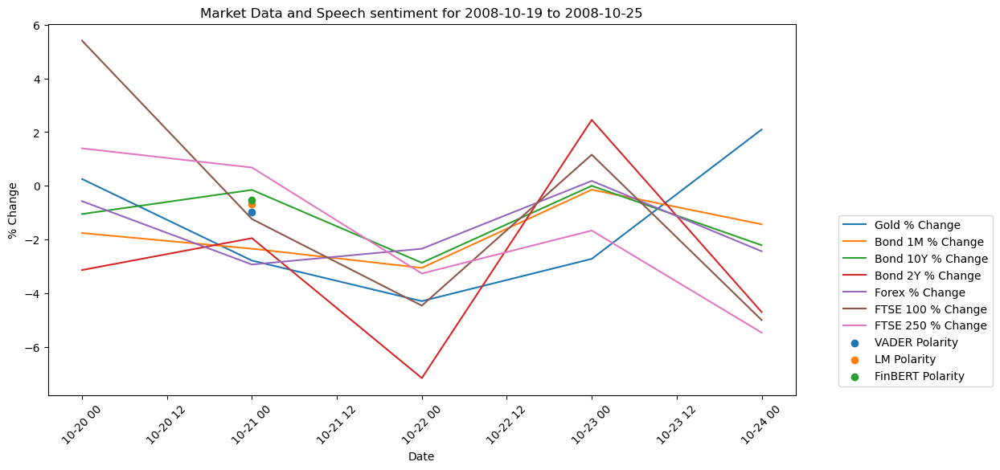

In [19]:
# Plot the week of Mervyn Kings speech
plot_markets("2008-10-19", "2008-10-25", daily_change_08, speeches_08)

A definitive drop in the markets after his speech which was notably negative even with the vader score which is not common.

And also a look at Andrew Sentence's speech 

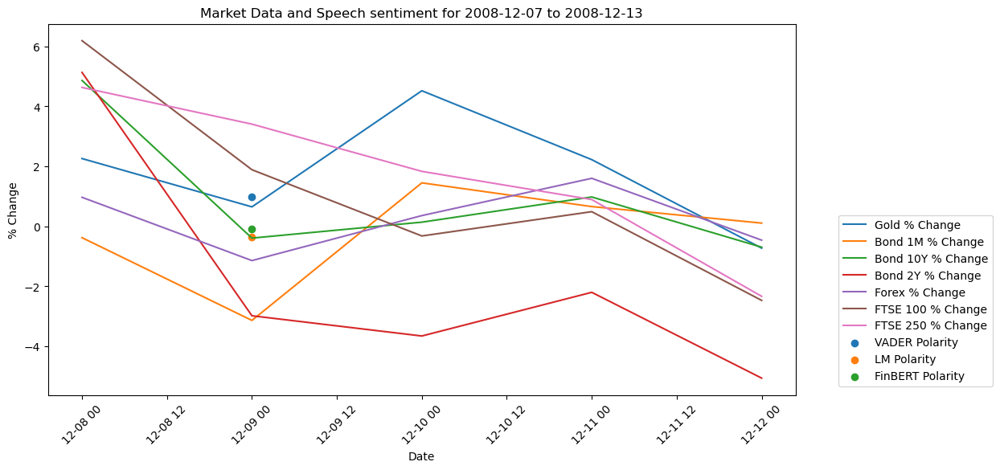

In [20]:
# Plot the week of Andrew Sentence's speech
plot_markets("2008-12-07", "2008-12-13", daily_change_08, speeches_08)

Will look into the Governor speeches as a whole as it will be interesting to see their effect solely before taking a broader look at all speeches.

In [21]:
# Filter rows where is_gov is True
gov = speeches[speeches['is_gov'] == True]

# Remove the is_gov column
gov = gov.drop(columns=['is_gov'])

# View the DataFrame
gov

,date,author,vader_polarity,lm_polarity,finbert_polarity
10,1999-05-17,King,0.9999,-0.181395,0.078723
18,1999-08-27,King,1.0000,-0.344000,-0.002053
19,1999-09-09,King,0.9986,-0.331429,-0.032255
22,1999-10-11,King,0.9997,-0.135484,-0.046509
31,2000-01-07,King,0.9997,-0.324138,-0.002200
...,...,...,...,...,...
1150,2022-02-10,Bailey,0.9981,-0.205479,0.685081
1166,2022-05-23,Bailey,-0.9771,-0.565217,-0.026249
1177,2022-07-12,Bailey,0.9998,-0.051948,-0.004046
1181,2022-07-19,Bailey,0.9789,-0.619048,-0.032983


188 speeches in the whole dataframe by governors, not a great amount each year at circa 8.

Makes me wonder how many of those are negative as the Mervyn King speech above was on 21-08-2008

In [22]:
# Create Dataframe with all negative Governor speeches
neg_gov = gov[(gov["vader_polarity"] <= 0) & (gov["lm_polarity"] <= 0) & (gov["finbert_polarity"] <= 0)]

# View the data frame
neg_gov

,date,author,vader_polarity,lm_polarity,finbert_polarity
183,2004-12-01,King,-0.9853,-0.265116,-0.003149
311,2008-10-21,King,-0.9673,-0.671642,-0.529721
356,2009-10-20,King,-0.4548,-0.441860,-0.220575
427,2011-03-17,Bailey,-0.9933,-0.314685,-0.227303
505,2012-05-02,King,-0.9989,-0.502959,-0.253631
509,2012-05-24,Bailey,-0.8651,-0.417722,-0.484257
540,2012-11-07,Bailey,-0.7131,-0.582418,-0.251665
672,2014-12-04,Bailey,-0.9926,-0.546296,-0.164077
775,2016-03-09,Bailey,-0.9974,-0.428571,-0.012757
798,2016-06-30,Carney,-0.9900,-0.263736,-0.451044


Only 11 speeches in total by Governors that all score poorly for sentiment. None others for the time frame I'm looking into but considering the time frame of 24 years and the shocks to the financial systems during that time then that is very low.

In [23]:
# Create function to plot sentiment for any given date 
def gov_sentiment(start_date: str, end_date: str, gov : pd.DataFrame) -> None:
    """
    Plot polarity scores for a given date range.

    :param start_date: Start date for the date range.
    :param end_date: End date for the date range.
    :param df: DataFrame containing polarity data.
    :return: None
    """

    # Subset data by date range
    gov_sentiment = gov[(gov["date"] >= start_date) & (gov["date"] <= end_date)]

    # Sort data by date in ascending order
    gov_sentiment = gov_sentiment.sort_values(by="date")

    # Plot polarity scores on y-axis
    plt.figure(figsize=(12, 6))
    plt.plot(gov_sentiment["date"], gov_sentiment["vader_polarity"], label="Vader Polarity")
    plt.plot(gov_sentiment["date"], gov_sentiment["lm_polarity"], label="LM Polarity")
    plt.plot(gov_sentiment["date"], gov_sentiment["finbert_polarity"], label="FinBERT Polarity")

    # Set x and y labels
    plt.xlabel("Date")
    plt.ylabel("Polarity Score")

    # Set title
    plt.title(f"Sentiment Data for {start_date} to {end_date}")

    # Rotate x-tick labels by 90 degrees
    plt.xticks(rotation=90)

    # Show the plot legend
    plt.legend()

    # Show the plot
    plt.show()

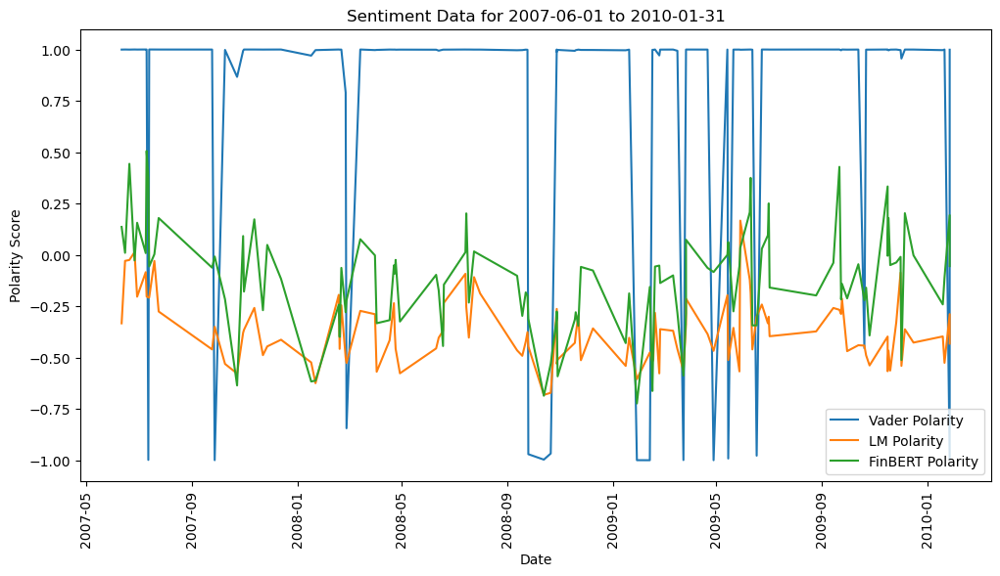

In [24]:
# Plot Governor speech sentiment for the selected time frame
gov_sentiment("2007-06-01", "2010-01-31", speeches)

Will visualise plots for the markets and speeches in July '07, Sep '07, Feb '08 and Sep '08. Periods with low Vader scores.

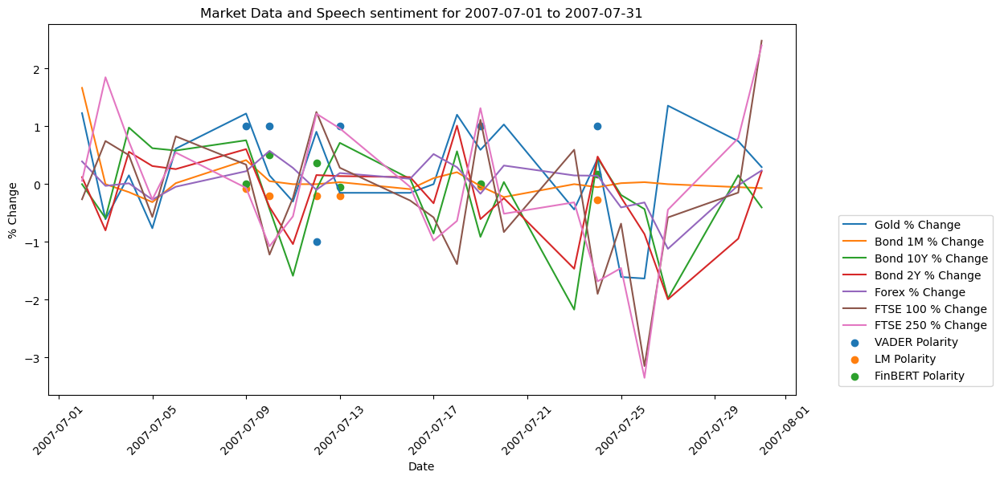

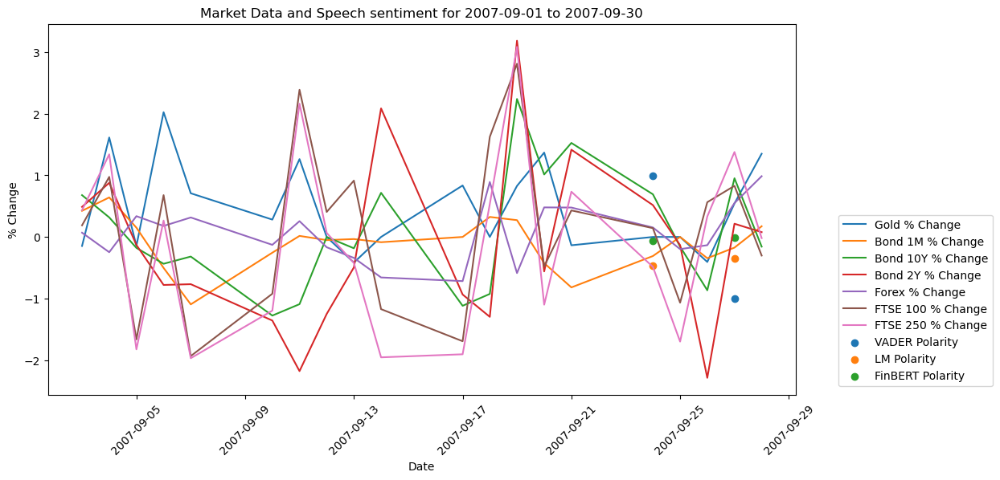

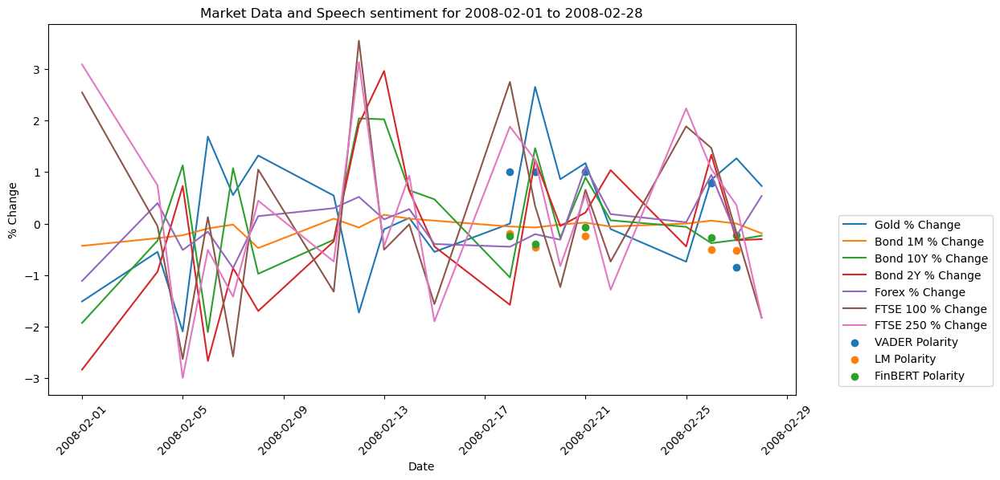

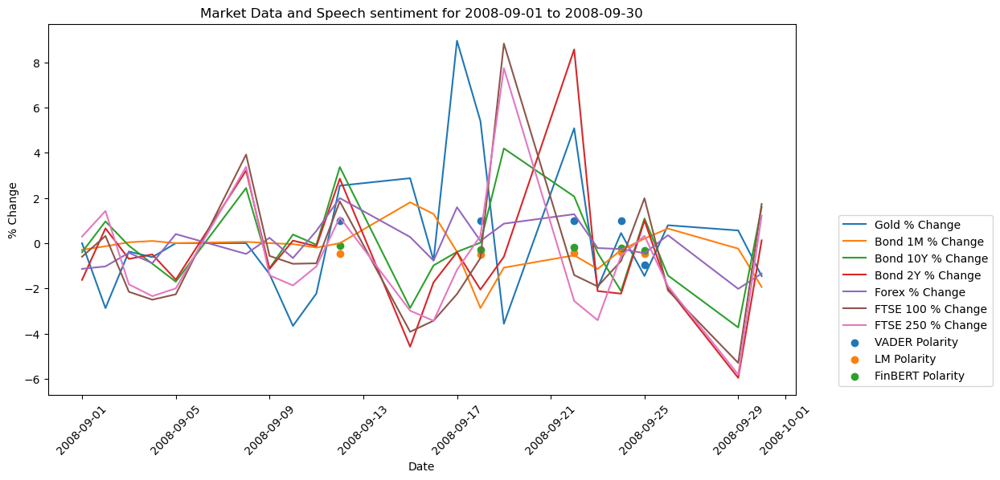

In [25]:
# Plot the months with the negative spikes in the Vader scores from above
plot_markets("2007-07-01", "2007-07-31", daily_change, speeches)
plot_markets("2007-09-01", "2007-09-30", daily_change, speeches)
plot_markets("2008-02-01", "2008-02-28", daily_change, speeches)
plot_markets("2008-09-01", "2008-09-30", daily_change, speeches)

So as noted earlier, there seems to always be movement in the markets at the time of speeches, more often than not in a negative direction, you'd imagine due to the sentiment at this time. It would be good to look into some positive periods and see how they correspond.

Firstly, the positive speeches for the Governor, with so few negative ones then there must be far more in the positve zone.

In [26]:
# Dataframe with all Governor speeches all positive
pos_gov = gov[(gov["vader_polarity"] >= 0) & (gov["lm_polarity"] >= 0) & (gov["finbert_polarity"] >= 0)]

# View the dataframe
pos_gov

,date,author,vader_polarity,lm_polarity,finbert_polarity
119,2002-04-23,King,0.9994,0.028571,0.485268
153,2003-10-14,King,0.9996,0.097561,0.339603
160,2004-01-20,King,0.9941,0.023256,0.000335
170,2004-06-14,King,0.9995,0.152174,0.470786
171,2004-06-16,King,0.9996,0.253731,0.327141
226,2006-06-21,King,0.9997,0.016393,0.000245
240,2006-11-16,King,0.9996,0.409091,0.253240
394,2010-09-21,Bailey,0.9994,0.257732,0.353406
419,2011-02-18,King,0.9473,0.034483,0.007198
440,2011-05-19,Bailey,0.9997,0.109827,0.004943


In [27]:
# Count the positive speeches
pos_gov.count()

date                46
author              46
vader_polarity      46
lm_polarity         46
finbert_polarity    46
dtype: int64

Notably, there are no positive speeches in the time frame of the financial crisis which is not a surprise, but a total of 45 in total for the whole 1998 to 2022, approximately 25% of all the Governor's speeches is quite low and alludes to the fact that many of the LM and FinBERT scores are below 0 even when Vader is in the positive range.

In [28]:
# Dataframe with all negative speeches
neg_speeches = speeches[(speeches["vader_polarity"] <= 0) & (speeches["lm_polarity"] <= 0) & (speeches["finbert_polarity"] <= 0)]

# View the dataframe
neg_speeches

,date,author,is_gov,vader_polarity,lm_polarity,finbert_polarity
17,1999-08-15,Brealey,False,-0.9979,-0.535433,-0.120152
25,1999-11-05,Buiter,False,-0.9924,-0.652928,-0.057474
59,2000-09-06,Clementi,False,-0.9935,-0.565934,-0.050873
95,2001-09-19,Allsopp,False,-0.9849,-0.398773,-0.287922
134,2002-12-06,Nickell,False,-0.9998,-0.590476,-0.034800
...,...,...,...,...,...,...
1165,2022-05-20,Pill,False,-0.9998,-0.412571,-0.103677
1166,2022-05-23,Bailey,True,-0.9771,-0.565217,-0.026249
1183,2022-09-07,Bowe,False,-0.9702,-0.420000,-0.220679
1189,2022-10-06,Haskel,False,-0.4517,-0.489209,-0.059072


In [29]:
# Dataframe with all positive speeches
pos_speeches = speeches[(speeches["vader_polarity"] >= 0) & (speeches["lm_polarity"] >= 0) & (speeches["finbert_polarity"] >= 0)]

# View the dataframe
pos_speeches

,date,author,is_gov,vader_polarity,lm_polarity,finbert_polarity
3,1999-02-01,George,False,0.9997,0.050505,0.184429
15,1999-06-14,Clementi,False,0.9995,0.240000,0.000624
16,1999-06-17,Clementi,False,0.9997,0.086957,0.250336
26,1999-11-19,George,False,0.9998,0.041916,0.325424
36,2000-02-23,Wadhwani,False,1.0000,0.100304,0.218039
...,...,...,...,...,...,...
1172,2022-06-28,Rosen,False,0.9998,0.101449,0.055064
1173,2022-06-29,Cleland,False,0.9998,0.211268,0.769081
1182,2022-07-20,Benjamin,False,0.9995,0.185185,0.630510
1186,2022-09-28,Cunliffe,False,0.9999,0.000000,0.195405


In total through all the 1195 speeches there are only 71 with all sentiment scores below 0 and solely negative, whilst 179 have all their sentiment scores above 0 and wholey positive.

This makes me question the validity of the Vader scores and why they are so positive. Conversely, it also raises questions about why the LM and FinBERT scores are so negative. Given that LM and FinBERT are more financial tools, while Vader is more aligned with normal life, could this create a happy medium? Are there less positive words within the financial realms of LM and FinBERT?

So, moving on. I've selected April '19 until July '19 as there are 4 speeches in there that all score highly in their sentiment. 15	

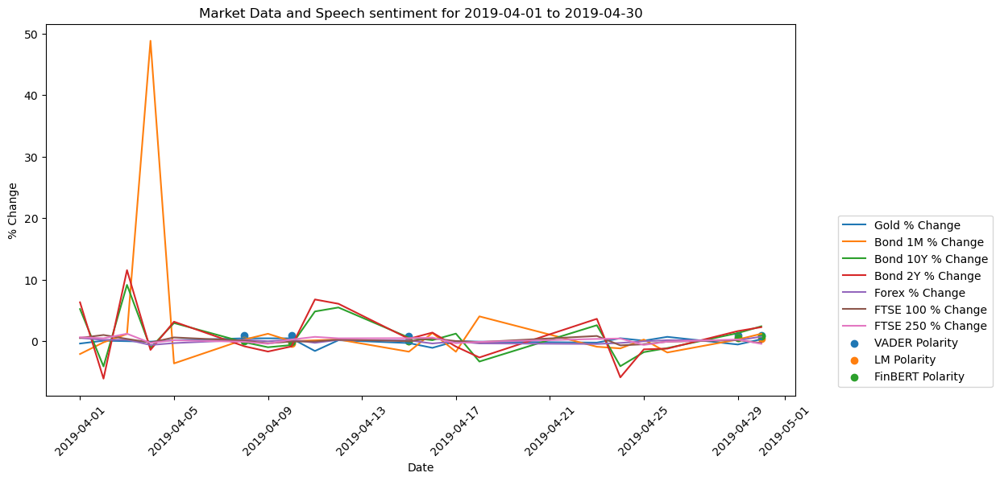

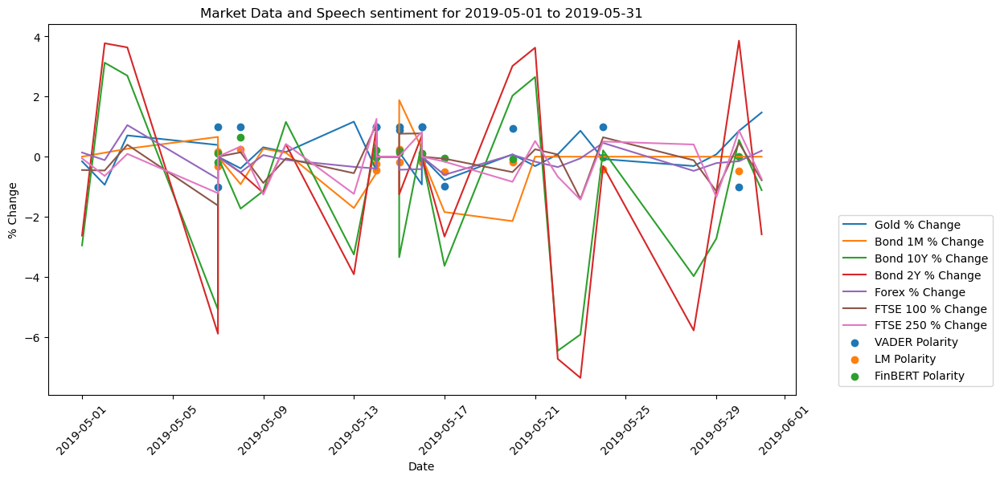

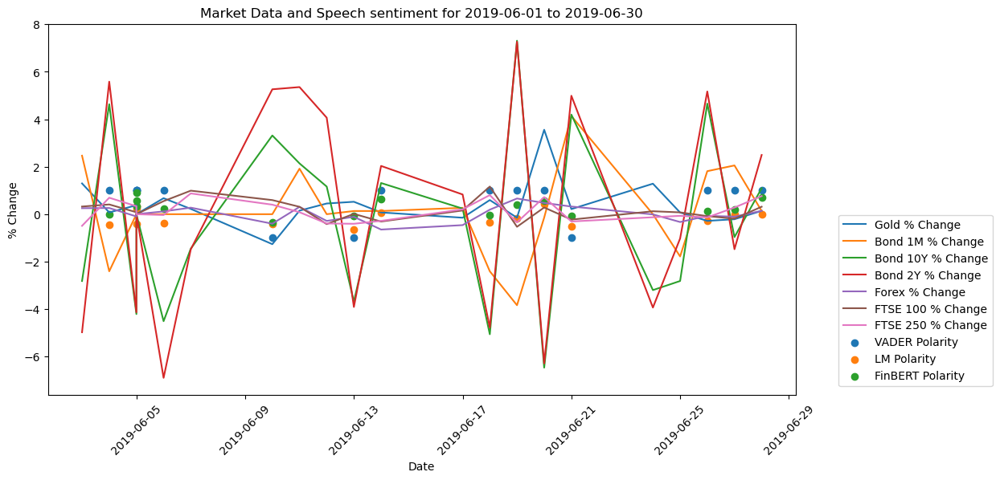

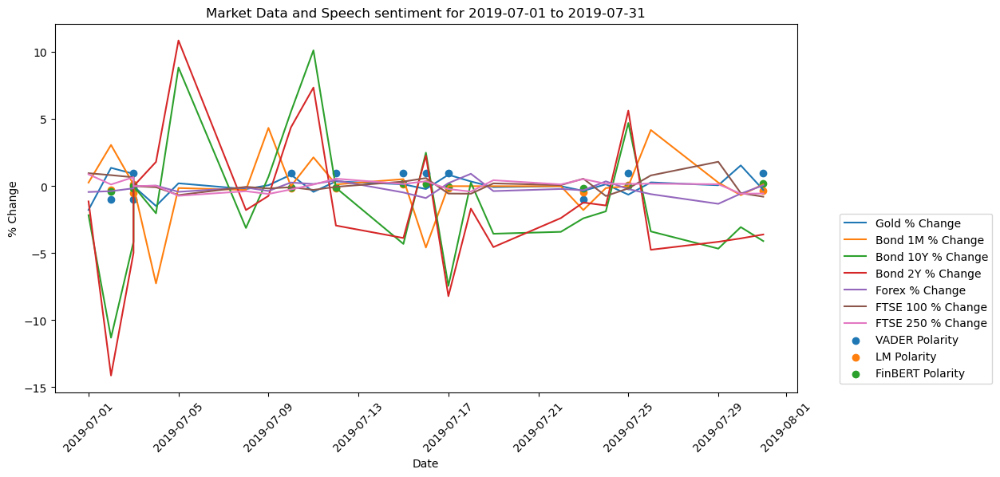

In [30]:
# Plot the months with the positive spikes in the Vader scores from above
plot_markets("2019-04-01", "2019-04-30", daily_change, speeches)
plot_markets("2019-05-01", "2019-05-31", daily_change, speeches)
plot_markets("2019-06-01", "2019-06-30", daily_change, speeches)
plot_markets("2019-07-01", "2019-07-31", daily_change, speeches)

Well, the bonds market certainly have dramatic movements both positive or negative.
It seems that Gold and the FTSE are more reactive in negative sentiment times than when it's positive.

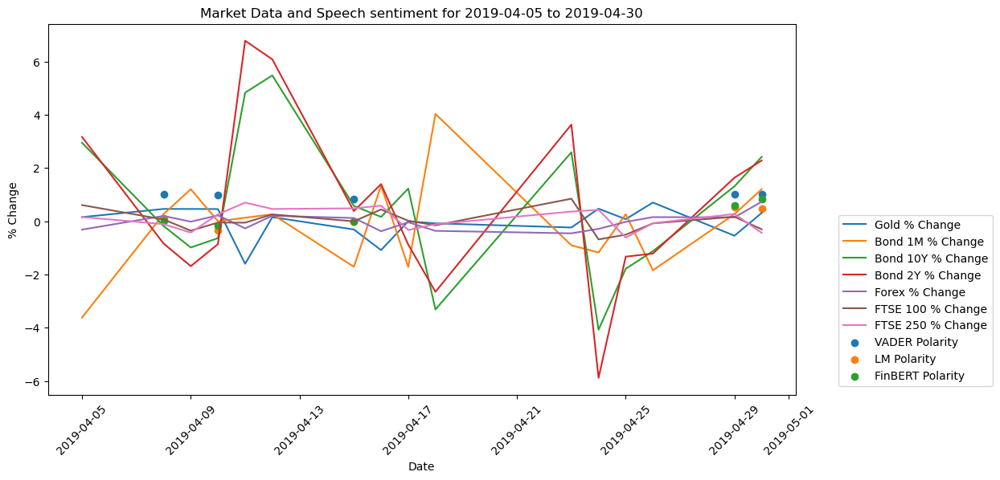

In [31]:
# Replotting to avoid the large 1-month bond spike, seeing as there are no speeches at 
# that time then it was only serving to dilute the plot.
plot_markets("2019-04-05", "2019-04-30", daily_change, speeches)

Most speeches do result in spikes, but there are often times with no speeches and spikes also. Enough to consider if Fed speeches or ECB speeches happened then? I'm not sure time will allow us to analyse their correlation.

Because Bonds seem to fluctuate in larger amounts I then opted to plot them separate from the other markets in hope of more defined viewing.

In [32]:
# Create a function to plot bonds seperately from the other indicators
def plot_markets2(start_date: str, end_date: str, df: pd.DataFrame, sentiment_df: pd.DataFrame) -> None:
    """
    Plot market data for a given date range with date on the x-axis and % change on the y-axis.

    :param start_date: Start date for the date range.
    :param end_date: End date for the date range.
    :param df: DataFrame containing market data.
    :param sentiment_df: DataFrame containing sentiment scores.
    :return: None
    """

    # Subset data by date range
    date_data = df[(df["date"] >= start_date) & (df["date"] <= end_date)]

    # Sort data by date in ascending order
    date_data = date_data.sort_values(by="date")

    # Create two subplots
    fig, (ax1, ax2) = plt.subplots(nrows=2, figsize=(12, 6))

    # Plot % change for bonds on y-axis for the first subplot
    ax1.plot(date_data["date"], date_data["bond_1m %"], label="Bond 1M % Change")
    ax1.plot(date_data["date"], date_data["bond_10y %"], label="Bond 10Y % Change")
    ax1.plot(date_data["date"], date_data["bond_2y %"], label="Bond 2Y % Change")

    # Plot sentiment scores as scatter dots for the first subplot
    sentiment_data = sentiment_df[(sentiment_df["date"] >= start_date) & (sentiment_df["date"] <= end_date)]
    ax1.scatter(sentiment_data["date"], sentiment_data["vader_polarity"], label="VADER Polarity")
    ax1.scatter(sentiment_data["date"], sentiment_data["lm_polarity"], label="LM Polarity")
    ax1.scatter(sentiment_data["date"], sentiment_data["finbert_polarity"], label="FinBERT Polarity")

    # Set x and y labels for the first subplot
    # Remove x-ticker labels and title for the first subplot
    ax1.set_ylabel("% Change")
    ax1.set_xlabel("")
    plt.setp(ax1.get_xticklabels(), visible=False)
    

    # Set title for the first subplot
    ax1.set_title(f"Speech sentiment for {start_date} to {end_date}\n against Bonds")

    # Rotate x-tick labels for the first subplot
    plt.setp(ax1.get_xticklabels(), rotation=45)

    # Plot % change for other markets on y-axis for the second subplot
    ax2.plot(date_data["date"], date_data["gold %"], label="Gold % Change")
    ax2.plot(date_data["date"], date_data["forex %"], label="Forex % Change")
    ax2.plot(date_data["date"], date_data["ftse100 %"], label="FTSE 100 % Change")
    ax2.plot(date_data["date"], date_data["ftse250 %"], label="FTSE 250 % Change")

    # Plot sentiment scores as scatter dots for the second subplot
    ax2.scatter(sentiment_data["date"], sentiment_data["vader_polarity"], label="VADER Polarity")
    ax2.scatter(sentiment_data["date"], sentiment_data["lm_polarity"], label="LM Polarity")
    ax2.scatter(sentiment_data["date"], sentiment_data["finbert_polarity"], label="FinBERT Polarity")

    # Set x and y labels for the second subplot
    ax2.set_xlabel("Date")
    ax2.set_ylabel("% Change")

    # Set title for the second subplot
    ax2.set_title(f"Speech sentiment for {start_date} to {end_date}\n against Other Markets")

    # Rotate x-tick labels for the second subplot
    plt.setp(ax2.get_xticklabels(), rotation=45, ha='right')

    # Show the plot legend
    ax1.legend(bbox_to_anchor=(1.05, 0.5))
    ax2.legend(bbox_to_anchor=(1.05, 0.5))

    # Show the plot
    plt.show()

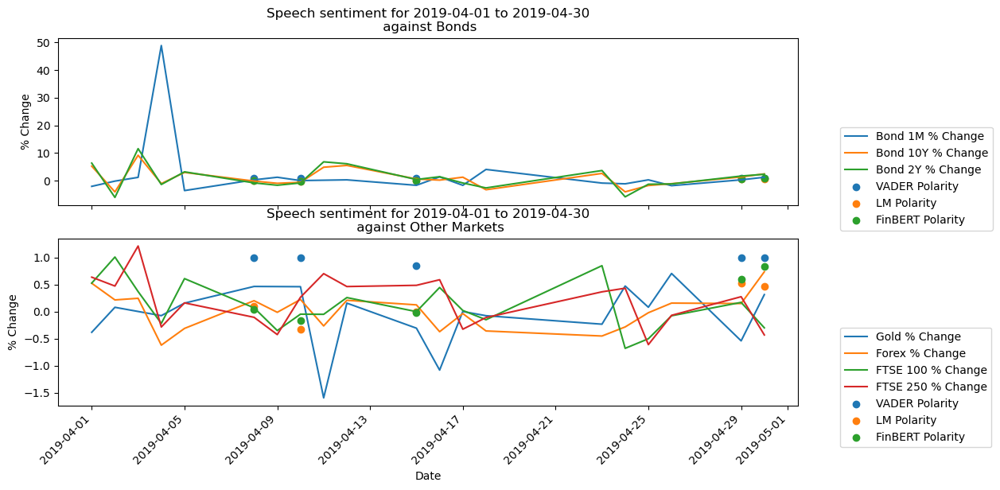

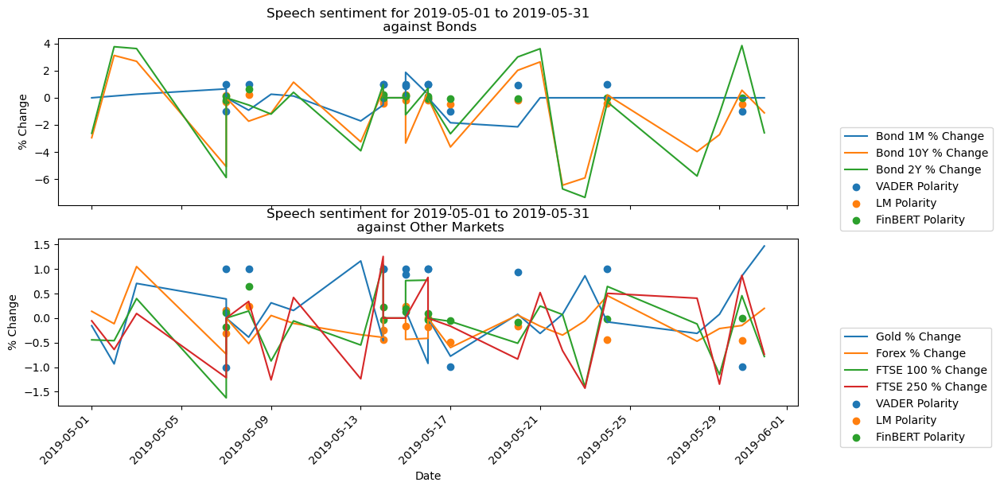

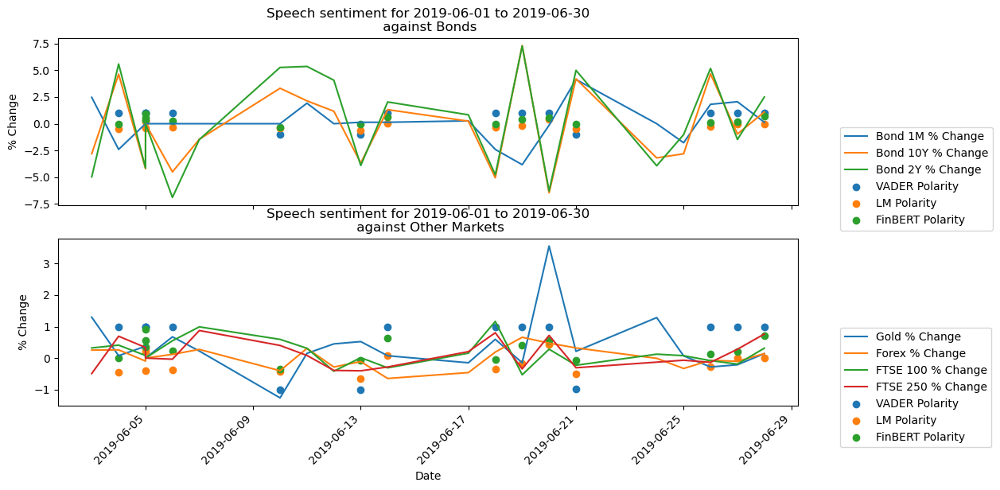

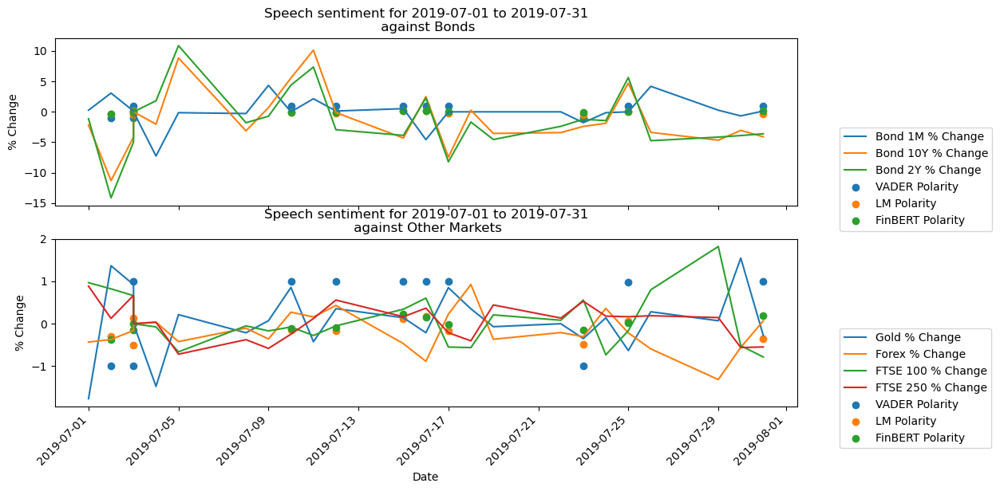

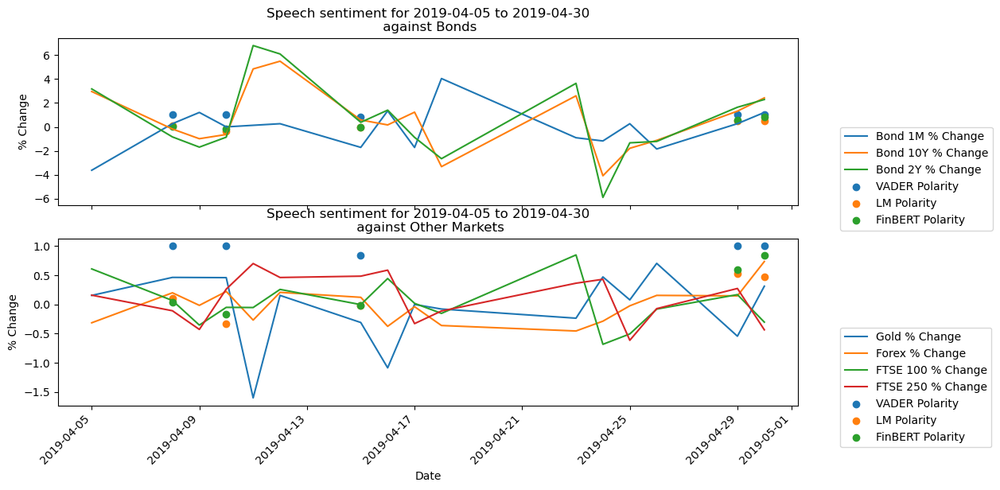

In [33]:
# Plot the months with the positive spikes in the Vader scores from above
plot_markets2("2019-04-01", "2019-04-30", daily_change, speeches) 
plot_markets2("2019-05-01", "2019-05-31", daily_change, speeches)
plot_markets2("2019-06-01", "2019-06-30", daily_change, speeches)
plot_markets2("2019-07-01", "2019-07-31", daily_change, speeches)

# Large spike early April so replotting as no speech around then to give more defined lineplot
plot_markets2("2019-04-05", "2019-04-30", daily_change, speeches)

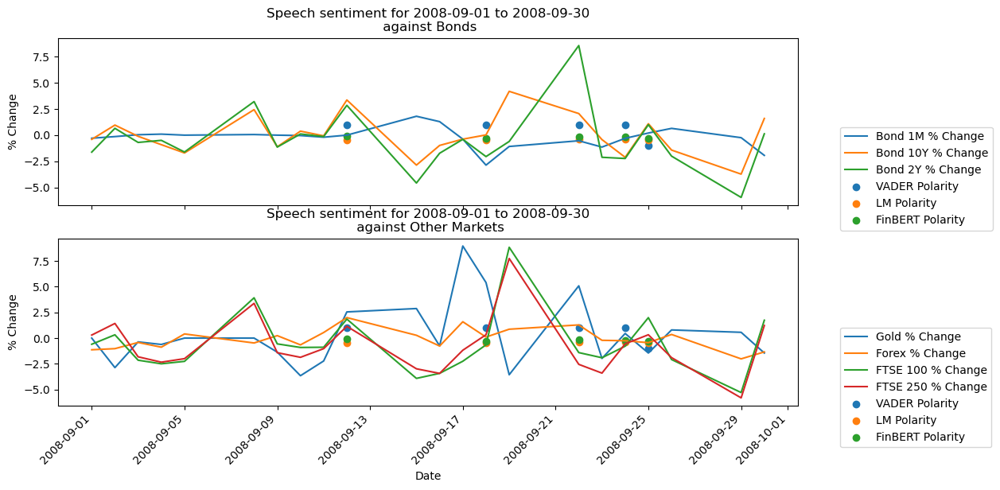

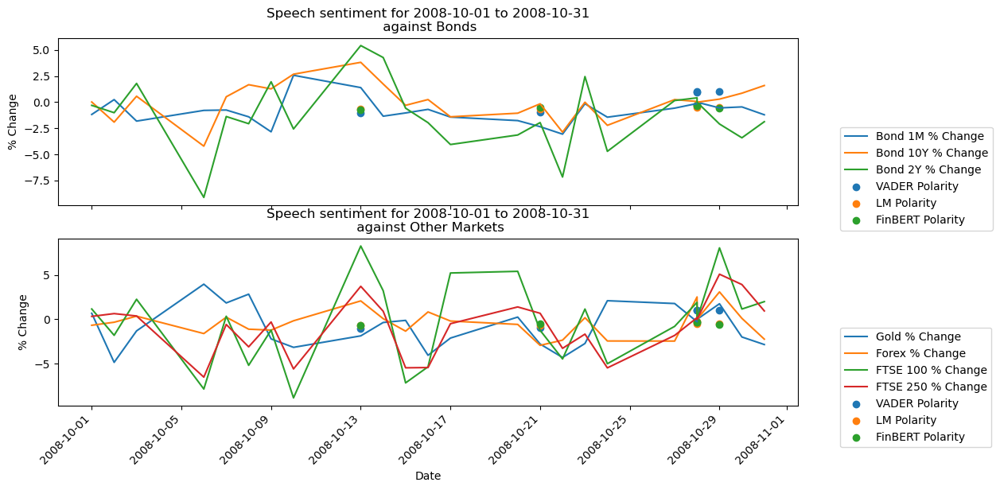

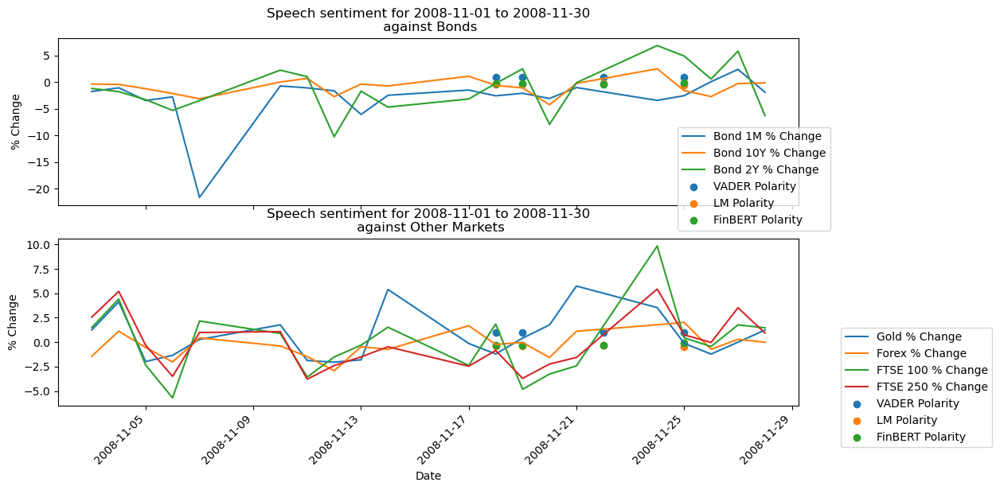

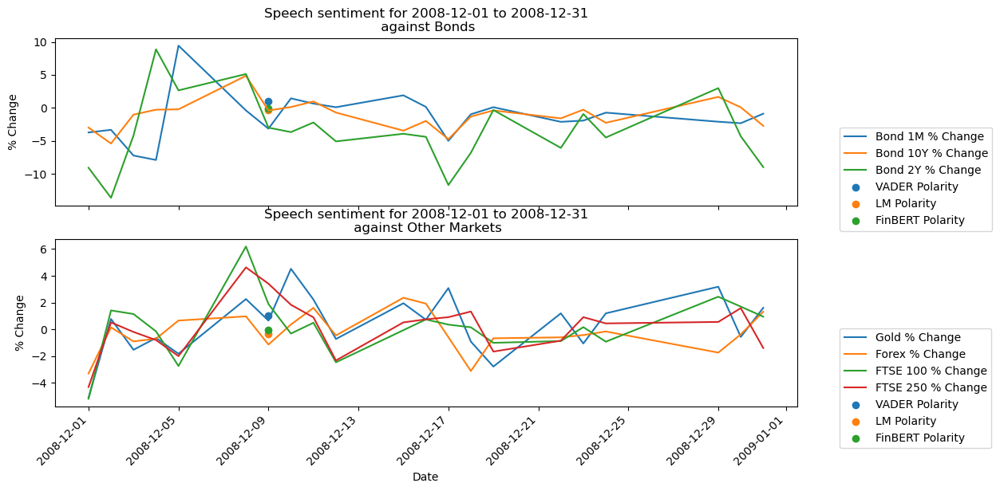

In [34]:
# Plot the last 4 months of 2008
plot_markets2("2008-09-01", "2008-09-30", daily_change, speeches)
plot_markets2("2008-10-01", "2008-10-31", daily_change, speeches)
plot_markets2("2008-11-01", "2008-11-30", daily_change, speeches)
plot_markets2("2008-12-01", "2008-12-31", daily_change, speeches)

## Conclusions
The markets do tend to fluctuate around the dates of speeches. Sentiment, whether extremely negative or positive, drives movements in the markets, with bonds being the most volatile. Additionally, during times of positive sentiment, fluctuations tend to be smaller compared to periods of negative sentiment. It should be noted that the markets also exhibit significant movement when no speeches occur, indicating that speeches alone are not the sole driving force behind market fluctuations.

Some interesting insights in this preliminary analysis will dig deeper after a look at GDP, CPI, Unemployment, and Wage growth.

All this initial analysis was done using all 3 NLP models, for future investigations it was decided to use solely FinBERT polarity scores only.

# Additional analysis

Firstly, with around 1200 speeches then I'd like to look at the Governor's speeches solely and now that we have decided on FinBERT as the NLP model we are using drop the other 2 models from the analysis.

In [35]:
# Convert to datetime
gov['date'] = pd.to_datetime(gov['date'])

# Drop LM and Vader
gov = gov.loc[:, ['date', 'finbert_polarity']]

# Drop years prior to 1999
gov = gov[(gov['date'] >= '1999-01-01') & (gov['date'] <= '2022-10-20')]

# View the dataframe
gov

,date,finbert_polarity
10,1999-05-17,0.078723
18,1999-08-27,-0.002053
19,1999-09-09,-0.032255
22,1999-10-11,-0.046509
31,2000-01-07,-0.002200
...,...,...
1150,2022-02-10,0.685081
1166,2022-05-23,-0.026249
1177,2022-07-12,-0.004046
1181,2022-07-19,-0.032983


In [36]:
# Merge 'gov' DataFrame with 'daily_change' DataFrame based on date
speech_day = pd.merge(gov, daily_change, on='date', how='inner')

# View the dataframe
speech_day

,date,finbert_polarity,gold %,bond_1m %,bond_10y %,bond_2y %,ftse100 %,ftse250 %,forex %
0,1999-05-17,0.078723,-0.361011,0.000000,0.187110,2.789088,-2.136374,-1.082655,-0.092650
1,1999-08-27,-0.002053,0.393701,0.000000,1.296915,0.406864,-0.136276,0.120718,0.063012
2,1999-09-09,-0.032255,0.389105,0.000000,-0.072701,3.536481,0.111936,-0.236781,0.969555
3,1999-10-11,-0.046509,-0.621118,0.000000,0.017599,-0.855805,0.571021,-0.234269,0.030257
4,2000-01-07,-0.002200,0.354610,0.000000,-0.972729,-0.030451,0.893405,1.212788,-0.491863
...,...,...,...,...,...,...,...,...,...
204,2022-02-10,0.685081,0.000000,-5.977011,7.053073,4.806202,0.379412,0.107288,0.169967
205,2022-05-23,-0.026249,0.325733,1.378579,4.285714,4.183267,1.669823,1.563819,0.808841
206,2022-07-12,-0.004046,-0.404157,-2.684564,-5.321101,-3.882979,0.184807,0.095557,-0.033645
207,2022-07-12,-0.004046,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [37]:
# Drop rows with duplicate 'finbert_polarity' scores and 'date', keeping the first occurrence
speech_day = speech_day.drop_duplicates(subset=['finbert_polarity', 'date'], keep='first')

# View the dataframe
speech_day

,date,finbert_polarity,gold %,bond_1m %,bond_10y %,bond_2y %,ftse100 %,ftse250 %,forex %
0,1999-05-17,0.078723,-0.361011,0.000000,0.187110,2.789088,-2.136374,-1.082655,-0.092650
1,1999-08-27,-0.002053,0.393701,0.000000,1.296915,0.406864,-0.136276,0.120718,0.063012
2,1999-09-09,-0.032255,0.389105,0.000000,-0.072701,3.536481,0.111936,-0.236781,0.969555
3,1999-10-11,-0.046509,-0.621118,0.000000,0.017599,-0.855805,0.571021,-0.234269,0.030257
4,2000-01-07,-0.002200,0.354610,0.000000,-0.972729,-0.030451,0.893405,1.212788,-0.491863
...,...,...,...,...,...,...,...,...,...
203,2021-09-27,-0.159087,0.000000,133.333333,3.904555,2.088773,0.168757,-0.000852,0.095015
204,2022-02-10,0.685081,0.000000,-5.977011,7.053073,4.806202,0.379412,0.107288,0.169967
205,2022-05-23,-0.026249,0.325733,1.378579,4.285714,4.183267,1.669823,1.563819,0.808841
206,2022-07-12,-0.004046,-0.404157,-2.684564,-5.321101,-3.882979,0.184807,0.095557,-0.033645


So now to explore the data on the day of each Governor speech.

In [38]:
# Calculate average and sum
average_change = speech_day[['gold %', 'bond_1m %', 'bond_10y %', 'bond_2y %', 'ftse100 %', 'ftse250 %', 'forex %']].mean(axis=1)
sum_change = speech_day[['gold %', 'bond_1m %', 'bond_10y %', 'bond_2y %', 'ftse100 %', 'ftse250 %', 'forex %']].sum(axis=1)
average_change_bonds = speech_day[['bond_1m %', 'bond_10y %', 'bond_2y %']].mean(axis=1)

# Add new columns to the DataFrame
speech_day['average_change'] = average_change
speech_day['sum_change'] = sum_change
speech_day['average_change_bonds'] = average_change_bonds

# View the dataframe
speech_day

,date,finbert_polarity,gold %,bond_1m %,bond_10y %,bond_2y %,ftse100 %,ftse250 %,forex %,average_change,sum_change,average_change_bonds
0,1999-05-17,0.078723,-0.361011,0.000000,0.187110,2.789088,-2.136374,-1.082655,-0.092650,-0.099499,-0.696491,0.992066
1,1999-08-27,-0.002053,0.393701,0.000000,1.296915,0.406864,-0.136276,0.120718,0.063012,0.306419,2.144933,0.567926
2,1999-09-09,-0.032255,0.389105,0.000000,-0.072701,3.536481,0.111936,-0.236781,0.969555,0.671085,4.697594,1.154593
3,1999-10-11,-0.046509,-0.621118,0.000000,0.017599,-0.855805,0.571021,-0.234269,0.030257,-0.156045,-1.092314,-0.279402
4,2000-01-07,-0.002200,0.354610,0.000000,-0.972729,-0.030451,0.893405,1.212788,-0.491863,0.137966,0.965761,-0.334393
...,...,...,...,...,...,...,...,...,...,...,...,...
203,2021-09-27,-0.159087,0.000000,133.333333,3.904555,2.088773,0.168757,-0.000852,0.095015,19.941369,139.589582,46.442220
204,2022-02-10,0.685081,0.000000,-5.977011,7.053073,4.806202,0.379412,0.107288,0.169967,0.934133,6.538931,1.960754
205,2022-05-23,-0.026249,0.325733,1.378579,4.285714,4.183267,1.669823,1.563819,0.808841,2.030825,14.215776,3.282520
206,2022-07-12,-0.004046,-0.404157,-2.684564,-5.321101,-3.882979,0.184807,0.095557,-0.033645,-1.720869,-12.046082,-3.962881


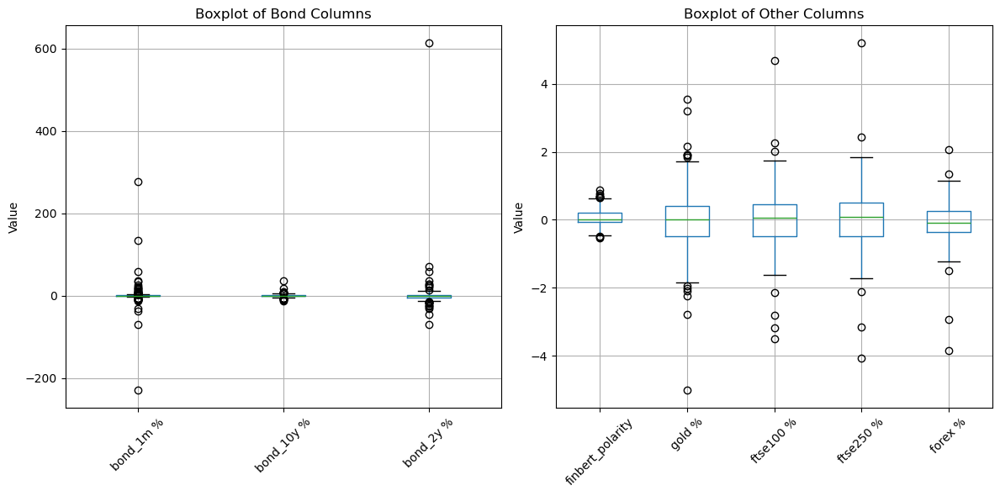

In [39]:
# Select columns for boxplot
bond_columns = ['bond_1m %', 'bond_10y %', 'bond_2y %']
other_columns = ['finbert_polarity', 'gold %', 'ftse100 %', 'ftse250 %', 'forex %']

# Create boxplots
plt.figure(figsize=(12, 6))

# Boxplot for bond columns
plt.subplot(1, 2, 1)
speech_day[bond_columns].boxplot()
plt.title('Boxplot of Bond Columns')
plt.ylabel('Value')
plt.xticks(rotation=45)

# Boxplot for other columns
plt.subplot(1, 2, 2)
speech_day[other_columns].boxplot()
plt.title('Boxplot of Other Columns')
plt.ylabel('Value')
plt.xticks(rotation=45)

# Show plot
plt.tight_layout()
plt.show()

Lots of outliers but these are all relevant due to the potential for them to be large swings due to speeches or other market moving incidents.

Looking into the percentage daily changes for the markets was the next move as well as the average and sum of the changes to see if anything significant could be seen.

First up and the lowest 40 Governor speeches. 

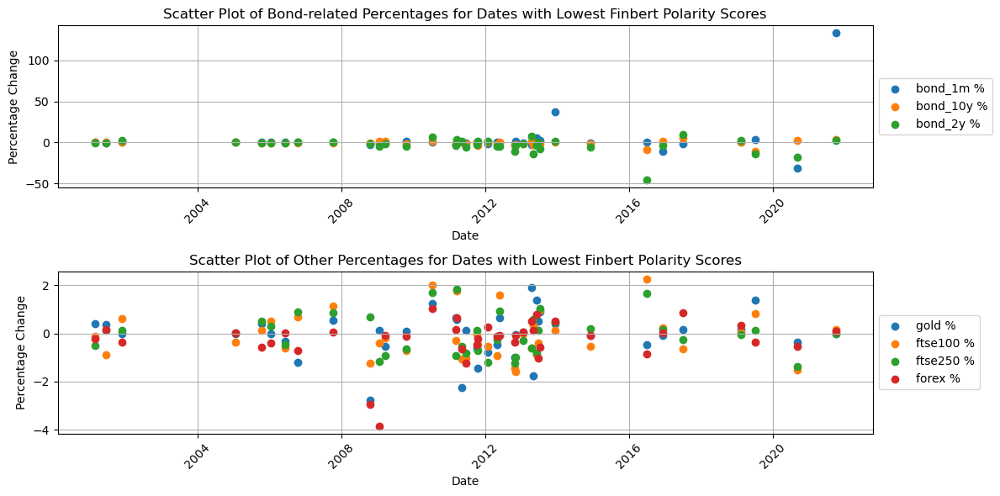

In [40]:
# Sort the DataFrame by 'finbert_polarity' in ascending order and select the lowest 40 scores
lowest_scores = speech_day.sort_values(by='finbert_polarity').head(40)

# Extract columns for each plot
bonds_columns = ['bond_1m %', 'bond_10y %', 'bond_2y %']
other_columns = ['gold %', 'ftse100 %', 'ftse250 %', 'forex %']

# Create two scatter plots
plt.figure(figsize=(12, 6))

# Scatter plot for bond-related percentages
plt.subplot(2, 1, 1)
for col in bonds_columns:
    plt.scatter(lowest_scores['date'], lowest_scores[col], label=col)
plt.xlabel('Date')
plt.ylabel('Percentage Change')
plt.title('Scatter Plot of Bond-related Percentages for Dates with Lowest Finbert Polarity Scores')
plt.xticks(rotation=45)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid(True)

# Scatter plot for other percentages
plt.subplot(2, 1, 2)
for col in other_columns:
    plt.scatter(lowest_scores['date'], lowest_scores[col], label=col)
plt.xlabel('Date')
plt.ylabel('Percentage Change')
plt.title('Scatter Plot of Other Percentages for Dates with Lowest Finbert Polarity Scores')
plt.xticks(rotation=45)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid(True)

# Show plot
plt.tight_layout()
plt.show()

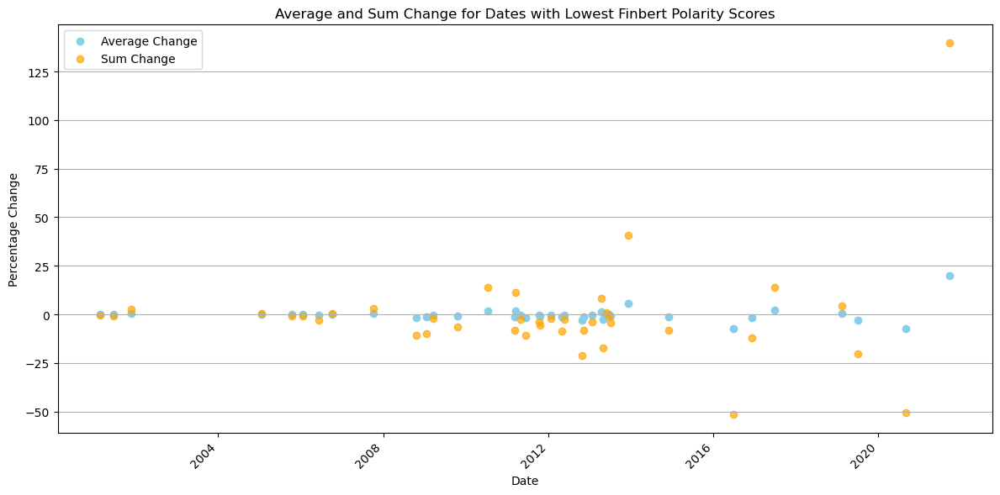

In [41]:
# Sort the DataFrame by 'finbert_polarity' in ascending order and select the 40 dates with the lowest scores
lowest_scores = speech_day.sort_values(by='finbert_polarity').head(40)

# Plot the 'average_change' and 'sum_change' for the selected dates as bar plots
plt.figure(figsize=(12, 6))
plt.scatter(lowest_scores['date'], lowest_scores['average_change'], label='Average Change', color='skyblue')
plt.scatter(lowest_scores['date'], lowest_scores['sum_change'], label='Sum Change', color='orange', alpha=0.7)

# Set the labels, title, legend
plt.xlabel('Date')
plt.ylabel('Percentage Change')
plt.title('Average and Sum Change for Dates with Lowest Finbert Polarity Scores')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.grid(True, axis='y')

# Show plot
plt.tight_layout()
plt.show()

This showed movements either side of zero so nothing stood out.

The 40 highest socring speeches were then looked into.

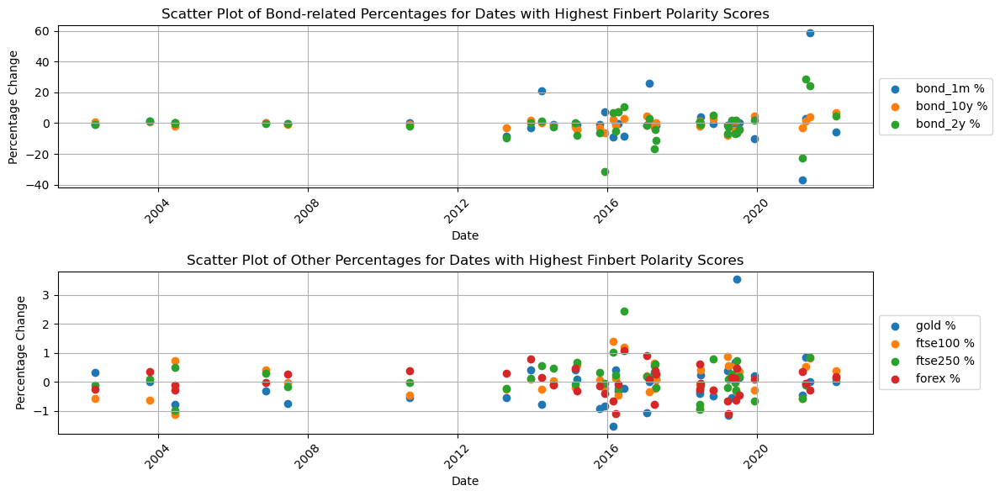

In [42]:
# Sort the DataFrame by 'finbert_polarity' in descending order and select the highest 40 scores
highest_scores = speech_day.sort_values(by='finbert_polarity', ascending=False).head(40)

# Extract columns for each plot
bonds_columns = ['bond_1m %', 'bond_10y %', 'bond_2y %']
other_columns = ['gold %', 'ftse100 %', 'ftse250 %', 'forex %']

# Create two scatter plots
plt.figure(figsize=(12, 6))

# Scatter plot for bond-related percentages
plt.subplot(2, 1, 1)
for col in bonds_columns:
    plt.scatter(highest_scores['date'], highest_scores[col], label=col)
plt.xlabel('Date')
plt.ylabel('Percentage Change')
plt.title('Scatter Plot of Bond-related Percentages for Dates with Highest Finbert Polarity Scores')
plt.xticks(rotation=45)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid(True)

# Scatter plot for other percentages
plt.subplot(2, 1, 2)
for col in other_columns:
    plt.scatter(highest_scores['date'], highest_scores[col], label=col)
plt.xlabel('Date')
plt.ylabel('Percentage Change')
plt.title('Scatter Plot of Other Percentages for Dates with Highest Finbert Polarity Scores')
plt.xticks(rotation=45)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid(True)

# Show plot
plt.tight_layout()
plt.show()

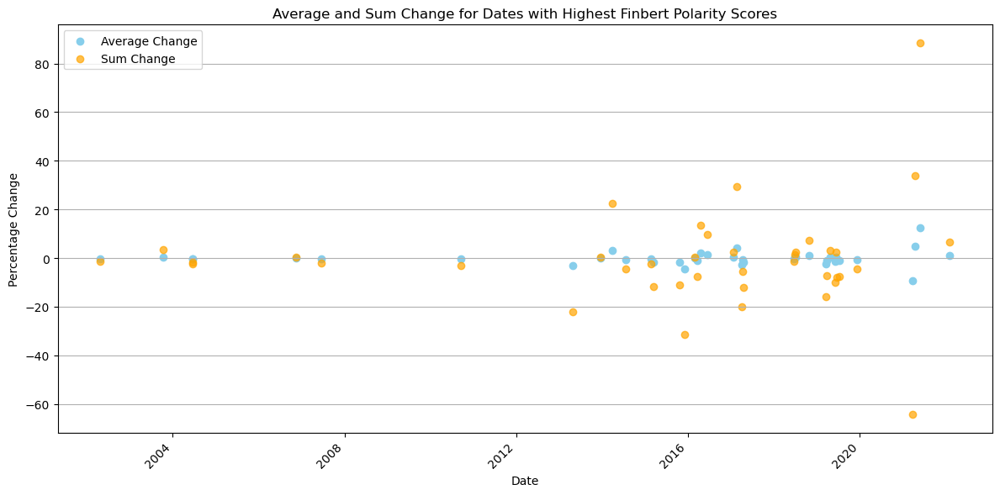

In [43]:
# Sort the DataFrame by 'finbert_polarity' in descending order and select the 40 dates with the highest scores
highest_scores = speech_day.sort_values(by='finbert_polarity', ascending=False).head(40)

# Plot the 'average_change' and 'sum_change' for the selected dates as bar plots
plt.figure(figsize=(12, 6))
plt.scatter(highest_scores['date'], highest_scores['average_change'], label='Average Change', color='skyblue')
plt.scatter(highest_scores['date'], highest_scores['sum_change'], label='Sum Change', color='orange', alpha=0.7)

# Set the labels, title, legend
plt.xlabel('Date')
plt.ylabel('Percentage Change')
plt.title('Average and Sum Change for Dates with Highest Finbert Polarity Scores')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.grid(True, axis='y')

# Show plot
plt.tight_layout()
plt.show()

Again, it seems the markets are moving either side of zero for both the negative and positive Governor speeches.

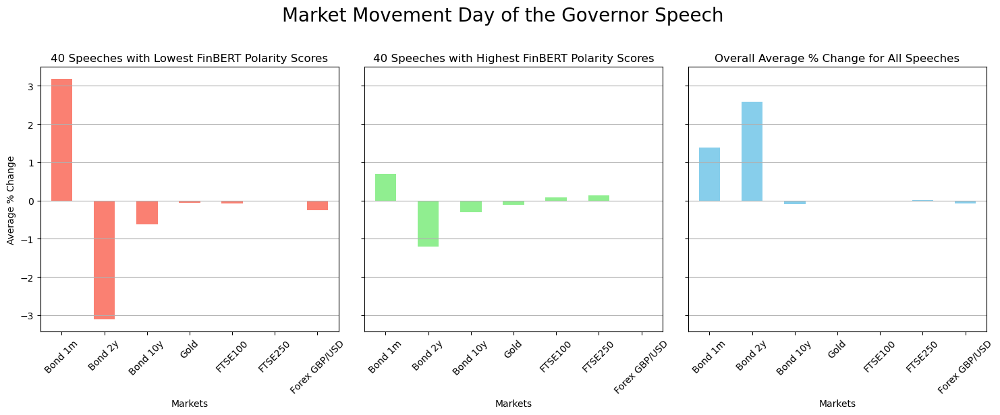

In [44]:
# Sort the DataFrame by 'finbert_polarity' in ascending order and select the lowest 40 scores
lowest_scores = speech_day.sort_values(by='finbert_polarity').head(40)

# Calculate the average values for the lowest scores
lowest_average_values = lowest_scores[['bond_1m %', 'bond_2y %', 'bond_10y %', 'gold %', 'ftse100 %', 'ftse250 %', 'forex %']].mean()

# Sort the DataFrame by 'finbert_polarity' in descending order and select the highest 40 scores
highest_scores = speech_day.sort_values(by='finbert_polarity', ascending=False).head(40)

# Calculate the average values for the highest scores
highest_average_values = highest_scores[['bond_1m %', 'bond_2y %', 'bond_10y %', 'gold %', 'ftse100 %', 'ftse250 %', 'forex %']].mean()

# Calculate the average values for all dates
overall_average_values = speech_day[['bond_1m %', 'bond_2y %', 'bond_10y %', 'gold %', 'ftse100 %', 'ftse250 %', 'forex %']].mean()

# Create subplots with shared y-axis
fig, axs = plt.subplots(1, 3, figsize=(15, 6), sharey=True)

# Add overall title
plt.suptitle('Market Movement Day of the Governor Speech', fontsize=20, y=1.02)


# Plot for lowest scores
plt.subplot(1, 3, 1)
lowest_average_values.plot(kind='bar', color='salmon')
plt.title('40 Speeches with Lowest FinBERT Polarity Scores')
plt.xlabel('Markets')
plt.ylabel('Average % Change')
plt.xticks(range(len(lowest_average_values)), ['Bond 1m', 'Bond 2y', 'Bond 10y', 'Gold', 'FTSE100', 'FTSE250', 'Forex GBP/USD'])
plt.xticks(rotation=45)
plt.grid(axis='y')

# Plot for highest scores
plt.subplot(1, 3, 2)
highest_average_values.plot(kind='bar', color='lightgreen')
plt.title('40 Speeches with Highest FinBERT Polarity Scores')
plt.xlabel('Markets')
plt.ylabel('Average % Change')
plt.xticks(range(len(highest_average_values)), ['Bond 1m', 'Bond 2y', 'Bond 10y', 'Gold', 'FTSE100', 'FTSE250', 'Forex GBP/USD'])
plt.xticks(rotation=45)
plt.grid(axis='y')

# Plot for overall scores
plt.subplot(1, 3, 3)
overall_average_values.plot(kind='bar', color='skyblue')
plt.title('Overall Average % Change for All Speeches')
plt.xlabel('Markets')
plt.ylabel('Average % Change')
plt.xticks(range(len(overall_average_values)), ['Bond 1m', 'Bond 2y', 'Bond 10y', 'Gold', 'FTSE100', 'FTSE250', 'Forex GBP/USD'])
plt.xticks(rotation=45)
plt.grid(axis='y')

# Show plot
plt.tight_layout()
plt.show()

A look at the markets and their average movements on the day of the speeches for the highest and lowest FinBERT scores as well as for all the speeches. 

Now to look at all the same plots but for the day before the Governor's speech.

In [45]:
# Create a copy of the 'daily_change' DataFrame
shifted_daily_change = daily_change.copy()

# Shift the 'date' column in the copied DataFrame by one day
shifted_daily_change['date'] = shifted_daily_change['date'] - pd.Timedelta(days=1)

# Merge 'gov' DataFrame with shifted_daily_change DataFrame based on 'date'
speech_day_before = pd.merge(gov[['date', 'finbert_polarity']], shifted_daily_change, on='date', how='inner')

# View the dataframe
speech_day_before

,date,finbert_polarity,gold %,bond_1m %,bond_10y %,bond_2y %,ftse100 %,ftse250 %,forex %
0,1999-05-17,0.078723,-0.362319,0.000000,0.352770,1.148742,0.658473,0.096471,0.191654
1,1999-09-09,-0.032255,-0.387597,4.725859,0.381957,0.033162,-1.111716,-0.415758,-0.996942
2,1999-10-11,-0.046509,-0.625000,0.000000,1.407707,0.830619,-0.960735,-0.302654,0.266183
3,2000-03-29,-0.081614,1.086957,-0.017170,-1.129305,0.093356,-2.327690,-1.454669,0.213487
4,2001-02-21,-0.218158,0.386100,-1.802590,0.443638,-0.076511,0.514035,-0.422944,0.173082
...,...,...,...,...,...,...,...,...,...
162,2021-09-27,-0.159087,-0.799087,17.142857,3.966597,4.603581,-0.499757,-2.031040,-1.175612
163,2022-02-10,0.685081,0.272183,7.823961,0.978474,5.103550,-0.148583,-0.716422,0.036887
164,2022-05-23,-0.026249,0.919913,4.707113,-4.160325,-7.393244,-0.385977,-1.471238,-0.468700
165,2022-07-12,-0.004046,0.637681,-4.532020,-0.096899,0.608744,-0.742035,-0.761600,0.033656


In [46]:
# Drop rows with duplicate 'finbert_polarity' scores
speech_day_before = speech_day_before.drop_duplicates(subset=['finbert_polarity'])

# View the dataframe
speech_day_before

,date,finbert_polarity,gold %,bond_1m %,bond_10y %,bond_2y %,ftse100 %,ftse250 %,forex %
0,1999-05-17,0.078723,-0.362319,0.000000,0.352770,1.148742,0.658473,0.096471,0.191654
1,1999-09-09,-0.032255,-0.387597,4.725859,0.381957,0.033162,-1.111716,-0.415758,-0.996942
2,1999-10-11,-0.046509,-0.625000,0.000000,1.407707,0.830619,-0.960735,-0.302654,0.266183
3,2000-03-29,-0.081614,1.086957,-0.017170,-1.129305,0.093356,-2.327690,-1.454669,0.213487
4,2001-02-21,-0.218158,0.386100,-1.802590,0.443638,-0.076511,0.514035,-0.422944,0.173082
...,...,...,...,...,...,...,...,...,...
162,2021-09-27,-0.159087,-0.799087,17.142857,3.966597,4.603581,-0.499757,-2.031040,-1.175612
163,2022-02-10,0.685081,0.272183,7.823961,0.978474,5.103550,-0.148583,-0.716422,0.036887
164,2022-05-23,-0.026249,0.919913,4.707113,-4.160325,-7.393244,-0.385977,-1.471238,-0.468700
165,2022-07-12,-0.004046,0.637681,-4.532020,-0.096899,0.608744,-0.742035,-0.761600,0.033656


In [47]:
# Calculate average and sum
average_change = speech_day_before[['gold %', 'bond_1m %', 'bond_10y %', 'bond_2y %', 'ftse100 %', 'ftse250 %', 'forex %']].mean(axis=1)
sum_change = speech_day_before[['gold %', 'bond_1m %', 'bond_10y %', 'bond_2y %', 'ftse100 %', 'ftse250 %', 'forex %']].sum(axis=1)
average_change_bonds = speech_day_before[['bond_1m %', 'bond_10y %', 'bond_2y %']].mean(axis=1)

# Add new columns to the DataFrame
speech_day_before['average_change'] = average_change
speech_day_before['sum_change'] = sum_change
speech_day_before['average_change_bonds'] = average_change_bonds

# View the dataframe
speech_day_before

,date,finbert_polarity,gold %,bond_1m %,bond_10y %,bond_2y %,ftse100 %,ftse250 %,forex %,average_change,sum_change,average_change_bonds
0,1999-05-17,0.078723,-0.362319,0.000000,0.352770,1.148742,0.658473,0.096471,0.191654,0.297970,2.085791,0.500504
1,1999-09-09,-0.032255,-0.387597,4.725859,0.381957,0.033162,-1.111716,-0.415758,-0.996942,0.318424,2.228965,1.713659
2,1999-10-11,-0.046509,-0.625000,0.000000,1.407707,0.830619,-0.960735,-0.302654,0.266183,0.088017,0.616119,0.746109
3,2000-03-29,-0.081614,1.086957,-0.017170,-1.129305,0.093356,-2.327690,-1.454669,0.213487,-0.505005,-3.535035,-0.351040
4,2001-02-21,-0.218158,0.386100,-1.802590,0.443638,-0.076511,0.514035,-0.422944,0.173082,-0.112170,-0.785190,-0.478488
...,...,...,...,...,...,...,...,...,...,...,...,...
162,2021-09-27,-0.159087,-0.799087,17.142857,3.966597,4.603581,-0.499757,-2.031040,-1.175612,3.029649,21.207540,8.571012
163,2022-02-10,0.685081,0.272183,7.823961,0.978474,5.103550,-0.148583,-0.716422,0.036887,1.907150,13.350049,4.635328
164,2022-05-23,-0.026249,0.919913,4.707113,-4.160325,-7.393244,-0.385977,-1.471238,-0.468700,-1.178922,-8.252457,-2.282152
165,2022-07-12,-0.004046,0.637681,-4.532020,-0.096899,0.608744,-0.742035,-0.761600,0.033656,-0.693210,-4.852473,-1.340058


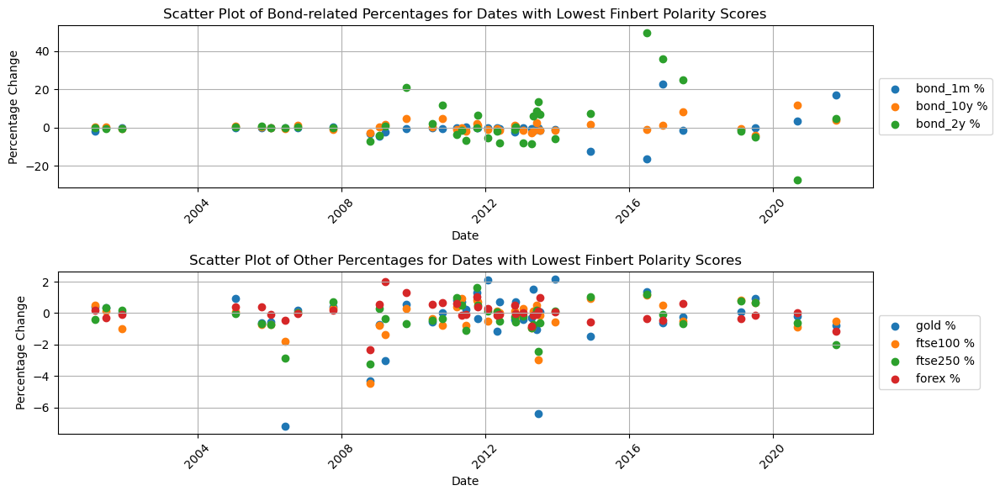

In [48]:
# Sort the DataFrame by 'finbert_polarity' in ascending order and select the lowest 40 scores
lowest_scores = speech_day_before.sort_values(by='finbert_polarity').head(40)

# Extract columns for each plot
bonds_columns = ['bond_1m %', 'bond_10y %', 'bond_2y %']
other_columns = ['gold %', 'ftse100 %', 'ftse250 %', 'forex %']

# Create two scatter plots
plt.figure(figsize=(12, 6))

# Scatter plot for bond-related percentages
plt.subplot(2, 1, 1)
for col in bonds_columns:
    plt.scatter(lowest_scores['date'], lowest_scores[col], label=col)
plt.xlabel('Date')
plt.ylabel('Percentage Change')
plt.title('Scatter Plot of Bond-related Percentages for Dates with Lowest Finbert Polarity Scores')
plt.xticks(rotation=45)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid(True)

# Scatter plot for other percentages
plt.subplot(2, 1, 2)
for col in other_columns:
    plt.scatter(lowest_scores['date'], lowest_scores[col], label=col)
plt.xlabel('Date')
plt.ylabel('Percentage Change')
plt.title('Scatter Plot of Other Percentages for Dates with Lowest Finbert Polarity Scores')
plt.xticks(rotation=45)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid(True)

# Show plot
plt.tight_layout()
plt.show()

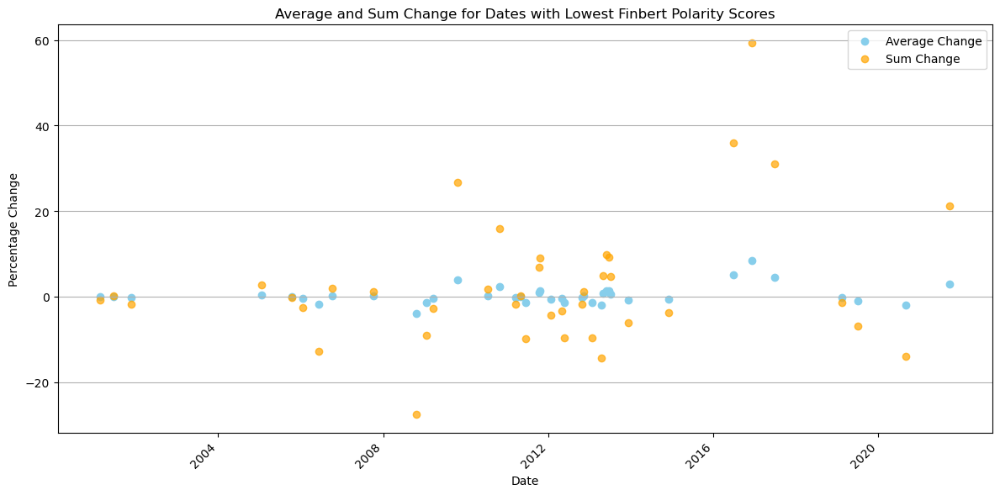

In [49]:
# Sort the DataFrame by 'finbert_polarity' in ascending order and select the 40 dates with the lowest scores
lowest_scores = speech_day_before.sort_values(by='finbert_polarity').head(40)

# Plot the 'average_change' and 'sum_change' for the selected dates as bar plots
plt.figure(figsize=(12, 6))
plt.scatter(lowest_scores['date'], lowest_scores['average_change'], label='Average Change', color='skyblue')
plt.scatter(lowest_scores['date'], lowest_scores['sum_change'], label='Sum Change', color='orange', alpha=0.7)

# Set the labels, title, legend
plt.xlabel('Date')
plt.ylabel('Percentage Change')
plt.title('Average and Sum Change for Dates with Lowest Finbert Polarity Scores')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.grid(True, axis='y')

# Show plot
plt.tight_layout()
plt.show()

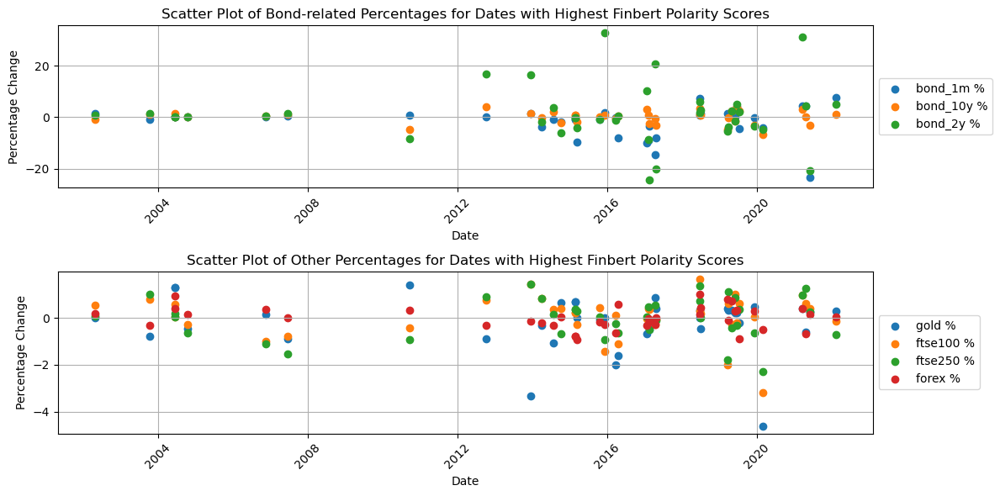

In [50]:
# Sort the DataFrame by 'finbert_polarity' in descending order and select the highest 40 scores
highest_scores = speech_day_before.sort_values(by='finbert_polarity', ascending=False).head(40)

# Extract columns for each plot
bonds_columns = ['bond_1m %', 'bond_10y %', 'bond_2y %']
other_columns = ['gold %', 'ftse100 %', 'ftse250 %', 'forex %']

# Create two scatter plots
plt.figure(figsize=(12, 6))

# Scatter plot for bond-related percentages
plt.subplot(2, 1, 1)
for col in bonds_columns:
    plt.scatter(highest_scores['date'], highest_scores[col], label=col)
plt.xlabel('Date')
plt.ylabel('Percentage Change')
plt.title('Scatter Plot of Bond-related Percentages for Dates with Highest Finbert Polarity Scores')
plt.xticks(rotation=45)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid(True)

# Scatter plot for other percentages
plt.subplot(2, 1, 2)
for col in other_columns:
    plt.scatter(highest_scores['date'], highest_scores[col], label=col)
plt.xlabel('Date')
plt.ylabel('Percentage Change')
plt.title('Scatter Plot of Other Percentages for Dates with Highest Finbert Polarity Scores')
plt.xticks(rotation=45)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid(True)

# Show plot
plt.tight_layout()
plt.show()

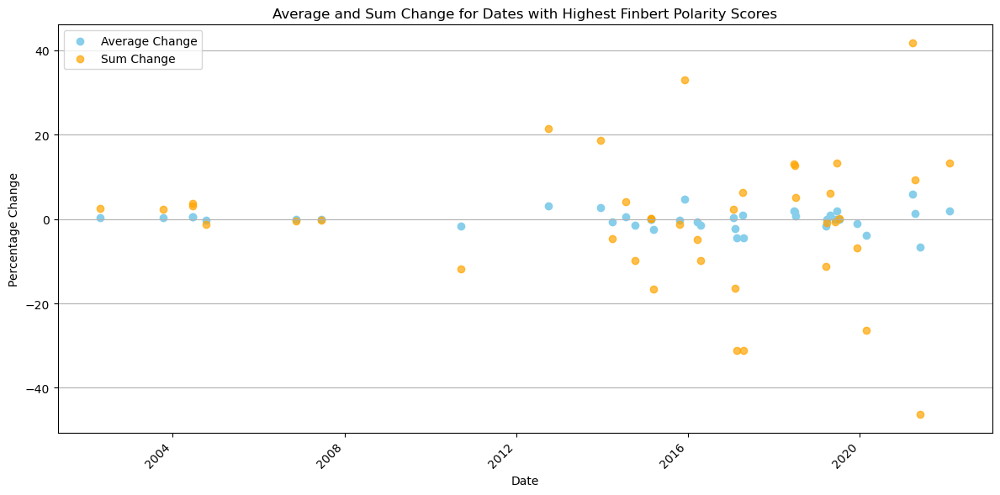

In [51]:
# Sort the DataFrame by 'finbert_polarity' in descending order and select the 40 dates with the highest scores
highest_scores = speech_day_before.sort_values(by='finbert_polarity', ascending=False).head(40)

# Plot the 'average_change' and 'sum_change' for the selected dates as bar plots
plt.figure(figsize=(12, 6))
plt.scatter(highest_scores['date'], highest_scores['average_change'], label='Average Change', color='skyblue')
plt.scatter(highest_scores['date'], highest_scores['sum_change'], label='Sum Change', color='orange', alpha=0.7)

# Set the labels, title, legend
plt.xlabel('Date')
plt.ylabel('Percentage Change')
plt.title('Average and Sum Change for Dates with Highest Finbert Polarity Scores')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.grid(True, axis='y')

# Show plot
plt.tight_layout()
plt.show()

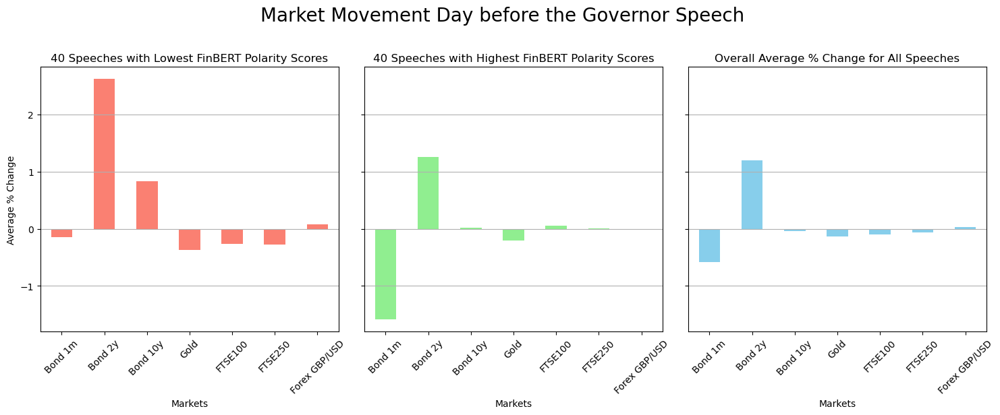

In [52]:
# Sort the DataFrame by 'finbert_polarity' in ascending order and select the lowest 40 scores
lowest_scores = speech_day_before.sort_values(by='finbert_polarity').head(40)

# Calculate the average values for the lowest scores
lowest_average_values = lowest_scores[['bond_1m %', 'bond_2y %', 'bond_10y %', 'gold %', 'ftse100 %', 'ftse250 %', 'forex %']].mean()

# Sort the DataFrame by 'finbert_polarity' in descending order and select the highest 40 scores
highest_scores = speech_day_before.sort_values(by='finbert_polarity', ascending=False).head(40)

# Calculate the average values for the highest scores
highest_average_values = highest_scores[['bond_1m %', 'bond_2y %', 'bond_10y %', 'gold %', 'ftse100 %', 'ftse250 %', 'forex %']].mean()

# Calculate the average values for all dates
overall_average_values = speech_day_before[['bond_1m %', 'bond_2y %', 'bond_10y %', 'gold %', 'ftse100 %', 'ftse250 %', 'forex %']].mean()

# Create subplots with shared y-axis
fig, axs = plt.subplots(1, 3, figsize=(15, 6), sharey=True)

# Add overall title
plt.suptitle('Market Movement Day before the Governor Speech', fontsize=20, y=1.02)


# Plot for lowest scores
plt.subplot(1, 3, 1)
lowest_average_values.plot(kind='bar', color='salmon')
plt.title('40 Speeches with Lowest FinBERT Polarity Scores')
plt.xlabel('Markets')
plt.ylabel('Average % Change')
plt.xticks(range(len(lowest_average_values)), ['Bond 1m', 'Bond 2y', 'Bond 10y', 'Gold', 'FTSE100', 'FTSE250', 'Forex GBP/USD'])
plt.xticks(rotation=45)
plt.grid(axis='y')

# Plot for highest scores
plt.subplot(1, 3, 2)
highest_average_values.plot(kind='bar', color='lightgreen')
plt.title('40 Speeches with Highest FinBERT Polarity Scores')
plt.xlabel('Markets')
plt.ylabel('Average % Change')
plt.xticks(range(len(highest_average_values)), ['Bond 1m', 'Bond 2y', 'Bond 10y', 'Gold', 'FTSE100', 'FTSE250', 'Forex GBP/USD'])
plt.xticks(rotation=45)
plt.grid(axis='y')

# Plot for overall scores
plt.subplot(1, 3, 3)
overall_average_values.plot(kind='bar', color='skyblue')
plt.title('Overall Average % Change for All Speeches')
plt.xlabel('Markets')
plt.ylabel('Average % Change')
plt.xticks(range(len(overall_average_values)), ['Bond 1m', 'Bond 2y', 'Bond 10y', 'Gold', 'FTSE100', 'FTSE250', 'Forex GBP/USD'])
plt.xticks(rotation=45)
plt.grid(axis='y')

# Show plot
plt.tight_layout()
plt.show()

This also has not shown anyting significant other than bonds tend to be more volatile than the other markets which was already a known fact.

Lastly, for the day after for the Governor speeches.

In [53]:
# Create a copy of the 'daily_change' DataFrame
shifted_daily_change2 = daily_change.copy()

# Shift the 'date' column in the copied DataFrame by one day
shifted_daily_change2['date'] = shifted_daily_change2['date'] + pd.Timedelta(days=1)

# Merge 'gov' DataFrame with shifted_daily_change DataFrame based on 'date'
speech_day_after = pd.merge(gov[['date', 'finbert_polarity']], shifted_daily_change2, on='date', how='inner')

# View the dataframe
speech_day_after

,date,finbert_polarity,gold %,bond_1m %,bond_10y %,bond_2y %,ftse100 %,ftse250 %,forex %
0,1999-08-27,-0.002053,0.000000,0.000000,0.196889,-1.464180,0.226076,0.011581,0.126183
1,1999-09-09,-0.032255,0.000000,0.000000,1.738166,0.918226,-0.885964,-0.481036,0.972751
2,2000-01-07,-0.002200,0.000000,0.345266,0.313643,0.167760,-1.357115,0.670965,0.292326
3,2000-03-29,-0.081614,-0.355872,0.000000,-0.782852,1.444497,-0.554793,0.670996,0.062976
4,2000-04-14,0.178370,-0.352113,0.000000,0.808625,0.414013,0.097629,-1.207327,-0.125913
...,...,...,...,...,...,...,...,...,...
150,2021-07-01,-0.066940,0.453515,2.941176,-2.972973,-7.812500,-0.706870,-0.737280,-0.057824
151,2022-02-10,0.685081,0.492341,8.208955,-3.957076,-3.153153,1.008310,1.819851,-0.066465
152,2022-07-12,-0.004046,-0.574053,0.772947,-2.417189,-2.083333,0.005557,-0.401840,-1.147418
153,2022-07-19,-0.032983,0.352113,3.336809,3.451582,3.131524,0.896776,0.963154,0.860614


In [54]:
# Drop rows with duplicate 'finbert_polarity' scores
speech_day_after = speech_day_after.drop_duplicates(subset=['finbert_polarity'])

# View the dataframe
speech_day_after

,date,finbert_polarity,gold %,bond_1m %,bond_10y %,bond_2y %,ftse100 %,ftse250 %,forex %
0,1999-08-27,-0.002053,0.000000,0.000000,0.196889,-1.464180,0.226076,0.011581,0.126183
1,1999-09-09,-0.032255,0.000000,0.000000,1.738166,0.918226,-0.885964,-0.481036,0.972751
2,2000-01-07,-0.002200,0.000000,0.345266,0.313643,0.167760,-1.357115,0.670965,0.292326
3,2000-03-29,-0.081614,-0.355872,0.000000,-0.782852,1.444497,-0.554793,0.670996,0.062976
4,2000-04-14,0.178370,-0.352113,0.000000,0.808625,0.414013,0.097629,-1.207327,-0.125913
...,...,...,...,...,...,...,...,...,...
150,2021-07-01,-0.066940,0.453515,2.941176,-2.972973,-7.812500,-0.706870,-0.737280,-0.057824
151,2022-02-10,0.685081,0.492341,8.208955,-3.957076,-3.153153,1.008310,1.819851,-0.066465
152,2022-07-12,-0.004046,-0.574053,0.772947,-2.417189,-2.083333,0.005557,-0.401840,-1.147418
153,2022-07-19,-0.032983,0.352113,3.336809,3.451582,3.131524,0.896776,0.963154,0.860614


In [55]:
# Calculate average and sum
average_change = speech_day_after[['gold %', 'bond_1m %', 'bond_10y %', 'bond_2y %', 'ftse100 %', 'ftse250 %', 'forex %']].mean(axis=1)
sum_change = speech_day_after[['gold %', 'bond_1m %', 'bond_10y %', 'bond_2y %', 'ftse100 %', 'ftse250 %', 'forex %']].sum(axis=1)
average_change_bonds = speech_day_after[['bond_1m %', 'bond_10y %', 'bond_2y %']].mean(axis=1)

# Add new columns to the DataFrame
speech_day_after['average_change'] = average_change
speech_day_after['sum_change'] = sum_change
speech_day_after['average_change_bonds'] = average_change_bonds

# View the dataframe
speech_day_after

,date,finbert_polarity,gold %,bond_1m %,bond_10y %,bond_2y %,ftse100 %,ftse250 %,forex %,average_change,sum_change,average_change_bonds
0,1999-08-27,-0.002053,0.000000,0.000000,0.196889,-1.464180,0.226076,0.011581,0.126183,-0.129064,-0.903451,-0.422430
1,1999-09-09,-0.032255,0.000000,0.000000,1.738166,0.918226,-0.885964,-0.481036,0.972751,0.323163,2.262142,0.885464
2,2000-01-07,-0.002200,0.000000,0.345266,0.313643,0.167760,-1.357115,0.670965,0.292326,0.061835,0.432845,0.275556
3,2000-03-29,-0.081614,-0.355872,0.000000,-0.782852,1.444497,-0.554793,0.670996,0.062976,0.069279,0.484952,0.220548
4,2000-04-14,0.178370,-0.352113,0.000000,0.808625,0.414013,0.097629,-1.207327,-0.125913,-0.052155,-0.365086,0.407546
...,...,...,...,...,...,...,...,...,...,...,...,...
150,2021-07-01,-0.066940,0.453515,2.941176,-2.972973,-7.812500,-0.706870,-0.737280,-0.057824,-1.270394,-8.892756,-2.614766
151,2022-02-10,0.685081,0.492341,8.208955,-3.957076,-3.153153,1.008310,1.819851,-0.066465,0.621823,4.352763,0.366242
152,2022-07-12,-0.004046,-0.574053,0.772947,-2.417189,-2.083333,0.005557,-0.401840,-1.147418,-0.835047,-5.845329,-1.242525
153,2022-07-19,-0.032983,0.352113,3.336809,3.451582,3.131524,0.896776,0.963154,0.860614,1.856082,12.992572,3.306638


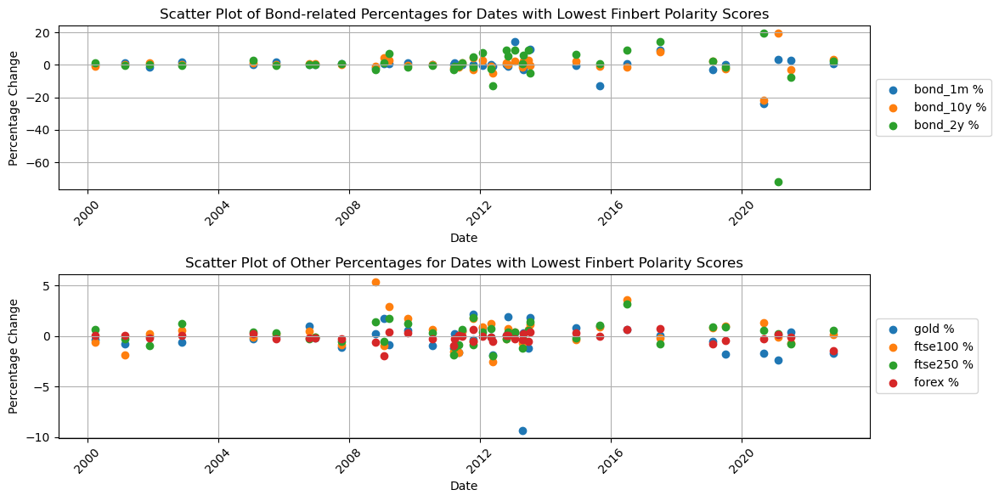

In [56]:
# Sort the DataFrame by 'finbert_polarity' in ascending order and select the lowest 40 scores
lowest_scores = speech_day_after.sort_values(by='finbert_polarity').head(40)

# Extract columns for each plot
bonds_columns = ['bond_1m %', 'bond_10y %', 'bond_2y %']
other_columns = ['gold %', 'ftse100 %', 'ftse250 %', 'forex %']

# Create two scatter plots
plt.figure(figsize=(12, 6))

# Scatter plot for bond-related percentages
plt.subplot(2, 1, 1)
for col in bonds_columns:
    plt.scatter(lowest_scores['date'], lowest_scores[col], label=col)
plt.xlabel('Date')
plt.ylabel('Percentage Change')
plt.title('Scatter Plot of Bond-related Percentages for Dates with Lowest Finbert Polarity Scores')
plt.xticks(rotation=45)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid(True)

# Scatter plot for other percentages
plt.subplot(2, 1, 2)
for col in other_columns:
    plt.scatter(lowest_scores['date'], lowest_scores[col], label=col)
plt.xlabel('Date')
plt.ylabel('Percentage Change')
plt.title('Scatter Plot of Other Percentages for Dates with Lowest Finbert Polarity Scores')
plt.xticks(rotation=45)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid(True)

# Show plot
plt.tight_layout()
plt.show()

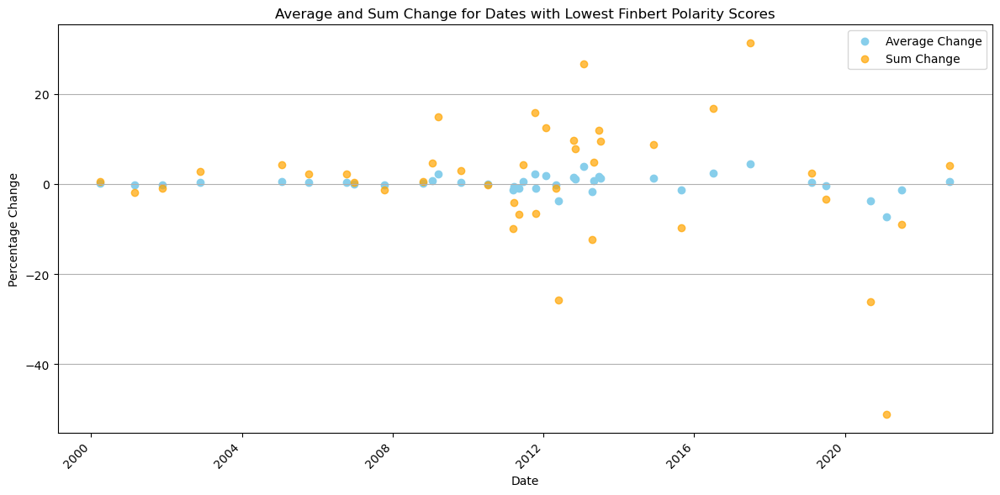

In [57]:
# Sort the DataFrame by 'finbert_polarity' in ascending order and select the 40 dates with the lowest scores
lowest_scores = speech_day_after.sort_values(by='finbert_polarity').head(40)

# Plot the 'average_change' and 'sum_change' for the selected dates as bar plots
plt.figure(figsize=(12, 6))
plt.scatter(lowest_scores['date'], lowest_scores['average_change'], label='Average Change', color='skyblue')
plt.scatter(lowest_scores['date'], lowest_scores['sum_change'], label='Sum Change', color='orange', alpha=0.7)

# Set the labels, title, legend
plt.xlabel('Date')
plt.ylabel('Percentage Change')
plt.title('Average and Sum Change for Dates with Lowest Finbert Polarity Scores')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.grid(True, axis='y')

# Show plot
plt.tight_layout()
plt.show()

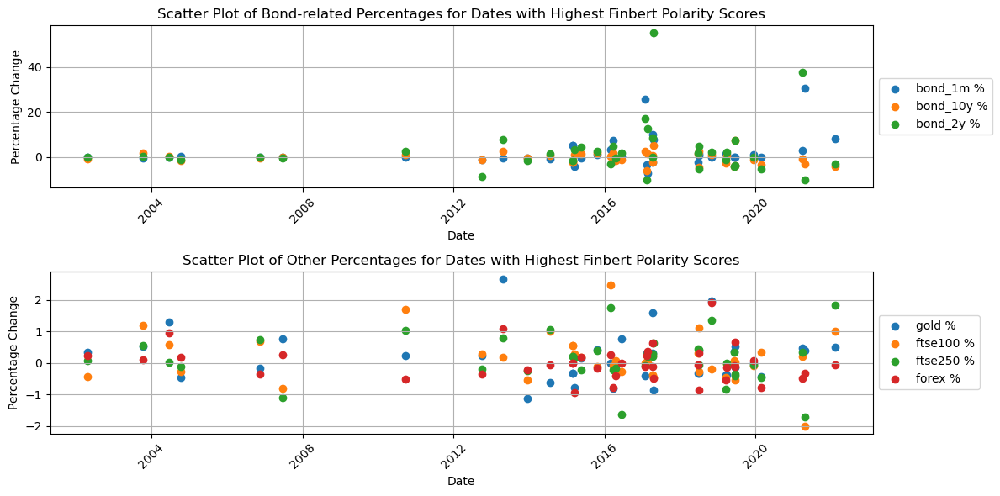

In [58]:
# Sort the DataFrame by 'finbert_polarity' in descending order and select the highest 40 scores
highest_scores = speech_day_after.sort_values(by='finbert_polarity', ascending=False).head(40)

# Extract columns for each plot
bonds_columns = ['bond_1m %', 'bond_10y %', 'bond_2y %']
other_columns = ['gold %', 'ftse100 %', 'ftse250 %', 'forex %']

# Create two scatter plots
plt.figure(figsize=(12, 6))

# Scatter plot for bond-related percentages
plt.subplot(2, 1, 1)
for col in bonds_columns:
    plt.scatter(highest_scores['date'], highest_scores[col], label=col)
plt.xlabel('Date')
plt.ylabel('Percentage Change')
plt.title('Scatter Plot of Bond-related Percentages for Dates with Highest Finbert Polarity Scores')
plt.xticks(rotation=45)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid(True)

# Scatter plot for other percentages
plt.subplot(2, 1, 2)
for col in other_columns:
    plt.scatter(highest_scores['date'], highest_scores[col], label=col)
plt.xlabel('Date')
plt.ylabel('Percentage Change')
plt.title('Scatter Plot of Other Percentages for Dates with Highest Finbert Polarity Scores')
plt.xticks(rotation=45)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid(True)

# Show plot
plt.tight_layout()
plt.show()

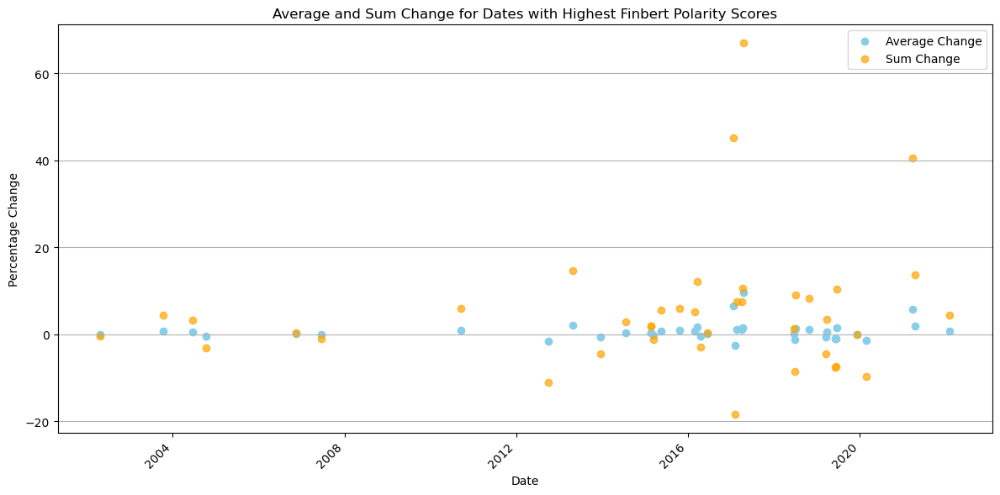

In [59]:
# Sort the DataFrame by 'finbert_polarity' in descending order and select the 40 dates with the highest scores
highest_scores = speech_day_after.sort_values(by='finbert_polarity', ascending=False).head(40)

# Plot the 'average_change' and 'sum_change' for the selected dates as bar plots
plt.figure(figsize=(12, 6))
plt.scatter(highest_scores['date'], highest_scores['average_change'], label='Average Change', color='skyblue')
plt.scatter(highest_scores['date'], highest_scores['sum_change'], label='Sum Change', color='orange', alpha=0.7)

# Set the labels, title, legend
plt.xlabel('Date')
plt.ylabel('Percentage Change')
plt.title('Average and Sum Change for Dates with Highest Finbert Polarity Scores')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.grid(True, axis='y')

# Show plot
plt.tight_layout()
plt.show()

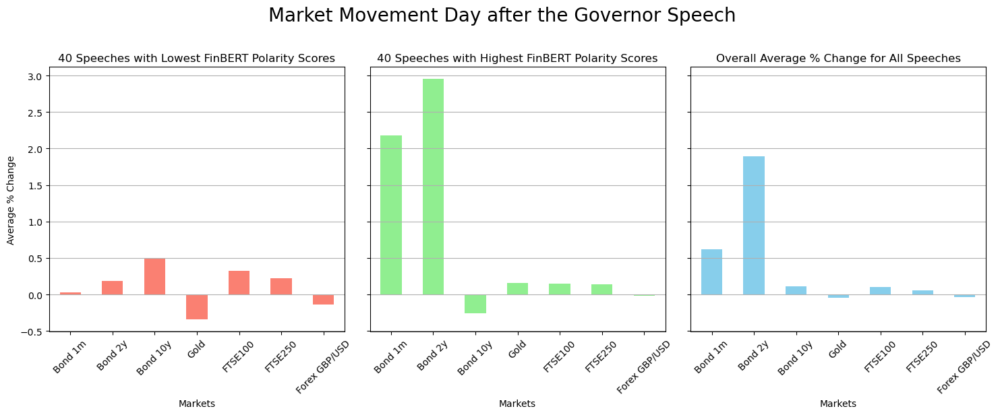

In [60]:
# Sort the DataFrame by 'finbert_polarity' in ascending order and select the lowest 40 scores
lowest_scores = speech_day_after.sort_values(by='finbert_polarity').head(40)

# Calculate the average values for the lowest scores
lowest_average_values = lowest_scores[['bond_1m %', 'bond_2y %', 'bond_10y %', 'gold %', 'ftse100 %', 'ftse250 %', 'forex %']].mean()

# Sort the DataFrame by 'finbert_polarity' in descending order and select the highest 40 scores
highest_scores = speech_day_after.sort_values(by='finbert_polarity', ascending=False).head(40)

# Calculate the average values for the highest scores
highest_average_values = highest_scores[['bond_1m %', 'bond_2y %', 'bond_10y %', 'gold %', 'ftse100 %', 'ftse250 %', 'forex %']].mean()

# Calculate the average values for all dates
overall_average_values = speech_day_after[['bond_1m %', 'bond_2y %', 'bond_10y %', 'gold %', 'ftse100 %', 'ftse250 %', 'forex %']].mean()

# Create subplots with shared y-axis
fig, axs = plt.subplots(1, 3, figsize=(15, 6), sharey=True)

# Add overall title
plt.suptitle('Market Movement Day after the Governor Speech', fontsize=20, y=1.02)


# Plot for lowest scores
plt.subplot(1, 3, 1)
lowest_average_values.plot(kind='bar', color='salmon')
plt.title('40 Speeches with Lowest FinBERT Polarity Scores')
plt.xlabel('Markets')
plt.ylabel('Average % Change')
plt.xticks(range(len(lowest_average_values)), ['Bond 1m', 'Bond 2y', 'Bond 10y', 'Gold', 'FTSE100', 'FTSE250', 'Forex GBP/USD'])
plt.xticks(rotation=45)
plt.grid(axis='y')

# Plot for highest scores
plt.subplot(1, 3, 2)
highest_average_values.plot(kind='bar', color='lightgreen')
plt.title('40 Speeches with Highest FinBERT Polarity Scores')
plt.xlabel('Markets')
plt.ylabel('Average % Change')
plt.xticks(range(len(highest_average_values)), ['Bond 1m', 'Bond 2y', 'Bond 10y', 'Gold', 'FTSE100', 'FTSE250', 'Forex GBP/USD'])
plt.xticks(rotation=45)
plt.grid(axis='y')

# Plot for overall scores
plt.subplot(1, 3, 3)
overall_average_values.plot(kind='bar', color='skyblue')
plt.title('Overall Average % Change for All Speeches')
plt.xlabel('Markets')
plt.ylabel('Average % Change')
plt.xticks(range(len(overall_average_values)), ['Bond 1m', 'Bond 2y', 'Bond 10y', 'Gold', 'FTSE100', 'FTSE250', 'Forex GBP/USD'])
plt.xticks(rotation=45)
plt.grid(axis='y')

# Show plot
plt.tight_layout()
plt.show()

After looking at the Governor's speeches and finding nothing of great interest plotting the movements over time and then collating the average changes for each market. I then wanted to see if this changed for all the speeches. In mind was also the fact that bonds can swing a great deal and averages may not be the best way to view them.

So, Looking at all the speeches made now, governors included.

In [61]:
# Convert 'date' column to datetime type
speeches['date'] = pd.to_datetime(speeches['date'])
daily_change['date'] = pd.to_datetime(daily_change['date'])

# Merge 'speeches' DataFrame with 'daily_change' DataFrame based on date
speech_day_all = pd.merge(speeches, daily_change, on='date', how='inner')

# View the dataframe
speech_day_all

,date,author,is_gov,vader_polarity,lm_polarity,finbert_polarity,gold %,bond_1m %,bond_10y %,bond_2y %,ftse100 %,ftse250 %,forex %
0,1999-01-12,George,False,0.9964,-0.528455,-0.748517,-1.694915,-0.016584,1.372732,-0.313152,-0.844698,-0.098352,0.141130
1,1999-01-18,George,False,0.9993,-0.229508,-0.436865,0.000000,0.000000,0.233372,0.147462,3.078605,0.961473,0.133309
2,1999-02-01,George,False,0.9997,0.050505,0.184429,1.041667,0.000000,0.383969,-0.909467,1.974218,1.942590,-0.255195
3,1999-02-10,George,False,0.9995,-0.156627,-0.345548,0.000000,0.000000,0.184459,0.270946,-0.167818,-0.384353,-0.677738
4,1999-02-18,George,False,0.9996,-0.362500,-0.096967,0.349650,0.000000,-0.044316,0.369610,-0.057581,-0.398108,0.061181
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1394,2022-10-06,Haskel,False,-0.4517,-0.489209,-0.059072,0.000000,-10.091302,3.320119,2.830661,-0.784112,0.399713,-1.483313
1395,2022-10-07,Ramsden,False,0.9947,-0.525180,-0.143693,-0.697269,13.148049,1.630695,-0.998782,-0.088601,-1.583991,-0.663201
1396,2022-10-12,Pill,False,0.9997,-0.166667,-0.011488,-0.474496,0.716204,-0.831461,-4.089931,-0.856910,-1.732718,1.277023
1397,2022-10-19,Wilkins,False,0.9999,0.287234,0.000144,-1.328502,-1.588665,-1.826021,-2.311813,-0.168671,-1.607030,-0.918890


In [62]:
# Drop unnecessary columns
speech_day_all = speech_day_all.drop(columns=['author', 'is_gov'])

# Drop duplicates based on 'date' and 'finbert_polarity' columns
speech_day_all = speech_day_all.drop_duplicates(subset=['date', 'finbert_polarity'])

# View the dataframe
speech_day_all

,date,vader_polarity,lm_polarity,finbert_polarity,gold %,bond_1m %,bond_10y %,bond_2y %,ftse100 %,ftse250 %,forex %
0,1999-01-12,0.9964,-0.528455,-0.748517,-1.694915,-0.016584,1.372732,-0.313152,-0.844698,-0.098352,0.141130
1,1999-01-18,0.9993,-0.229508,-0.436865,0.000000,0.000000,0.233372,0.147462,3.078605,0.961473,0.133309
2,1999-02-01,0.9997,0.050505,0.184429,1.041667,0.000000,0.383969,-0.909467,1.974218,1.942590,-0.255195
3,1999-02-10,0.9995,-0.156627,-0.345548,0.000000,0.000000,0.184459,0.270946,-0.167818,-0.384353,-0.677738
4,1999-02-18,0.9996,-0.362500,-0.096967,0.349650,0.000000,-0.044316,0.369610,-0.057581,-0.398108,0.061181
...,...,...,...,...,...,...,...,...,...,...,...
1394,2022-10-06,-0.4517,-0.489209,-0.059072,0.000000,-10.091302,3.320119,2.830661,-0.784112,0.399713,-1.483313
1395,2022-10-07,0.9947,-0.525180,-0.143693,-0.697269,13.148049,1.630695,-0.998782,-0.088601,-1.583991,-0.663201
1396,2022-10-12,0.9997,-0.166667,-0.011488,-0.474496,0.716204,-0.831461,-4.089931,-0.856910,-1.732718,1.277023
1397,2022-10-19,0.9999,0.287234,0.000144,-1.328502,-1.588665,-1.826021,-2.311813,-0.168671,-1.607030,-0.918890


With nearly 1200 speeches I'll start with 300, around the 25% mark.

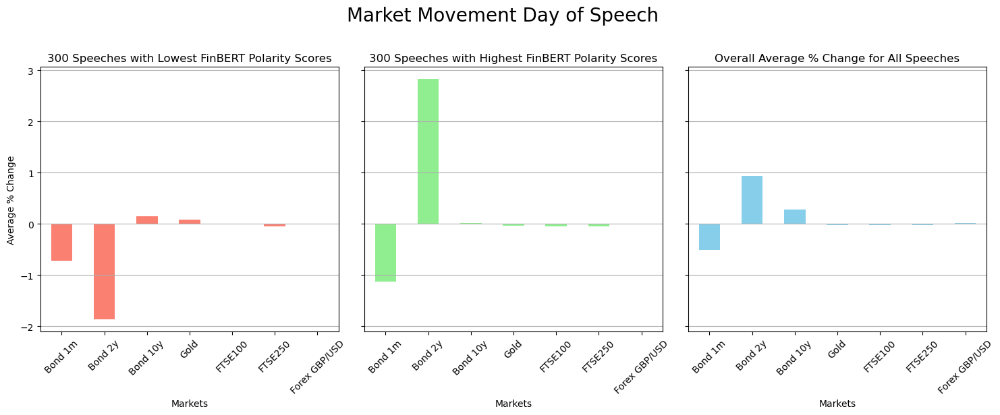

In [63]:
# Sort the DataFrame by 'finbert_polarity' in ascending order and select the lowest 300 scores
lowest_scores = speech_day_all.sort_values(by='finbert_polarity').head(300)

# Calculate the average values for the lowest scores
lowest_average_values = lowest_scores[['bond_1m %', 'bond_2y %', 'bond_10y %', 'gold %', 'ftse100 %', 'ftse250 %', 'forex %']].mean()

# Sort the DataFrame by 'finbert_polarity' in descending order and select the highest 300 scores
highest_scores = speech_day_all.sort_values(by='finbert_polarity', ascending=False).head(300)

# Calculate the average values for the highest scores
highest_average_values = highest_scores[['bond_1m %', 'bond_2y %', 'bond_10y %', 'gold %', 'ftse100 %', 'ftse250 %', 'forex %']].mean()

# Calculate the average values for all dates
overall_average_values = speech_day_all[['bond_1m %', 'bond_2y %', 'bond_10y %', 'gold %', 'ftse100 %', 'ftse250 %', 'forex %']].mean()

# Plot the average values for the lowest scores
fig, axs = plt.subplots(1, 3, figsize=(15, 6), sharey=True)

# Add overall title
plt.suptitle('Market Movement Day of Speech', fontsize=20, y=1.02)


# Plot for lowest scores
plt.subplot(1, 3, 1)
lowest_average_values.plot(kind='bar', color='salmon')
plt.title('300 Speeches with Lowest FinBERT Polarity Scores')
plt.xlabel('Markets')
plt.ylabel('Average % Change')
plt.xticks(range(len(lowest_average_values)), ['Bond 1m', 'Bond 2y', 'Bond 10y', 'Gold', 'FTSE100', 'FTSE250', 'Forex GBP/USD'])
plt.xticks(rotation=45)
plt.grid(axis='y')

# Plot for highest scores
plt.subplot(1, 3, 2)
highest_average_values.plot(kind='bar', color='lightgreen')
plt.title('300 Speeches with Highest FinBERT Polarity Scores')
plt.xlabel('Markets')
plt.ylabel('Average % Change')
plt.xticks(range(len(highest_average_values)), ['Bond 1m', 'Bond 2y', 'Bond 10y', 'Gold', 'FTSE100', 'FTSE250', 'Forex GBP/USD'])
plt.xticks(rotation=45)
plt.grid(axis='y')

# Plot for overall scores
plt.subplot(1, 3, 3)
overall_average_values.plot(kind='bar', color='skyblue')
plt.title('Overall Average % Change for All Speeches')
plt.xlabel('Markets')
plt.ylabel('Average % Change')
plt.xticks(range(len(overall_average_values)), ['Bond 1m', 'Bond 2y', 'Bond 10y', 'Gold', 'FTSE100', 'FTSE250', 'Forex GBP/USD'])
plt.xticks(rotation=45)
plt.grid(axis='y')

# Show plot
plt.tight_layout()
plt.show()

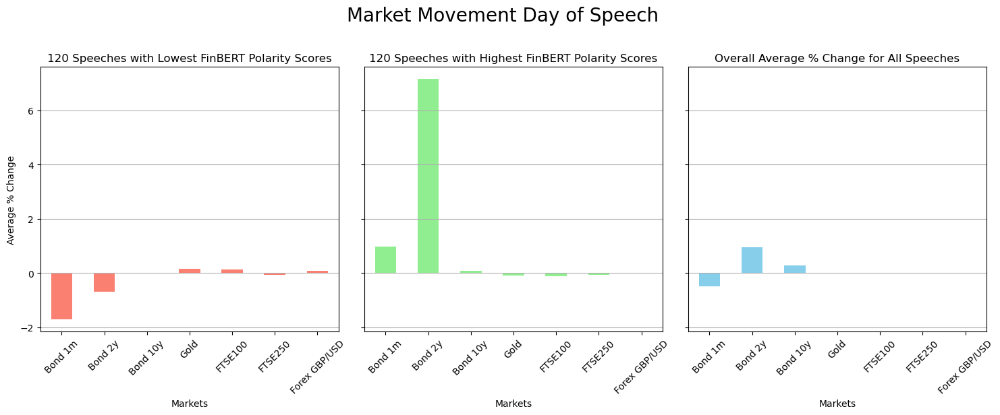

In [64]:
# Sort the DataFrame by 'finbert_polarity' in ascending order and select the lowest 120 scores
lowest_scores = speech_day_all.sort_values(by='finbert_polarity').head(120)

# Calculate the average values for the lowest scores
lowest_average_values = lowest_scores[['bond_1m %', 'bond_2y %', 'bond_10y %', 'gold %', 'ftse100 %', 'ftse250 %', 'forex %']].mean()

# Sort the DataFrame by 'finbert_polarity' in descending order and select the highest 120 scores
highest_scores = speech_day_all.sort_values(by='finbert_polarity', ascending=False).head(120)

# Calculate the average values for the highest scores
highest_average_values = highest_scores[['bond_1m %', 'bond_2y %', 'bond_10y %', 'gold %', 'ftse100 %', 'ftse250 %', 'forex %']].mean()

# Calculate the average values for all dates
overall_average_values = speech_day_all[['bond_1m %', 'bond_2y %', 'bond_10y %', 'gold %', 'ftse100 %', 'ftse250 %', 'forex %']].mean()

# Plot the average values for the lowest scores
fig, axs = plt.subplots(1, 3, figsize=(15, 6), sharey=True)

# Add overall title
plt.suptitle('Market Movement Day of Speech', fontsize=20, y=1.02)


# Plot for lowest scores
plt.subplot(1, 3, 1)
lowest_average_values.plot(kind='bar', color='salmon')
plt.title('120 Speeches with Lowest FinBERT Polarity Scores')
plt.xlabel('Markets')
plt.ylabel('Average % Change')
plt.xticks(range(len(lowest_average_values)), ['Bond 1m', 'Bond 2y', 'Bond 10y', 'Gold', 'FTSE100', 'FTSE250', 'Forex GBP/USD'])
plt.xticks(rotation=45)
plt.grid(axis='y')

# Plot for highest scores
plt.subplot(1, 3, 2)
highest_average_values.plot(kind='bar', color='lightgreen')
plt.title('120 Speeches with Highest FinBERT Polarity Scores')
plt.xlabel('Markets')
plt.ylabel('Average % Change')
plt.xticks(range(len(highest_average_values)), ['Bond 1m', 'Bond 2y', 'Bond 10y', 'Gold', 'FTSE100', 'FTSE250', 'Forex GBP/USD'])
plt.xticks(rotation=45)
plt.grid(axis='y')

# Plot for overall scores
plt.subplot(1, 3, 3)
overall_average_values.plot(kind='bar', color='skyblue')
plt.title('Overall Average % Change for All Speeches')
plt.xlabel('Markets')
plt.ylabel('Average % Change')
plt.xticks(range(len(overall_average_values)), ['Bond 1m', 'Bond 2y', 'Bond 10y', 'Gold', 'FTSE100', 'FTSE250', 'Forex GBP/USD'])
plt.xticks(rotation=45)
plt.grid(axis='y')

# Show plot
plt.tight_layout()
plt.show()

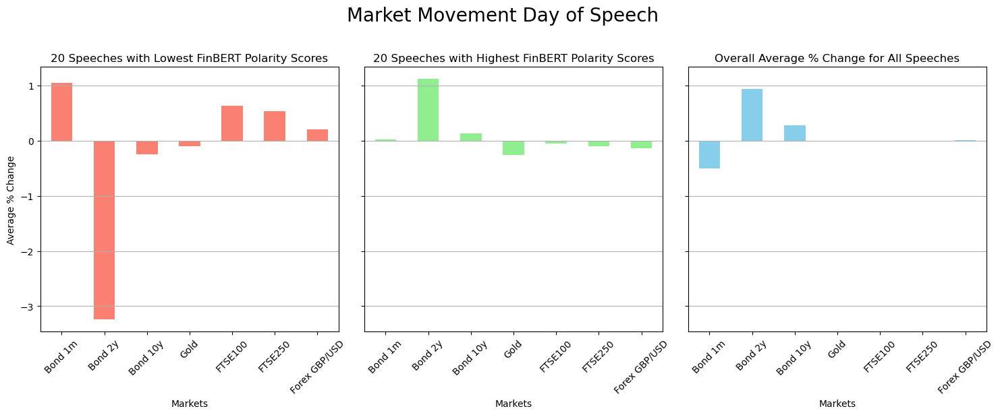

In [65]:
# Sort the DataFrame by 'finbert_polarity' in ascending order and select the lowest 20 scores
lowest_scores = speech_day_all.sort_values(by='finbert_polarity').head(20)

# Calculate the average values for the lowest scores
lowest_average_values = lowest_scores[['bond_1m %', 'bond_2y %', 'bond_10y %', 'gold %', 'ftse100 %', 'ftse250 %', 'forex %']].mean()

# Sort the DataFrame by 'finbert_polarity' in descending order and select the highest 20 scores
highest_scores = speech_day_all.sort_values(by='finbert_polarity', ascending=False).head(20)

# Calculate the average values for the highest scores
highest_average_values = highest_scores[['bond_1m %', 'bond_2y %', 'bond_10y %', 'gold %', 'ftse100 %', 'ftse250 %', 'forex %']].mean()

# Calculate the average values for all dates
overall_average_values = speech_day_all[['bond_1m %', 'bond_2y %', 'bond_10y %', 'gold %', 'ftse100 %', 'ftse250 %', 'forex %']].mean()

# Plot the average values for the lowest scores
fig, axs = plt.subplots(1, 3, figsize=(15, 6), sharey=True)

# Add overall title
plt.suptitle('Market Movement Day of Speech', fontsize=20, y=1.02)


# Plot for lowest scores
plt.subplot(1, 3, 1)
lowest_average_values.plot(kind='bar', color='salmon')
plt.title('20 Speeches with Lowest FinBERT Polarity Scores')
plt.xlabel('Markets')
plt.ylabel('Average % Change')
plt.xticks(range(len(lowest_average_values)), ['Bond 1m', 'Bond 2y', 'Bond 10y', 'Gold', 'FTSE100', 'FTSE250', 'Forex GBP/USD'])
plt.xticks(rotation=45)
plt.grid(axis='y')

# Plot for highest scores
plt.subplot(1, 3, 2)
highest_average_values.plot(kind='bar', color='lightgreen')
plt.title('20 Speeches with Highest FinBERT Polarity Scores')
plt.xlabel('Markets')
plt.ylabel('Average % Change')
plt.xticks(range(len(highest_average_values)), ['Bond 1m', 'Bond 2y', 'Bond 10y', 'Gold', 'FTSE100', 'FTSE250', 'Forex GBP/USD'])
plt.xticks(rotation=45)
plt.grid(axis='y')

# Plot for overall scores
plt.subplot(1, 3, 3)
overall_average_values.plot(kind='bar', color='skyblue')
plt.title('Overall Average % Change for All Speeches')
plt.xlabel('Markets')
plt.ylabel('Average % Change')
plt.xticks(range(len(overall_average_values)), ['Bond 1m', 'Bond 2y', 'Bond 10y', 'Gold', 'FTSE100', 'FTSE250', 'Forex GBP/USD'])
plt.xticks(rotation=45)
plt.grid(axis='y')

# Show plot
plt.tight_layout()
plt.show()

This confirmed the bond movement trend of larger swings than the other markets but also the limitations of this analysis using averages as one large swing which often happens with bonds could skew the data.

This prompted a need to look at the movement around speeches on a more granular level and I started with the lowest 10 Governor speeches.

In [66]:
# Filter the DataFrame for dates between 1999-01-01 and 2022-10-20 and is_gov is True
speeches_neg_gov = speeches[(speeches['date'] >= '1999-01-01') & (speeches['date'] <= '2022-10-20') & (speeches['is_gov'] == True)]

# Sort the filtered DataFrame by finbert_polarity in ascending order (lowest first)
speeches_neg_gov = speeches_neg_gov.sort_values('finbert_polarity')

# Get the first 10 rows of the sorted DataFrame
speeches_neg_gov = speeches_neg_gov.head(10)

# View the DataFrame
speeches_neg_gov

,date,author,is_gov,vader_polarity,lm_polarity,finbert_polarity
311,2008-10-21,King,True,-0.9673,-0.671642,-0.529721
483,2012-01-24,King,True,0.9779,-0.456000,-0.508978
509,2012-05-24,Bailey,True,-0.8651,-0.417722,-0.484257
798,2016-06-30,Carney,True,-0.9900,-0.263736,-0.451044
87,2001-06-18,King,True,0.9990,-0.382353,-0.444607
467,2011-10-18,King,True,0.9565,-0.568862,-0.416741
958,2019-02-12,Carney,True,0.9993,-0.330508,-0.392556
1003,2019-07-02,Carney,True,-0.9906,-0.288889,-0.376115
600,2013-12-09,Carney,True,0.9995,-0.353846,-0.373566
866,2017-06-28,Carney,True,0.9974,-0.257143,-0.341819


In [67]:
# First, filter the DataFrame to only include rows where the date is between 1999-01-01 and 2022-10-20
speeches_neg = speeches[(speeches['date'] >= '1999-01-01') & (speeches['date'] <= '2022-10-20')]

# Sort the filtered DataFrame by finbert_polarity in ascending order (lowest first)
speeches_neg = speeches_neg.sort_values('finbert_polarity')

# Get the first 20 rows of the sorted DataFrame
speeches_neg = speeches_neg.head(20)

# View the DataFrame
speeches_neg

,date,author,is_gov,vader_polarity,lm_polarity,finbert_polarity
169,2004-04-28,Barker,False,-0.8685,-0.370370,-0.805046
476,2011-11-22,Tucker,False,-0.9184,-0.477273,-0.788505
1,1999-01-12,George,False,0.9964,-0.528455,-0.748517
1022,2019-09-27,Saunders,False,-0.9998,-0.478261,-0.723652
322,2009-01-29,Blanchflower,False,-0.9997,-0.605263,-0.723417
310,2008-10-13,Sentance,False,-0.9970,-0.681592,-0.686063
1053,2020-05-28,Saunders,False,-0.9995,-0.639485,-0.675643
324,2009-02-16,Bean,False,0.9985,-0.519481,-0.662866
274,2007-10-23,Barker,False,0.8666,-0.577778,-0.635805
155,2003-11-20,Barker,False,0.9995,-0.422925,-0.633764


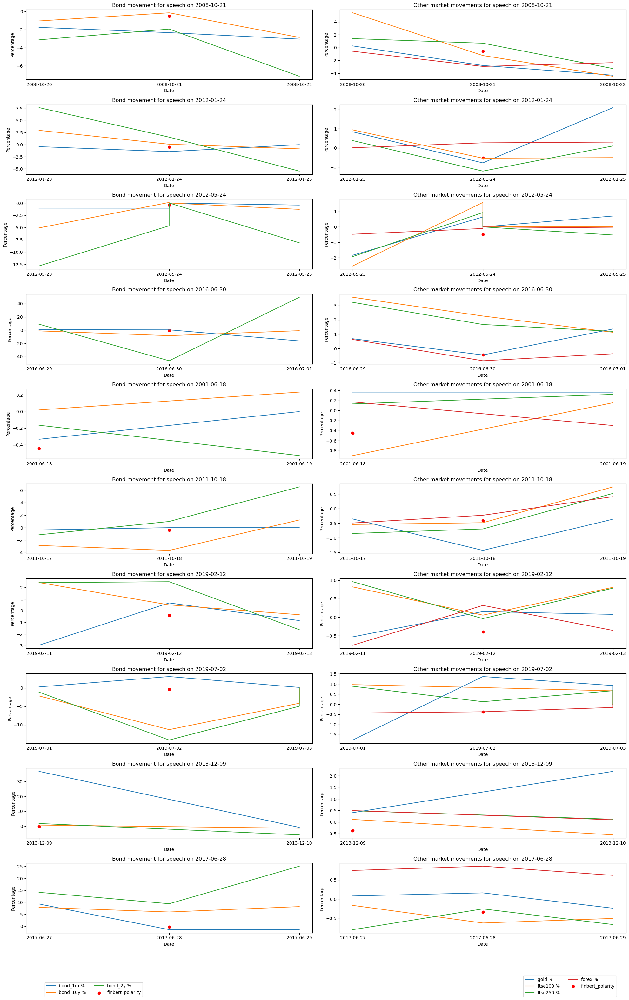

In [68]:
# Set the plot and figure size
fig, axs = plt.subplots(nrows=len(speeches_neg_gov), ncols=2, figsize=(20, 30))

# Loop through the speeches_neg dataframe and plot the bond yields and other financial instruments for each date
for i, date in enumerate(speeches_neg_gov['date']):
    x = daily_change.loc[(daily_change['date'].isin([date])) | (daily_change['date'].between(date - pd.DateOffset(days=1), 
                                                                date + pd.DateOffset(days=1))), 'date']
    y_bond = daily_change.loc[(daily_change['date'].isin([date])) | (daily_change['date'].between(date - pd.DateOffset(days=1), 
                date + pd.DateOffset(days=1))), ['bond_1m %', 'bond_10y %', 'bond_2y %']]

    y_other = daily_change.loc[(daily_change['date'].isin([date])) | (daily_change['date'].between(date - pd.DateOffset(days=1), 
                                                                date + pd.DateOffset(days=1))), ['gold %', 'ftse100 %', 'ftse250 %', 'forex %']]

    row = i

    # Plot bond yields
    axs[row, 0].plot(x, y_bond['bond_1m %'], label='bond_1m %')
    axs[row, 0].plot(x, y_bond['bond_10y %'], label='bond_10y %')
    axs[row, 0].plot(x, y_bond['bond_2y %'], label='bond_2y %')
    axs[row, 0].scatter(speeches_neg_gov.loc[speeches_neg_gov['date'] == date, 'date'], speeches_neg_gov.loc[speeches_neg_gov['date'] 
                                                               == date, 'finbert_polarity'], color='red', label='finbert_polarity')
    axs[row, 0].set_xlabel('Date')
    axs[row, 0].set_ylabel('Percentage')
    axs[row, 0].set_title(f'Bond movement for speech on {date.date()}')  # Extracting date only
    axs[row, 0].xaxis.set_major_locator(mdates.DayLocator(interval=1))
    axs[row, 0].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

    # Plot other financial instruments
    axs[row, 1].plot(x, y_other['gold %'], label='gold %')
    axs[row, 1].plot(x, y_other['ftse100 %'], label='ftse100 %')
    axs[row, 1].plot(x, y_other['ftse250 %'], label='ftse250 %')
    axs[row, 1].plot(x, y_other['forex %'], label='forex %')
    axs[row, 1].scatter(speeches_neg_gov.loc[speeches_neg_gov['date'] == date, 'date'], speeches_neg_gov.loc[speeches_neg_gov['date'] 
                                                                == date, 'finbert_polarity'], color='red', label='finbert_polarity')
    axs[row, 1].set_xlabel('Date')
    axs[row, 1].set_ylabel('Percentage')
    axs[row, 1].set_title(f'Other market movements for speech on {date.date()}')  # Extracting date only
    axs[row, 1].xaxis.set_major_locator(mdates.DayLocator(interval=1))
    axs[row, 1].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

    # Disable legend for each subplot
    axs[row, 0].legend().set_visible(False)
    axs[row, 1].legend().set_visible(False)

# Extract handles and labels from one subplot only for each set
handles_bond, labels_bond = axs[0, 0].get_legend_handles_labels()
handles_other, labels_other = axs[0, 1].get_legend_handles_labels()

# Add a single legend at the bottom of all the plots for each set
fig.legend(handles_bond, labels_bond, loc='lower center', bbox_to_anchor=(0.15, -0.05), ncol=2)
fig.legend(handles_other, labels_other, loc='lower center', bbox_to_anchor=(0.9, -0.05), ncol=2)

# Show plot
plt.tight_layout()
plt.show()

Lots of movement in either direction, but it would also be good to see how that is with the lowest 20 speeches by anyone.

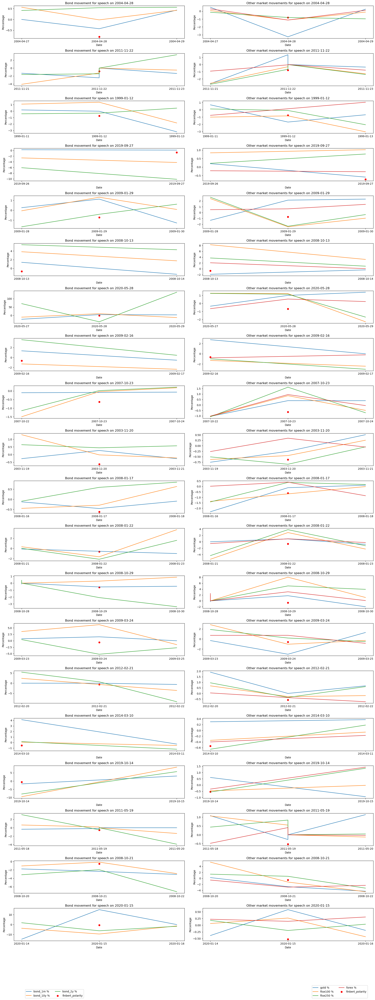

In [69]:
# Set the plot and figure size
fig, axs = plt.subplots(nrows=len(speeches_neg), ncols=2, figsize=(20,50))

# Loop through the speeches_neg dataframe and plot the bond yields and other financial instruments for each date
for i, date in enumerate(speeches_neg['date']):
    x = daily_change.loc[(daily_change['date'].isin([date])) | (daily_change['date'].between(date - pd.DateOffset(days=1), 
                                                                date + pd.DateOffset(days=1))), 'date']
    y_bond = daily_change.loc[(daily_change['date'].isin([date])) | (daily_change['date'].between(date - pd.DateOffset(days=1), 
                date + pd.DateOffset(days=1))), ['bond_1m %', 'bond_10y %', 'bond_2y %']]

    y_other = daily_change.loc[(daily_change['date'].isin([date])) | (daily_change['date'].between(date - pd.DateOffset(days=1), 
                                                                date + pd.DateOffset(days=1))), ['gold %', 'ftse100 %', 'ftse250 %', 'forex %']]

    row = i

    # Plot bond yields
    axs[row, 0].plot(x, y_bond['bond_1m %'], label='bond_1m %')
    axs[row, 0].plot(x, y_bond['bond_10y %'], label='bond_10y %')
    axs[row, 0].plot(x, y_bond['bond_2y %'], label='bond_2y %')
    axs[row, 0].scatter(speeches_neg.loc[speeches_neg['date'] == date, 'date'], speeches_neg.loc[speeches_neg['date'] 
                                                               == date, 'finbert_polarity'], color='red', label='finbert_polarity')
    axs[row, 0].set_xlabel('Date')
    axs[row, 0].set_ylabel('Percentage')
    axs[row, 0].set_title(f'Bond movement for speech on {date.date()}')  # Extracting date only
    axs[row, 0].xaxis.set_major_locator(mdates.DayLocator(interval=1))
    axs[row, 0].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

    # Plot other financial instruments
    axs[row, 1].plot(x, y_other['gold %'], label='gold %')
    axs[row, 1].plot(x, y_other['ftse100 %'], label='ftse100 %')
    axs[row, 1].plot(x, y_other['ftse250 %'], label='ftse250 %')
    axs[row, 1].plot(x, y_other['forex %'], label='forex %')
    axs[row, 1].scatter(speeches_neg.loc[speeches_neg['date'] == date, 'date'], speeches_neg.loc[speeches_neg['date'] 
                                                                == date, 'finbert_polarity'], color='red', label='finbert_polarity')
    axs[row, 1].set_xlabel('Date')
    axs[row, 1].set_ylabel('Percentage')
    axs[row, 1].set_title(f'Other market movements for speech on {date.date()}')  # Extracting date only
    axs[row, 1].xaxis.set_major_locator(mdates.DayLocator(interval=1))
    axs[row, 1].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

    # Disable legend for each subplot
    axs[row, 0].legend().set_visible(False)
    axs[row, 1].legend().set_visible(False)

# Extract handles and labels from one subplot only for each set
handles_bond, labels_bond = axs[0, 0].get_legend_handles_labels()
handles_other, labels_other = axs[0, 1].get_legend_handles_labels()

# Add a single legend at the bottom of all the plots for each set
fig.legend(handles_bond, labels_bond, loc='lower center', bbox_to_anchor=(0.15, -0.05), ncol=2)
fig.legend(handles_other, labels_other, loc='lower center', bbox_to_anchor=(0.9, -0.05), ncol=2)

# Show plot
plt.tight_layout()
plt.show()

Again, the markets are going either way.

To get the other end of the scale then the most postive 10 Governor speeches and the 20 highest of all speeches were then compared.

In [71]:
# Filter the DataFrame to only include rows where the date is between 1999-01-01 and 2022-10-20 and is_gov is True
speeches_pos_gov = speeches[(speeches['date'] >= '1999-01-01') & (speeches['date'] <= '2022-10-20') & (speeches['is_gov'] == True)]

# Sort the filtered DataFrame by finbert_polarity in descending order (highest first) to get positive scores
speeches_pos_gov = speeches_pos_gov.sort_values('finbert_polarity', ascending=False)

# Get the first 10 rows of the sorted DataFrame
speeches_pos_gov = speeches_pos_gov.head(10)

# View the DataFrame
speeches_pos_gov

,date,author,is_gov,vader_polarity,lm_polarity,finbert_polarity
561,2013-04-26,King,True,0.9994,0.571429,0.865505
621,2014-03-31,Bailey,True,0.9998,0.114754,0.769628
856,2017-04-12,Carney,True,0.9996,0.540541,0.735541
1150,2022-02-10,Bailey,True,0.9981,-0.205479,0.685081
777,2016-03-22,Carney,True,0.9996,-0.052632,0.681505
928,2018-06-28,Bailey,True,0.9999,0.509804,0.676102
995,2019-06-14,Carney,True,0.9999,0.074830,0.644360
688,2015-02-25,Bailey,True,0.9995,0.428571,0.641607
854,2017-04-07,Carney,True,0.9999,0.252874,0.623782
973,2019-04-29,Carney,True,0.9997,0.522388,0.590791


In [72]:
# First, filter the DataFrame to only include rows where the date is between 1999-01-01 and 2022-10-20
speeches_pos = speeches[(speeches['date'] >= '1999-01-01') & (speeches['date'] <= '2022-10-20')]

# Sort the filtered DataFrame by finbert_polarity in descending order (highest first)
speeches_pos = speeches_pos.sort_values('finbert_polarity', ascending=False)

# Get the first 20 rows of the sorted DataFrame
speeches_pos = speeches_pos.head(20)

# View the DataFrame
speeches_pos

,date,author,is_gov,vader_polarity,lm_polarity,finbert_polarity
60,2000-09-28,George,False,0.9999,0.247525,0.938213
989,2019-06-05,Cleland,False,0.9999,0.218750,0.923581
1019,2019-09-24,Cleland,False,0.9999,0.621622,0.899119
561,2013-04-26,King,True,0.9994,0.571429,0.865505
1031,2019-10-29,Ramsden,False,0.9999,0.534884,0.863974
379,2010-03-18,Sentance,False,0.9998,-0.209677,0.847096
974,2019-04-30,Ramsden,False,0.9995,0.469388,0.834723
1111,2021-04-21,Ramsden,False,1.0000,0.454545,0.786950
747,2015-11-06,Cleland,False,0.9995,0.181818,0.770324
621,2014-03-31,Bailey,True,0.9998,0.114754,0.769628


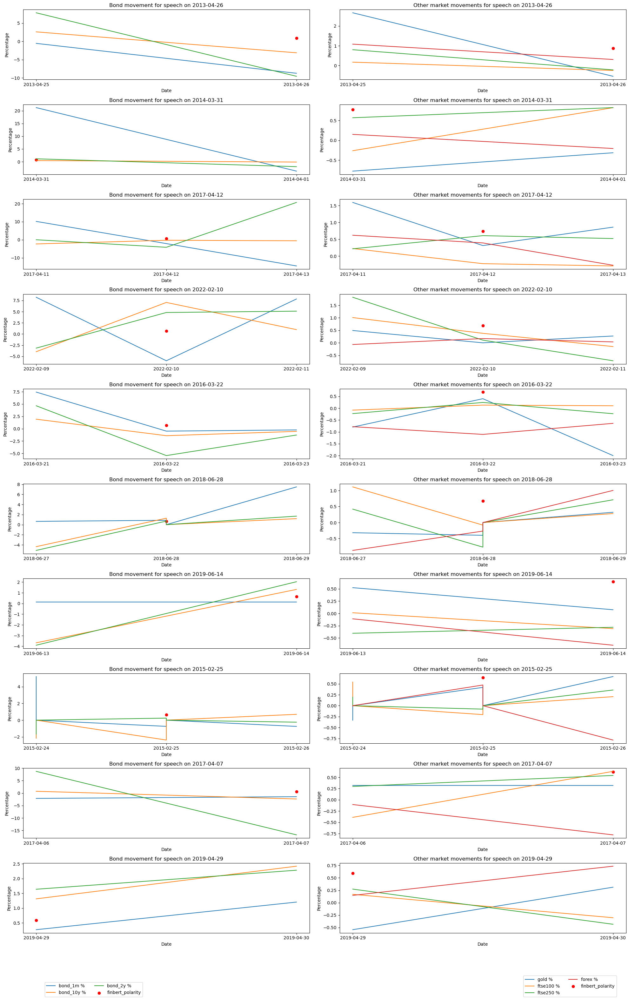

In [73]:
# Set the plot and figure size
fig, axs = plt.subplots(nrows=len(speeches_pos_gov), ncols=2, figsize=(20, 30))

# Loop through the speeches_neg dataframe and plot the bond yields and other financial instruments for each date
for i, date in enumerate(speeches_pos_gov['date']):
    x = daily_change.loc[(daily_change['date'].isin([date])) | (daily_change['date'].between(date - pd.DateOffset(days=1), 
                                                                date + pd.DateOffset(days=1))), 'date']
    y_bond = daily_change.loc[(daily_change['date'].isin([date])) | (daily_change['date'].between(date - pd.DateOffset(days=1), 
                date + pd.DateOffset(days=1))), ['bond_1m %', 'bond_10y %', 'bond_2y %']]

    y_other = daily_change.loc[(daily_change['date'].isin([date])) | (daily_change['date'].between(date - pd.DateOffset(days=1), 
                                                                date + pd.DateOffset(days=1))), ['gold %', 'ftse100 %', 'ftse250 %', 'forex %']]

    row = i

    # Plot bond yields
    axs[row, 0].plot(x, y_bond['bond_1m %'], label='bond_1m %')
    axs[row, 0].plot(x, y_bond['bond_10y %'], label='bond_10y %')
    axs[row, 0].plot(x, y_bond['bond_2y %'], label='bond_2y %')
    axs[row, 0].scatter(speeches_pos_gov.loc[speeches_pos_gov['date'] == date, 'date'], speeches_pos_gov.loc[speeches_pos_gov['date'] 
                                                               == date, 'finbert_polarity'], color='red', label='finbert_polarity')
    axs[row, 0].set_xlabel('Date')
    axs[row, 0].set_ylabel('Percentage')
    axs[row, 0].set_title(f'Bond movement for speech on {date.date()}')  # Extracting date only
    axs[row, 0].xaxis.set_major_locator(mdates.DayLocator(interval=1))
    axs[row, 0].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

    # Plot other financial instruments
    axs[row, 1].plot(x, y_other['gold %'], label='gold %')
    axs[row, 1].plot(x, y_other['ftse100 %'], label='ftse100 %')
    axs[row, 1].plot(x, y_other['ftse250 %'], label='ftse250 %')
    axs[row, 1].plot(x, y_other['forex %'], label='forex %')
    axs[row, 1].scatter(speeches_pos_gov.loc[speeches_pos_gov['date'] == date, 'date'], speeches_pos_gov.loc[speeches_pos_gov['date'] 
                                                                == date, 'finbert_polarity'], color='red', label='finbert_polarity')
    axs[row, 1].set_xlabel('Date')
    axs[row, 1].set_ylabel('Percentage')
    axs[row, 1].set_title(f'Other market movements for speech on {date.date()}')  # Extracting date only
    axs[row, 1].xaxis.set_major_locator(mdates.DayLocator(interval=1))
    axs[row, 1].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

    # Disable legend for each subplot
    axs[row, 0].legend().set_visible(False)
    axs[row, 1].legend().set_visible(False)

# Extract handles and labels from one subplot only for each set
handles_bond, labels_bond = axs[0, 0].get_legend_handles_labels()
handles_other, labels_other = axs[0, 1].get_legend_handles_labels()

# Add a single legend at the bottom of all the plots for each set
fig.legend(handles_bond, labels_bond, loc='lower center', bbox_to_anchor=(0.15, -0.05), ncol=2)
fig.legend(handles_other, labels_other, loc='lower center', bbox_to_anchor=(0.9, -0.05), ncol=2)

# Show plot
plt.tight_layout()
plt.show()

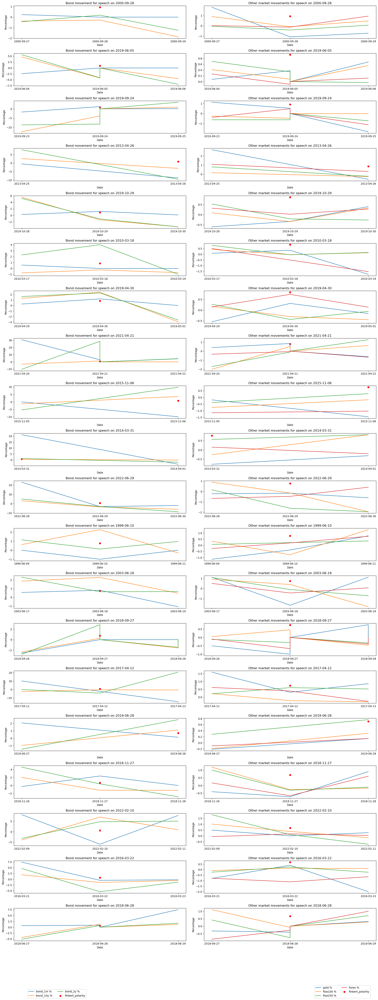

In [74]:
# Set the plot and figure size
fig, axs = plt.subplots(nrows=len(speeches_pos), ncols=2, figsize=(20, 50))

# Loop through the speeches_neg dataframe and plot the bond yields and other financial instruments for each date
for i, date in enumerate(speeches_pos['date']):
    x = daily_change.loc[(daily_change['date'].isin([date])) | (daily_change['date'].between(date - pd.DateOffset(days=1), 
                                                                date + pd.DateOffset(days=1))), 'date']
    y_bond = daily_change.loc[(daily_change['date'].isin([date])) | (daily_change['date'].between(date - pd.DateOffset(days=1), 
                date + pd.DateOffset(days=1))), ['bond_1m %', 'bond_10y %', 'bond_2y %']]

    y_other = daily_change.loc[(daily_change['date'].isin([date])) | (daily_change['date'].between(date - pd.DateOffset(days=1), 
                                                                date + pd.DateOffset(days=1))), ['gold %', 'ftse100 %', 'ftse250 %', 'forex %']]

    row = i

    # Plot bond yields
    axs[row, 0].plot(x, y_bond['bond_1m %'], label='bond_1m %')
    axs[row, 0].plot(x, y_bond['bond_10y %'], label='bond_10y %')
    axs[row, 0].plot(x, y_bond['bond_2y %'], label='bond_2y %')
    axs[row, 0].scatter(speeches_pos.loc[speeches_pos['date'] == date, 'date'], speeches_pos.loc[speeches_pos['date'] 
                                                               == date, 'finbert_polarity'], color='red', label='finbert_polarity')
    axs[row, 0].set_xlabel('Date')
    axs[row, 0].set_ylabel('Percentage')
    axs[row, 0].set_title(f'Bond movement for speech on {date.date()}')  # Extracting date only
    axs[row, 0].xaxis.set_major_locator(mdates.DayLocator(interval=1))
    axs[row, 0].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

    # Plot other financial instruments
    axs[row, 1].plot(x, y_other['gold %'], label='gold %')
    axs[row, 1].plot(x, y_other['ftse100 %'], label='ftse100 %')
    axs[row, 1].plot(x, y_other['ftse250 %'], label='ftse250 %')
    axs[row, 1].plot(x, y_other['forex %'], label='forex %')
    axs[row, 1].scatter(speeches_pos.loc[speeches_pos['date'] == date, 'date'], speeches_pos.loc[speeches_pos['date'] 
                                                                == date, 'finbert_polarity'], color='red', label='finbert_polarity')
    axs[row, 1].set_xlabel('Date')
    axs[row, 1].set_ylabel('Percentage')
    axs[row, 1].set_title(f'Other market movements for speech on {date.date()}')  # Extracting date only
    axs[row, 1].xaxis.set_major_locator(mdates.DayLocator(interval=1))
    axs[row, 1].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

    # Disable legend for each subplot
    axs[row, 0].legend().set_visible(False)
    axs[row, 1].legend().set_visible(False)

# Extract handles and labels from one subplot only for each set
handles_bond, labels_bond = axs[0, 0].get_legend_handles_labels()
handles_other, labels_other = axs[0, 1].get_legend_handles_labels()

# Add a single legend at the bottom of all the plots for each set
fig.legend(handles_bond, labels_bond, loc='lower center', bbox_to_anchor=(0.15, -0.05), ncol=2)
fig.legend(handles_other, labels_other, loc='lower center', bbox_to_anchor=(0.9, -0.05), ncol=2)

# Show plot
plt.tight_layout()
plt.show()

This only served to confirm that the day of a speech the markets are moving in various directions regardless of the sentiment of the speech on the day. 

Just out of interest Governor speeches on average vs non Governor.

In [75]:
# Calculate the average finbert_polarity for all speeches
average_all = speeches['finbert_polarity'].mean()

# Filter speeches where is_gov is false
non_gov = speeches[speeches['is_gov'] == False]

# Calculate the average finbert_polarity for speeches where is_gov is false
average_non_gov = non_gov['finbert_polarity'].mean()

# Filter speeches where is_gov is true
gov = speeches[speeches['is_gov'] == True]

# Calculate the average finbert_polarity for speeches where is_gov is true
average_gov = gov['finbert_polarity'].mean()

# Print the results
print("Average finbert_polarity for all speeches:", average_all)
print("Average finbert_polarity for non Governor speeches:", average_non_gov)
print("Average finbert_polarity for Governor speeches:", average_gov)

Average finbert_polarity for all speeches: 0.005786884101472798
Average finbert_polarity for non Governor speeches: -0.005206860353118172
Average finbert_polarity for Governor speeches: 0.06467358977047873


Interstingly the Governor tends to be a little more positve than non Governors but overall the sentiment is very neutral.

Now a look at the count of the positive and negative movements for each market on the day of the Governor's speech grouped by either negative or positive FinBERT scores.

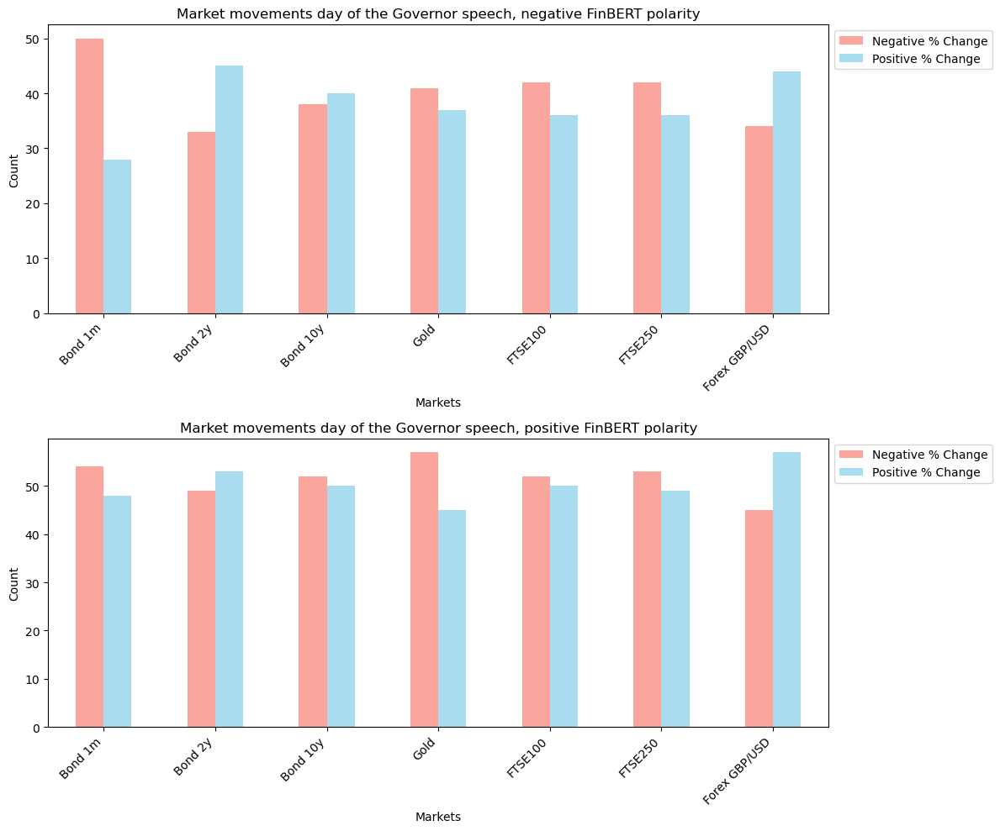

In [76]:
# Define the columns of interest
columns_of_interest = ['bond_1m %', 'bond_2y %', 'bond_10y %', 'gold %', 'ftse100 %', 'ftse250 %', 'forex %']
column_labels = ['Bond 1m', 'Bond 2y', 'Bond 10y', 'Gold', 'FTSE100', 'FTSE250', 'Forex GBP/USD']

# Create a new DataFrame with the counts of positive and negative values for each column
negative_polarity_counts = speech_day.loc[speech_day['finbert_polarity'] < 0, columns_of_interest].apply(lambda x: (x < 0).value_counts())
positive_polarity_counts = speech_day.loc[speech_day['finbert_polarity'] >= 0, columns_of_interest].apply(lambda x: (x < 0).value_counts())

# Plotting
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 10))

# Plot for values below 0
negative_polarity_counts.T.plot(kind='bar', ax=axes[0], color=['salmon', 'skyblue'], alpha=0.7)
axes[0].set_title('Market movements day of the Governor speech, negative FinBERT polarity')
axes[0].set_ylabel('Count')
axes[0].set_xlabel('Markets')
axes[0].set_xticklabels(column_labels, rotation=45, ha='right')

# Plot for values above 0
positive_polarity_counts.T.plot(kind='bar', ax=axes[1], color=['salmon', 'skyblue'], alpha=0.7)
axes[1].set_title('Market movements day of the Governor speech, positive FinBERT polarity')
axes[1].set_ylabel('Count')
axes[1].set_xlabel('Markets')
axes[1].set_xticklabels(column_labels, rotation=45, ha='right')

# Set legend outside the plot
axes[0].legend(['Negative % Change', 'Positive % Change'], loc='upper left', bbox_to_anchor=(1, 1))
axes[1].legend(['Negative % Change', 'Positive % Change'], loc='upper left', bbox_to_anchor=(1, 1))

# Show plot
plt.tight_layout()
plt.show()

The day before.

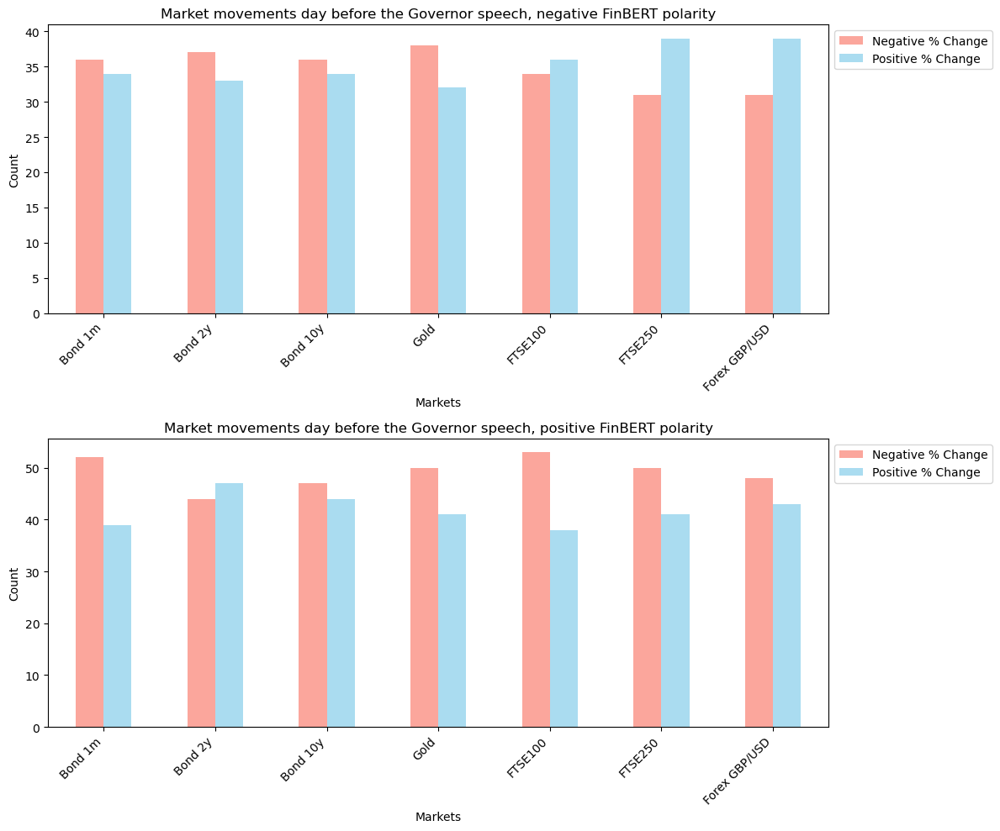

In [77]:
# Define the columns of interest
columns_of_interest = ['bond_1m %', 'bond_2y %', 'bond_10y %', 'gold %', 'ftse100 %', 'ftse250 %', 'forex %']
column_labels = ['Bond 1m', 'Bond 2y', 'Bond 10y', 'Gold', 'FTSE100', 'FTSE250', 'Forex GBP/USD']

# Create a new DataFrame with the counts of positive and negative values for each column
negative_polarity_counts = speech_day_before.loc[speech_day_before['finbert_polarity'] < 0, 
                                                columns_of_interest].apply(lambda x: (x < 0).value_counts())
positive_polarity_counts = speech_day_before.loc[speech_day_before['finbert_polarity'] >= 0, 
                                                columns_of_interest].apply(lambda x: (x < 0).value_counts())

# Plotting
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 10))

# Plot for values below 0
negative_polarity_counts.T.plot(kind='bar', ax=axes[0], color=['salmon', 'skyblue'], alpha=0.7)
axes[0].set_title('Market movements day before the Governor speech, negative FinBERT polarity')
axes[0].set_ylabel('Count')
axes[0].set_xlabel('Markets')
axes[0].set_xticklabels(column_labels, rotation=45, ha='right')

# Plot for values above 0
positive_polarity_counts.T.plot(kind='bar', ax=axes[1], color=['salmon', 'skyblue'], alpha=0.7)
axes[1].set_title('Market movements day before the Governor speech, positive FinBERT polarity')
axes[1].set_ylabel('Count')
axes[1].set_xlabel('Markets')
axes[1].set_xticklabels(column_labels, rotation=45, ha='right')

# Set legend outside the plot
axes[0].legend(['Negative % Change', 'Positive % Change'], loc='upper left', bbox_to_anchor=(1, 1))
axes[1].legend(['Negative % Change', 'Positive % Change'], loc='upper left', bbox_to_anchor=(1, 1))

# Show plot
plt.tight_layout()
plt.show()

And the day after

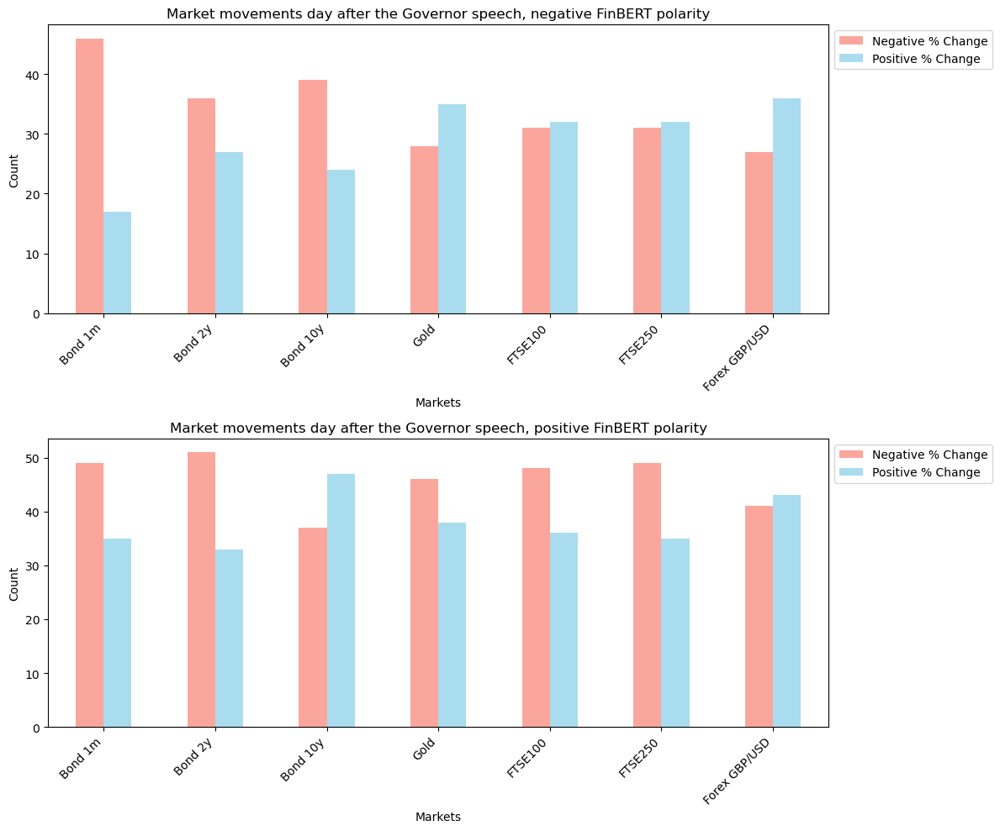

In [78]:
# Define the columns of interest
columns_of_interest = ['bond_1m %', 'bond_2y %', 'bond_10y %', 'gold %', 'ftse100 %', 'ftse250 %', 'forex %']
column_labels = ['Bond 1m', 'Bond 2y', 'Bond 10y', 'Gold', 'FTSE100', 'FTSE250', 'Forex GBP/USD']

# Create a new DataFrame with the counts of positive and negative values for each column
negative_polarity_counts = speech_day_after.loc[speech_day_after['finbert_polarity'] < 0, 
                                                columns_of_interest].apply(lambda x: (x < 0).value_counts())
positive_polarity_counts = speech_day_after.loc[speech_day_after['finbert_polarity'] >= 0, 
                                                columns_of_interest].apply(lambda x: (x < 0).value_counts())

# Plotting
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 10))

# Plot for values below 0
negative_polarity_counts.T.plot(kind='bar', ax=axes[0], color=['salmon', 'skyblue'], alpha=0.7)
axes[0].set_title('Market movements day after the Governor speech, negative FinBERT polarity')
axes[0].set_ylabel('Count')
axes[0].set_xlabel('Markets')
axes[0].set_xticklabels(column_labels, rotation=45, ha='right')

# Plot for values above 0
positive_polarity_counts.T.plot(kind='bar', ax=axes[1], color=['salmon', 'skyblue'], alpha=0.7)
axes[1].set_title('Market movements day after the Governor speech, positive FinBERT polarity')
axes[1].set_ylabel('Count')
axes[1].set_xlabel('Markets')
axes[1].set_xticklabels(column_labels, rotation=45, ha='right')

# Set legend outside the plot
axes[0].legend(['Negative % Change', 'Positive % Change'], loc='upper left', bbox_to_anchor=(1, 1))
axes[1].legend(['Negative % Change', 'Positive % Change'], loc='upper left', bbox_to_anchor=(1, 1))

# Show plot
plt.tight_layout()
plt.show()

The most interesting thing from looking into these 3 days around the Governor's speeches is the movement of 1-month bonds on the day of a negative speech. This is in line with what could be expected in times of negative sentiment when investors are searching for safe-haven assets.

Now for a look at all the pseeches and the 120 at either end of the FinBERT scores on the day of the speech

In [79]:
# Sort the DataFrame by finbert_polarity
speeches_10 = speeches.sort_values(by='finbert_polarity')

# Select the top 120 and bottom 120 rows
top_120 = speeches_10.tail(120)
bottom_120 = speeches_10.head(120)

# Concatenate the two DataFrames
speeches_10 = pd.concat([top_120, bottom_120])

# Reset index
speeches_10.reset_index(drop=True, inplace=True)

# View the DataFrame
speeches_10

,date,author,is_gov,vader_polarity,lm_polarity,finbert_polarity
0,2015-01-20,Cunliffe,False,0.9998,0.136842,0.298403
1,2001-10-10,Clementi,False,0.9986,-0.157143,0.299749
2,2007-03-15,Sentance,False,0.9999,-0.205882,0.300618
3,2006-07-20,Gieve,False,0.9992,0.155556,0.301860
4,2017-04-20,Carney,True,0.9998,-0.126904,0.306225
...,...,...,...,...,...,...
235,2013-01-22,King,True,0.9987,-0.301075,-0.256751
236,2005-01-20,King,True,0.9978,-0.290323,-0.256302
237,2005-09-16,Walton,False,0.9974,-0.087719,-0.255904
238,2012-06-12,Tucker,False,0.9994,-0.370079,-0.254175


In [80]:
# Remove 'author' and 'is_gov' columns
speeches_10 = speeches_10.drop(['author', 'is_gov'], axis=1)

# Sort the DataFrame by date
speeches_10.sort_values(by='date', inplace=True)

# View the DataFrame
speeches_10

,date,vader_polarity,lm_polarity,finbert_polarity
122,1999-01-12,0.9964,-0.528455,-0.748517
158,1999-01-18,0.9993,-0.229508,-0.436865
183,1999-02-10,0.9995,-0.156627,-0.345548
108,1999-06-10,0.9994,-0.185841,0.765731
12,1999-11-19,0.9998,0.041916,0.325424
...,...,...,...,...
109,2022-06-29,0.9998,0.211268,0.769081
206,2022-07-06,0.9999,-0.475936,-0.310112
8,2022-07-18,0.9991,-0.355705,0.317359
93,2022-07-20,0.9995,0.185185,0.630510


In [81]:
# Merge speeches_10 with daily_change based on matching dates
speeches_10_day = pd.merge(speeches_10[['date', 'finbert_polarity']], daily_change, on='date', how='left')

# View the DataFrame
speeches_10_day

,date,finbert_polarity,gold %,bond_1m %,bond_10y %,bond_2y %,ftse100 %,ftse250 %,forex %
0,1999-01-12,-0.748517,-1.694915,-0.016584,1.372732,-0.313152,-0.844698,-0.098352,0.141130
1,1999-01-18,-0.436865,0.000000,0.000000,0.233372,0.147462,3.078605,0.961473,0.133309
2,1999-02-10,-0.345548,0.000000,0.000000,0.184459,0.270946,-0.167818,-0.384353,-0.677738
3,1999-06-10,0.765731,-0.383142,-0.992025,2.265891,0.133004,-0.768636,0.214361,0.193496
4,1999-11-19,0.325424,0.337838,0.188324,0.508210,0.459846,-1.045674,0.097078,0.315711
...,...,...,...,...,...,...,...,...,...
293,2022-07-06,-0.310112,-1.808932,-3.015564,2.096538,4.090101,1.171444,1.524404,-0.225809
294,2022-07-18,0.317359,0.352113,3.336809,3.451582,3.131524,0.896776,0.963154,0.860614
295,2022-07-20,0.630510,-0.642899,-6.881903,-1.561065,1.400290,-0.438578,0.607808,-0.216757
296,2022-09-29,-0.397771,-0.059880,4.709274,3.268463,2.474081,-1.767205,-3.063331,2.084864


In [82]:
# Remove duplicates
speeches_10_day = speeches_10_day.drop_duplicates(subset=['date', 'finbert_polarity'])

# View the dataframe
speeches_10_day

,date,finbert_polarity,gold %,bond_1m %,bond_10y %,bond_2y %,ftse100 %,ftse250 %,forex %
0,1999-01-12,-0.748517,-1.694915,-0.016584,1.372732,-0.313152,-0.844698,-0.098352,0.141130
1,1999-01-18,-0.436865,0.000000,0.000000,0.233372,0.147462,3.078605,0.961473,0.133309
2,1999-02-10,-0.345548,0.000000,0.000000,0.184459,0.270946,-0.167818,-0.384353,-0.677738
3,1999-06-10,0.765731,-0.383142,-0.992025,2.265891,0.133004,-0.768636,0.214361,0.193496
4,1999-11-19,0.325424,0.337838,0.188324,0.508210,0.459846,-1.045674,0.097078,0.315711
...,...,...,...,...,...,...,...,...,...
292,2022-06-29,0.769081,-0.164745,-3.152709,-3.445480,-3.064592,-0.151570,-1.614879,-0.467903
293,2022-07-06,-0.310112,-1.808932,-3.015564,2.096538,4.090101,1.171444,1.524404,-0.225809
294,2022-07-18,0.317359,0.352113,3.336809,3.451582,3.131524,0.896776,0.963154,0.860614
295,2022-07-20,0.630510,-0.642899,-6.881903,-1.561065,1.400290,-0.438578,0.607808,-0.216757


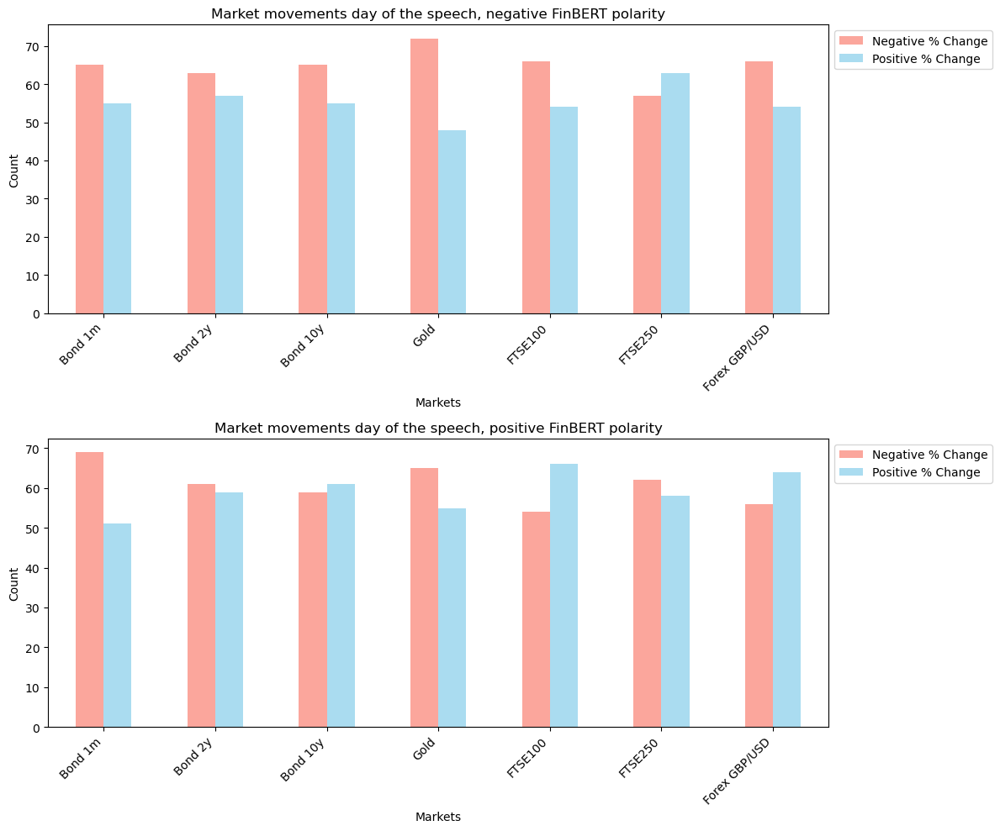

In [83]:
# Define the columns of interest
columns_of_interest = ['bond_1m %', 'bond_2y %', 'bond_10y %', 'gold %', 'ftse100 %', 'ftse250 %', 'forex %']
column_labels = ['Bond 1m', 'Bond 2y', 'Bond 10y', 'Gold', 'FTSE100', 'FTSE250', 'Forex GBP/USD']

# Create a new DataFrame with the counts of positive and negative values for each column
negative_polarity_counts = speeches_10_day.loc[speeches_10_day['finbert_polarity'] < 0, 
                                                columns_of_interest].apply(lambda x: (x < 0).value_counts())
positive_polarity_counts = speeches_10_day.loc[speeches_10_day['finbert_polarity'] >= 0, 
                                                columns_of_interest].apply(lambda x: (x < 0).value_counts())

# Plotting
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 10))

# Plot for values below 0
negative_polarity_counts.T.plot(kind='bar', ax=axes[0], color=['salmon', 'skyblue'], alpha=0.7)
axes[0].set_title('Market movements day of the speech, negative FinBERT polarity')
axes[0].set_ylabel('Count')
axes[0].set_xlabel('Markets')
axes[0].set_xticklabels(column_labels, rotation=45, ha='right')

# Plot for values above 0
positive_polarity_counts.T.plot(kind='bar', ax=axes[1], color=['salmon', 'skyblue'], alpha=0.7)
axes[1].set_title('Market movements day of the speech, positive FinBERT polarity')
axes[1].set_ylabel('Count')
axes[1].set_xlabel('Markets')
axes[1].set_xticklabels(column_labels, rotation=45, ha='right')

# Set legend outside the plot
axes[0].legend(['Negative % Change', 'Positive % Change'], loc='upper left', bbox_to_anchor=(1, 1))
axes[1].legend(['Negative % Change', 'Positive % Change'], loc='upper left', bbox_to_anchor=(1, 1))

# Show plot
plt.tight_layout()
plt.show()

Nothing of interest other than gold prices dropping with the negative speeches but this doesn't make a lot of sense as normally the markets woould be buying gold if they were concerned with the speech content portraying a negative economic outlook.
This makes me wonder about all the speeches and their settings and authors and what relevance a lot of them hold.

The GFC I will look into now to take a closer look at a time of significance. I will combine all the speeches with the changes in the markets on the day it was taken.

In [84]:
# Check my dataframe from above
daily_change_gfc

,date,gold %,bond_1m %,bond_10y %,bond_2y %,ftse100 %,ftse250 %,forex %
2133,2007-06-01,1.499250,-0.089960,0.076526,0.385559,0.833651,0.706795,0.070682
2134,2007-06-04,-0.147710,0.090041,0.841139,0.837989,-0.188717,-0.502593,0.489380
2135,2007-06-05,-0.147929,0.125945,0.227488,0.277008,-0.469685,-0.570234,0.075309
2136,2007-06-06,0.000000,0.035939,0.416115,-0.552486,-1.659927,-2.352023,-0.045151
2137,2007-06-07,-1.481481,0.143704,-0.772273,-1.024306,-0.269828,-1.324862,-0.727766
...,...,...,...,...,...,...,...,...
2808,2010-01-26,0.182482,0.779727,-0.870456,-3.450980,0.315573,-0.002144,-0.603411
2809,2010-01-27,-1.183971,-0.967118,0.490702,3.249391,-1.125659,-0.512225,0.117698
2810,2010-01-27,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2811,2010-01-28,0.000000,0.000000,0.873811,4.169945,-1.376134,-0.340714,-0.228932


In [85]:
# Filter the DataFrame for dates between "2007-06-01" and "2010-01-31"
speeches_gfc = speeches[(speeches['date'] >= '2007-06-01') & (speeches['date'] <= '2010-01-31')]

# Remove 'author' and 'is_gov' columns
speeches_gfc = speeches_gfc.drop(['author', 'is_gov'], axis=1)

# View the dataframe
speeches_gfc

,date,vader_polarity,lm_polarity,finbert_polarity
260,2007-06-11,0.9995,-0.333333,0.136193
261,2007-06-15,0.9999,-0.029240,0.009835
262,2007-06-20,0.9995,-0.025000,0.443240
263,2007-06-26,1.0000,0.012987,-0.027039
264,2007-06-29,0.9997,-0.203762,0.156303
...,...,...,...,...
367,2009-12-16,0.9997,-0.427136,-0.002351
368,2010-01-19,0.9968,-0.397260,-0.241259
369,2010-01-21,0.9998,-0.525641,-0.111540
370,2010-01-27,-0.9951,-0.288660,0.192988


In [86]:
# Merge the speeches and daily movements on the day
speeches_gfc_day = pd.merge(speeches_gfc[['date', 'finbert_polarity']], daily_change, on='date', how='left')

# View the dataframe
speeches_gfc_day

,date,finbert_polarity,gold %,bond_1m %,bond_10y %,bond_2y %,ftse100 %,ftse250 %,forex %
0,2007-06-11,0.136193,1.384615,-0.518598,0.504484,0.330722,0.959246,0.448051,-0.040607
1,2007-06-15,0.009835,0.457317,-0.179437,0.220183,-1.407242,1.240620,1.612297,0.319846
2,2007-06-20,0.443240,-0.751880,-0.071788,-0.712980,-0.470219,-0.013539,-0.166708,0.256513
3,2007-06-26,-0.027039,-1.526718,0.106063,-0.363108,-0.103770,-0.441687,-0.348099,0.050053
4,2007-06-29,0.156303,0.153846,0.493392,0.424041,0.506904,0.556969,0.072917,0.319537
...,...,...,...,...,...,...,...,...,...
115,2010-01-21,-0.111540,-0.898473,-0.388350,-2.493766,-6.583760,-1.580942,-0.572197,-0.515875
116,2010-01-27,0.192988,-1.183971,-0.967118,0.490702,3.249391,-1.125659,-0.512225,0.117698
117,2010-01-27,0.192988,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
118,2010-01-27,-0.054856,-1.183971,-0.967118,0.490702,3.249391,-1.125659,-0.512225,0.117698


In [87]:
# Remove duplicates
speeches_gfc_day = speeches_gfc_day.drop_duplicates(subset=['date', 'finbert_polarity'])

# View the dataframe
speeches_gfc_day

,date,finbert_polarity,gold %,bond_1m %,bond_10y %,bond_2y %,ftse100 %,ftse250 %,forex %
0,2007-06-11,0.136193,1.384615,-0.518598,0.504484,0.330722,0.959246,0.448051,-0.040607
1,2007-06-15,0.009835,0.457317,-0.179437,0.220183,-1.407242,1.240620,1.612297,0.319846
2,2007-06-20,0.443240,-0.751880,-0.071788,-0.712980,-0.470219,-0.013539,-0.166708,0.256513
3,2007-06-26,-0.027039,-1.526718,0.106063,-0.363108,-0.103770,-0.441687,-0.348099,0.050053
4,2007-06-29,0.156303,0.153846,0.493392,0.424041,0.506904,0.556969,0.072917,0.319537
...,...,...,...,...,...,...,...,...,...
113,2009-12-16,-0.002351,1.157614,1.443299,-0.845937,-4.717711,0.652692,1.268431,0.362475
114,2010-01-19,-0.241259,0.087719,0.000000,1.853262,6.805444,0.340350,-0.174457,0.232672
115,2010-01-21,-0.111540,-0.898473,-0.388350,-2.493766,-6.583760,-1.580942,-0.572197,-0.515875
116,2010-01-27,0.192988,-1.183971,-0.967118,0.490702,3.249391,-1.125659,-0.512225,0.117698


So lets see how that visualises.

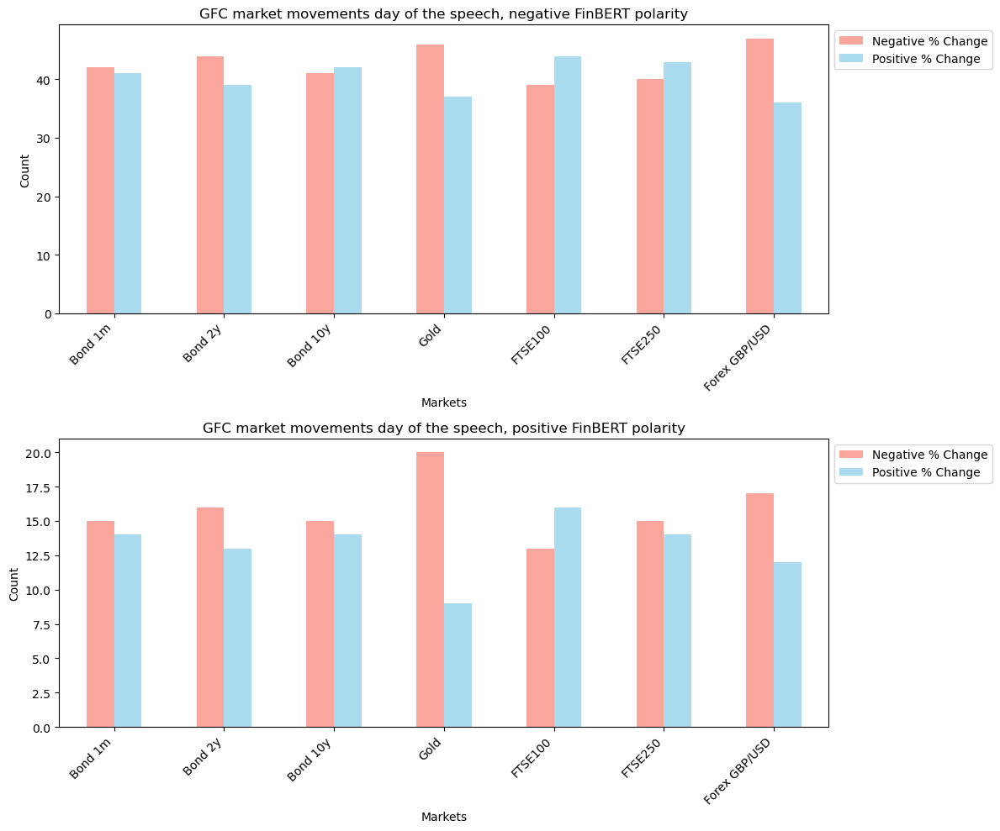

In [88]:
# Define the columns of interest
columns_of_interest = ['bond_1m %', 'bond_2y %', 'bond_10y %', 'gold %', 'ftse100 %', 'ftse250 %', 'forex %']
column_labels = ['Bond 1m', 'Bond 2y', 'Bond 10y', 'Gold', 'FTSE100', 'FTSE250', 'Forex GBP/USD']

# Create a new DataFrame with the counts of positive and negative values for each column
negative_polarity_counts = speeches_gfc_day.loc[speeches_gfc_day['finbert_polarity'] < 0, 
                                                columns_of_interest].apply(lambda x: (x < 0).value_counts())
positive_polarity_counts = speeches_gfc_day.loc[speeches_gfc_day['finbert_polarity'] >= 0, 
                                                columns_of_interest].apply(lambda x: (x < 0).value_counts())

# Plotting
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 10))

# Plot for values below 0
negative_polarity_counts.T.plot(kind='bar', ax=axes[0], color=['salmon', 'skyblue'], alpha=0.7)
axes[0].set_title('GFC market movements day of the speech, negative FinBERT polarity')
axes[0].set_ylabel('Count')
axes[0].set_xlabel('Markets')
axes[0].set_xticklabels(column_labels, rotation=45, ha='right')

# Plot for values above 0
positive_polarity_counts.T.plot(kind='bar', ax=axes[1], color=['salmon', 'skyblue'], alpha=0.7)
axes[1].set_title('GFC market movements day of the speech, positive FinBERT polarity')
axes[1].set_ylabel('Count')
axes[1].set_xlabel('Markets')
axes[1].set_xticklabels(column_labels, rotation=45, ha='right')

# Set legend outside the plot
axes[0].legend(['Negative % Change', 'Positive % Change'], loc='upper left', bbox_to_anchor=(1, 1))
axes[1].legend(['Negative % Change', 'Positive % Change'], loc='upper left', bbox_to_anchor=(1, 1))

# Show plot
plt.tight_layout()
plt.show()

So during the GFC other than Gold then it's pretty even with days positive and negative quite even amongst all the markets.
The Gold negative movements during a positive speech is a stand out correlation that can be expected when the economy is moving out of a negative period and into a positive era as Gold is sold having been the safe investment in negative times.

A function to plot any time frame was made for ease of exploring other time frames.

In [89]:
# Create a function to plot the negative and positive 
def plot_market_movements(start_date, end_date, speech_df, market_df):
    """
    Plot market movements for a given date range with sentiment analysis scores.

    :param start_date: Start date for the date range.
    :param end_date: End date for the date range.
    :param speech_df: DataFrame containing speech data.
    :param market_df: DataFrame containing market data.
    :return: None
    """
    # Convert 'date' column to datetime format in speech_df
    speech_df['date'] = pd.to_datetime(speech_df['date'])

    # Filter speech_df for dates between start_date and end_date
    speeches_subset = speech_df[(speech_df['date'] >= start_date) & (speech_df['date'] <= end_date)]

    # Convert 'date' column to datetime format in market_df
    market_df['date'] = pd.to_datetime(market_df['date'])

    # Filter market_df for dates between start_date and end_date
    market_subset = market_df[(market_df['date'] >= start_date) & (market_df['date'] <= end_date)]

    # Define columns of interest for market movements
    columns_of_interest = ['bond_1m %', 'bond_2y %', 'bond_10y %', 'gold %', 'ftse100 %', 'ftse250 %', 'forex %']
    column_labels = ['Bond 1m', 'Bond 2y', 'Bond 10y', 'Gold', 'FTSE100', 'FTSE250', 'Forex GBP/USD']

    # Create a new DataFrame with the counts of positive and negative values for each column
    negative_counts = market_subset[market_subset['date'].isin(speeches_subset[speeches_subset['finbert_polarity'] < 0]['date'])]
    positive_counts = market_subset[market_subset['date'].isin(speeches_subset[speeches_subset['finbert_polarity'] >= 0]['date'])]

    # Plotting
    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 10))

    # Plot for values below 0
    negative_counts[columns_of_interest].apply(lambda x: (x < 0).value_counts()).T.plot(kind='bar', ax=axes[0], color=['salmon', 'skyblue'], alpha=0.7)
    axes[0].set_title(f'Market movements from {start_date} to {end_date}, negative polarity')
    axes[0].set_ylabel('Count')
    axes[0].set_xlabel('Markets')
    axes[0].set_xticklabels(column_labels, rotation=45, ha='right')

    # Plot for values above or equal to 0
    positive_counts[columns_of_interest].apply(lambda x: (x < 0).value_counts()).T.plot(kind='bar', ax=axes[1], color=['salmon', 'skyblue'], alpha=0.7)
    axes[1].set_title(f'Market movements from {start_date} to {end_date}, positive polarity')
    axes[1].set_ylabel('Count')
    axes[1].set_xlabel('Markets')
    axes[1].set_xticklabels(column_labels, rotation=45, ha='right')

    # Set legend outside the plot
    axes[0].legend(['Negative % Change', 'Positive % Change'], loc='upper left', bbox_to_anchor=(1, 1))
    axes[1].legend(['Negative % Change', 'Positive % Change'], loc='upper left', bbox_to_anchor=(1, 1))

    # Show plot
    plt.tight_layout()
    plt.show()

The Golden Age

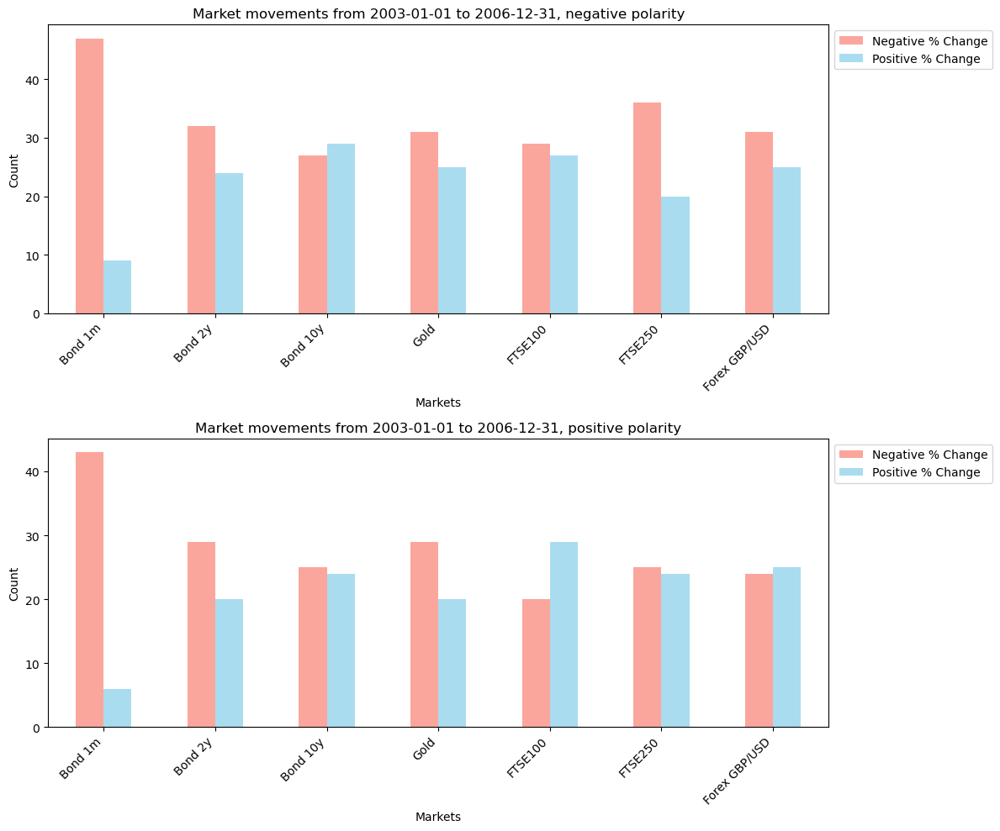

In [90]:
# Plot the Golden Age period
plot_market_movements('2003-01-01', '2006-12-31', speeches, daily_change)

Some definitive movements in 1-month bonds in this time frame but the fact that it happens regardless of speeches then this can be discarded as relevant. Also the FTSE250 movements are significantly more in the negative but with the connected nature of with the FTSE100 and no signifcant change with it then there's a string chance that there are other factors at play in this happening and data that I do not have. 

The Slough of Despond.

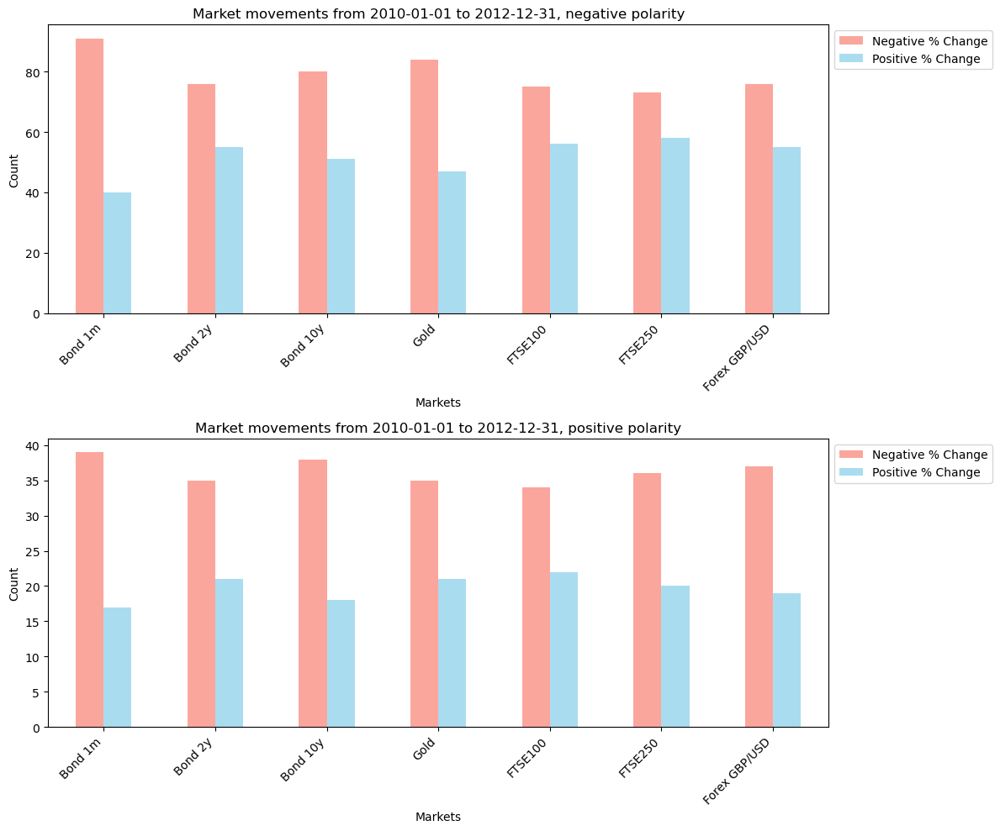

In [91]:
# Plot the Slough of Despond period
plot_market_movements('2010-01-01', '2012-12-31', speeches, daily_change)

The fact that the markets are all down regardless of the speeches only adds to the narrative that the markets are not reacting to the speeches made.

Covid through to the end of our data inclusing the Russian invasion is worth a look as another period of significance.

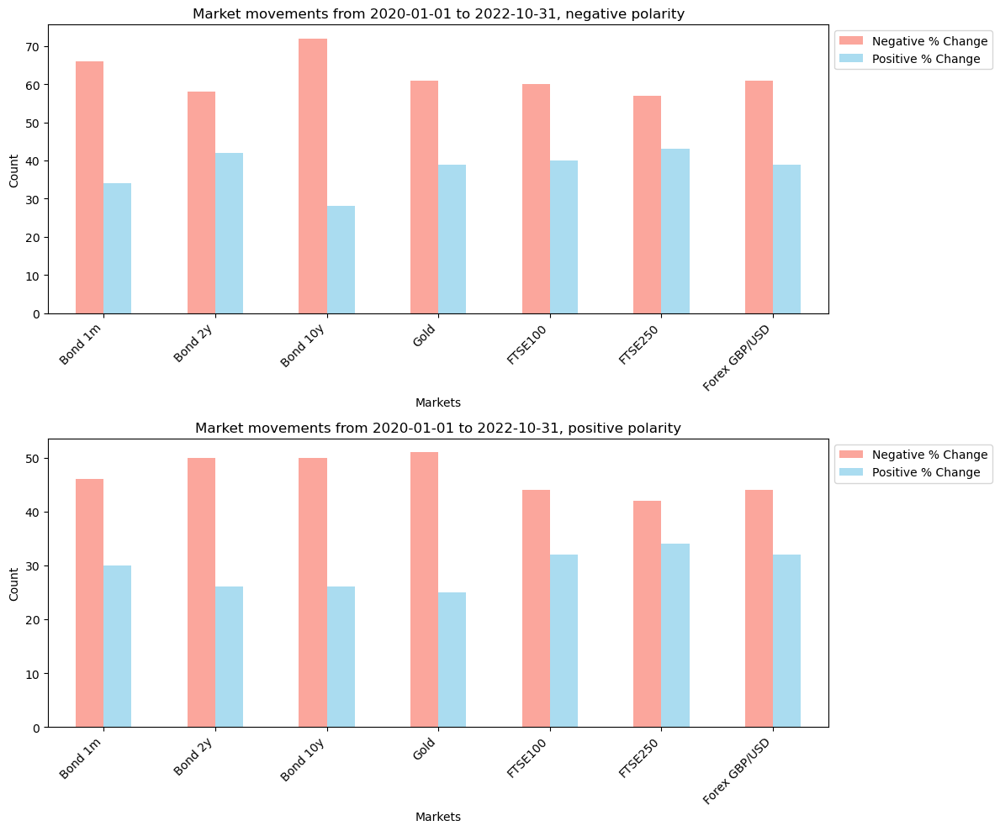

In [92]:
# Plot the covid period
plot_market_movements('2020-01-01', '2022-10-31', speeches, daily_change)

Again as with the above Slough of Despond period, the markets are moving negatively even though the speeches are positive.
Alluding to the general idea that the economic and geopolitical situation at the time is more of a factor than the speech sentiment.

# Post assignmant 2 additional analysis

## MPC and FSR reports

The reports were all analysed using our FinBERT NLP model, now to see what can be found in comparison to speeches.

Firstly the MPC reports

In [93]:
# Import the mpc_finbert_scores_final.csv
mpc = pd.read_csv('mpc_finbert_scores_final.csv')

# View the dataframe
mpc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96 entries, 0 to 95
Data columns (total 2 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   date                  96 non-null     object 
 1   mpc_finbert_polarity  96 non-null     float64
dtypes: float64(1), object(1)
memory usage: 1.6+ KB


In [94]:
# Convert the date column to datetime
mpc['date'] = pd.to_datetime(mpc['date'])

# View the dataframe
mpc

,date,mpc_finbert_polarity
0,1999-02-10,-0.229519
1,1999-05-12,-0.073518
2,1999-08-11,0.136037
3,1999-11-10,0.129230
4,2000-02-17,0.197938
...,...,...
91,2021-11-04,-0.185102
92,2022-02-03,-0.071526
93,2022-05-05,-0.179852
94,2022-08-04,-0.148186


In [95]:
# Merge the DataFrames on the 'date' column
mpc_daily = pd.merge(mpc, daily_change, on='date', how='left')

# Filter the DataFrame to include only dates between '1999-01-01' and '2022-10-31'
mpc_daily = mpc_daily[(mpc_daily['date'] >= '1999-01-01') & (mpc_daily['date'] <= '2022-10-31')]

# Drop duplicates from the 'mpc_finbert_polarity' column
mpc_daily.drop_duplicates(subset=['mpc_finbert_polarity'], inplace=True)

# View the dataframe
mpc_daily

,date,mpc_finbert_polarity,gold %,bond_1m %,bond_10y %,bond_2y %,ftse100 %,ftse250 %,forex %
0,1999-02-10,-0.229519,0.000000,0.000000,0.184459,0.270946,-0.167818,-0.384353,-0.677738
1,1999-05-12,-0.073518,-0.357143,0.000000,-1.091291,-0.374753,-0.551867,-0.736754,-0.357341
2,1999-08-11,0.136037,0.384615,0.833672,-0.520640,-0.802541,0.602168,-0.018563,-0.105263
3,1999-11-10,0.129230,2.040816,0.000000,0.233418,-0.865657,0.178696,0.329205,0.338733
4,2000-02-17,0.197938,-0.327869,0.000000,-0.546256,7.115796,1.006928,1.264899,-0.012432
...,...,...,...,...,...,...,...,...,...
91,2021-08-05,-0.018171,-0.330579,-350.000000,1.351351,30.000000,-0.049130,0.678441,0.309687
92,2021-11-04,-0.185102,1.700680,-37.142857,-12.115564,-29.587482,0.427651,1.531771,-1.359252
93,2022-02-03,-0.071526,-0.331492,29.893238,9.721116,11.047070,-0.714759,-1.265650,0.132577
94,2022-05-05,-0.179852,0.374532,37.500000,-0.101626,-5.221615,0.130777,-0.640471,-2.036289


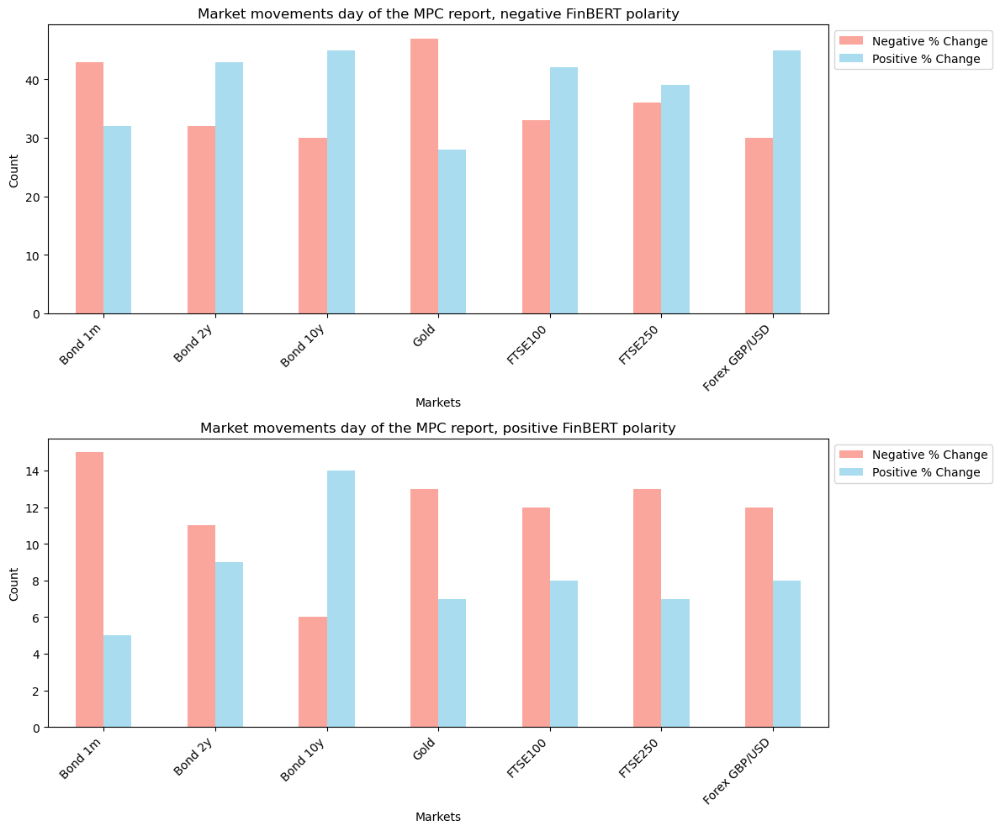

In [96]:
# Define the columns of interest
columns_of_interest = ['bond_1m %', 'bond_2y %', 'bond_10y %', 'gold %', 'ftse100 %', 'ftse250 %', 'forex %']
column_labels = ['Bond 1m', 'Bond 2y', 'Bond 10y', 'Gold', 'FTSE100', 'FTSE250', 'Forex GBP/USD']

# Create a new DataFrame with the counts of positive and negative values for each column
negative_polarity_counts = mpc_daily.loc[mpc_daily['mpc_finbert_polarity'] < 0, 
                                                columns_of_interest].apply(lambda x: (x < 0).value_counts())
positive_polarity_counts = mpc_daily.loc[mpc_daily['mpc_finbert_polarity'] >= 0, 
                                                columns_of_interest].apply(lambda x: (x < 0).value_counts())

# Plotting
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 10))

# Plot for values below 0
negative_polarity_counts.T.plot(kind='bar', ax=axes[0], color=['salmon', 'skyblue'], alpha=0.7)
axes[0].set_title('Market movements day of the MPC report, negative FinBERT polarity')
axes[0].set_ylabel('Count')
axes[0].set_xlabel('Markets')
axes[0].set_xticklabels(column_labels, rotation=45, ha='right')

# Plot for values above 0
positive_polarity_counts.T.plot(kind='bar', ax=axes[1], color=['salmon', 'skyblue'], alpha=0.7)
axes[1].set_title('Market movements day of the MPC report, positive FinBERT polarity')
axes[1].set_ylabel('Count')
axes[1].set_xlabel('Markets')
axes[1].set_xticklabels(column_labels, rotation=45, ha='right')

# Set legend outside the plot
axes[0].legend(['Negative % Change', 'Positive % Change'], loc='upper left', bbox_to_anchor=(1, 1))
axes[1].legend(['Negative % Change', 'Positive % Change'], loc='upper left', bbox_to_anchor=(1, 1))

# Show plot
plt.tight_layout()
plt.show()

The markets seem to be a lot more negative in positive reports but a big concern for the validity of the results here is the small percentage of the reports that are positive, only 20%. 

I'll look at the FSR reports now.

In [97]:
# Import the fsr_finbert_scores_final.csv
fsr = pd.read_csv('fsr_finbert_scores_final.csv')

# View the dataframe
fsr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48 entries, 0 to 47
Data columns (total 2 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   date                  48 non-null     object 
 1   fsr_finbert_polarity  48 non-null     float64
dtypes: float64(1), object(1)
memory usage: 900.0+ bytes


In [98]:
# Convert the date column to datetime
fsr['date'] = pd.to_datetime(fsr['date'])

# View the dataframe
fsr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48 entries, 0 to 47
Data columns (total 2 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   date                  48 non-null     datetime64[ns]
 1   fsr_finbert_polarity  48 non-null     float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 900.0 bytes


In [99]:
# Merge the DataFrames on the 'date' column
fsr_daily = pd.merge(fsr, daily_change, on='date', how='left')

# Filter the DataFrame to include only dates between '1999-01-01' and '2022-10-31'
fsr_daily = fsr_daily[(fsr_daily['date'] >= '1999-01-01') & (fsr_daily['date'] <= '2022-10-31')]

# Drop duplicates from the 'mpc_finbert_polarity' column
fsr_daily.drop_duplicates(subset=['fsr_finbert_polarity'], inplace=True)

# View the dataframe
fsr_daily.info()

<class 'pandas.core.frame.DataFrame'>
Index: 47 entries, 0 to 47
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   date                  47 non-null     datetime64[ns]
 1   fsr_finbert_polarity  47 non-null     float64       
 2   gold %                47 non-null     float64       
 3   bond_1m %             47 non-null     float64       
 4   bond_10y %            47 non-null     float64       
 5   bond_2y %             47 non-null     float64       
 6   ftse100 %             47 non-null     float64       
 7   ftse250 %             47 non-null     float64       
 8   forex %               47 non-null     float64       
dtypes: datetime64[ns](1), float64(8)
memory usage: 3.7 KB


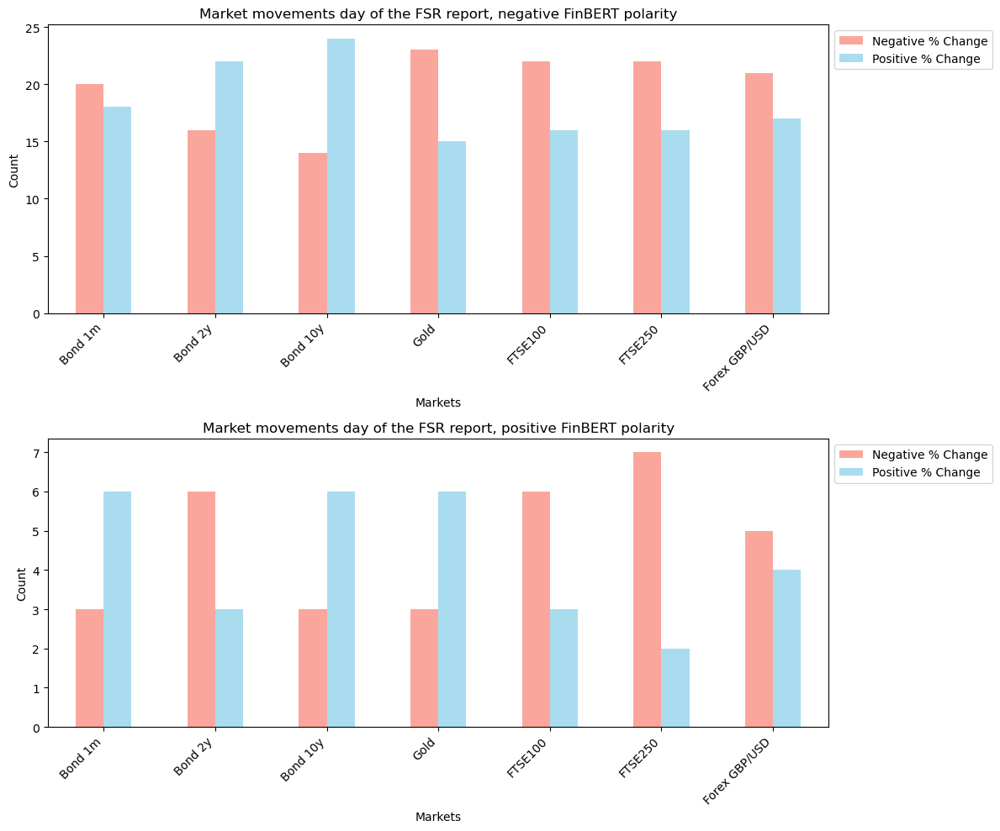

In [100]:
# Define the columns of interest
columns_of_interest = ['bond_1m %', 'bond_2y %', 'bond_10y %', 'gold %', 'ftse100 %', 'ftse250 %', 'forex %']
column_labels = ['Bond 1m', 'Bond 2y', 'Bond 10y', 'Gold', 'FTSE100', 'FTSE250', 'Forex GBP/USD']

# Create a new DataFrame with the counts of positive and negative values for each column
negative_polarity_counts = fsr_daily.loc[fsr_daily['fsr_finbert_polarity'] < 0, 
                                                columns_of_interest].apply(lambda x: (x < 0).value_counts())
positive_polarity_counts = fsr_daily.loc[fsr_daily['fsr_finbert_polarity'] >= 0, 
                                                columns_of_interest].apply(lambda x: (x < 0).value_counts())

# Plotting
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 10))

# Plot for values below 0
negative_polarity_counts.T.plot(kind='bar', ax=axes[0], color=['salmon', 'skyblue'], alpha=0.7)
axes[0].set_title('Market movements day of the FSR report, negative FinBERT polarity')
axes[0].set_ylabel('Count')
axes[0].set_xlabel('Markets')
axes[0].set_xticklabels(column_labels, rotation=45, ha='right')

# Plot for values above 0
positive_polarity_counts.T.plot(kind='bar', ax=axes[1], color=['salmon', 'skyblue'], alpha=0.7)
axes[1].set_title('Market movements day of the FSR report, positive FinBERT polarity')
axes[1].set_ylabel('Count')
axes[1].set_xlabel('Markets')
axes[1].set_xticklabels(column_labels, rotation=45, ha='right')

# Set legend outside the plot
axes[0].legend(['Negative % Change', 'Positive % Change'], loc='upper left', bbox_to_anchor=(1, 1))
axes[1].legend(['Negative % Change', 'Positive % Change'], loc='upper left', bbox_to_anchor=(1, 1))

# Show plot
plt.tight_layout()
plt.show()

Again the same concerns as with the MPC but even more so with even fewer positive reports and even fewer reports as a whole making this a potential dead end due to such a small data set.

Confirming the counts of both reports and their polarities.

In [101]:
# MPC reports
positive_count = (mpc_daily['mpc_finbert_polarity'] > 0).sum()
negative_count = (mpc_daily['mpc_finbert_polarity'] < 0).sum()

print("Positive count:", positive_count)
print("Negative count:", negative_count)

Positive count: 20
Negative count: 75


In [102]:
# FSR reports
positive_count = (fsr_daily['fsr_finbert_polarity'] > 0).sum()
negative_count = (fsr_daily['fsr_finbert_polarity'] < 0).sum()

print("Positive count:", positive_count)
print("Negative count:", negative_count)

Positive count: 9
Negative count: 38


A look at Correlations to see if the reports have any signifcant correlation

All the markets against the MPC reports.

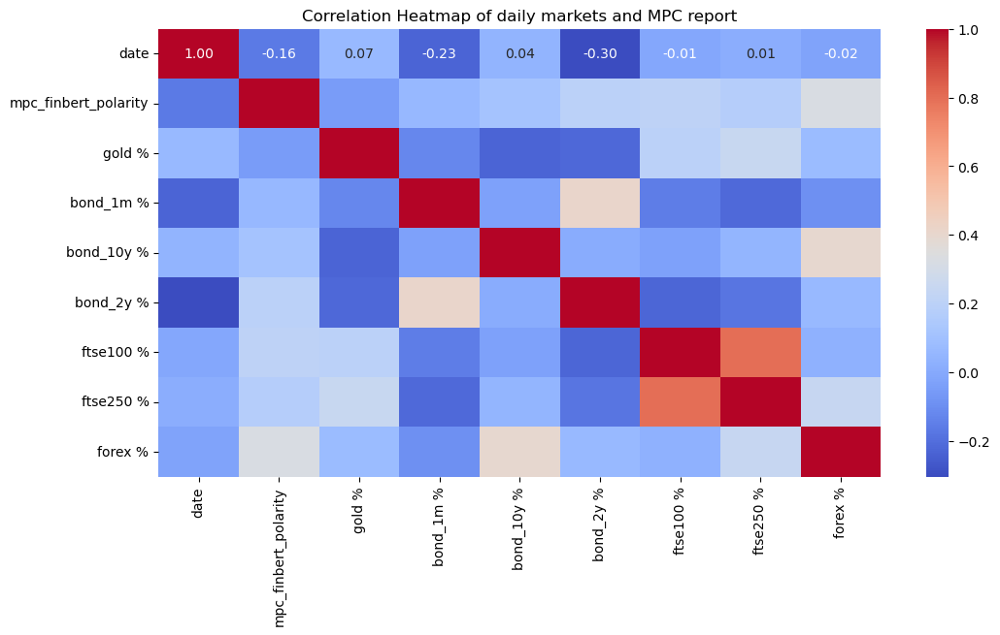

In [103]:
# Calculate correlation matrix for the filtered data
correlation_matrix = mpc_daily.corr()

# Plot correlation matrix with renamed axis labels
plt.figure(figsize=(12, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap of daily markets and MPC report')

# Show plot
plt.show()

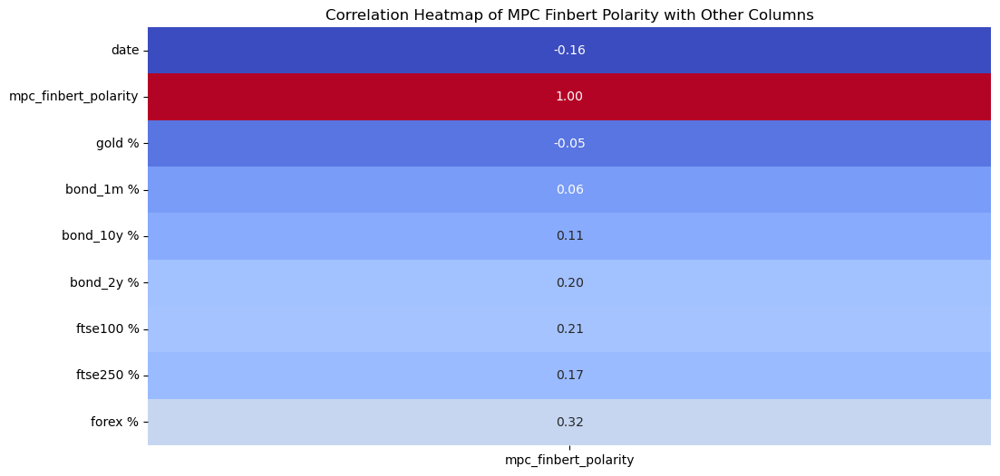

In [104]:
# Calculate correlation matrix for the filtered data
correlation_matrix = mpc_daily.corr()

# Extract correlation values for 'fsr_finbert_polarity' column
mpc_polarity_correlation = correlation_matrix['mpc_finbert_polarity']

# Plot correlation values for 'fsr_finbert_polarity'
plt.figure(figsize=(12, 6))
sns.heatmap(mpc_polarity_correlation.to_frame(), annot=True, cmap='coolwarm', fmt=".2f", cbar=False)
plt.title('Correlation Heatmap of MPC Finbert Polarity with Other Columns')

# Show plot
plt.show()

All the markets against the FSR reports.

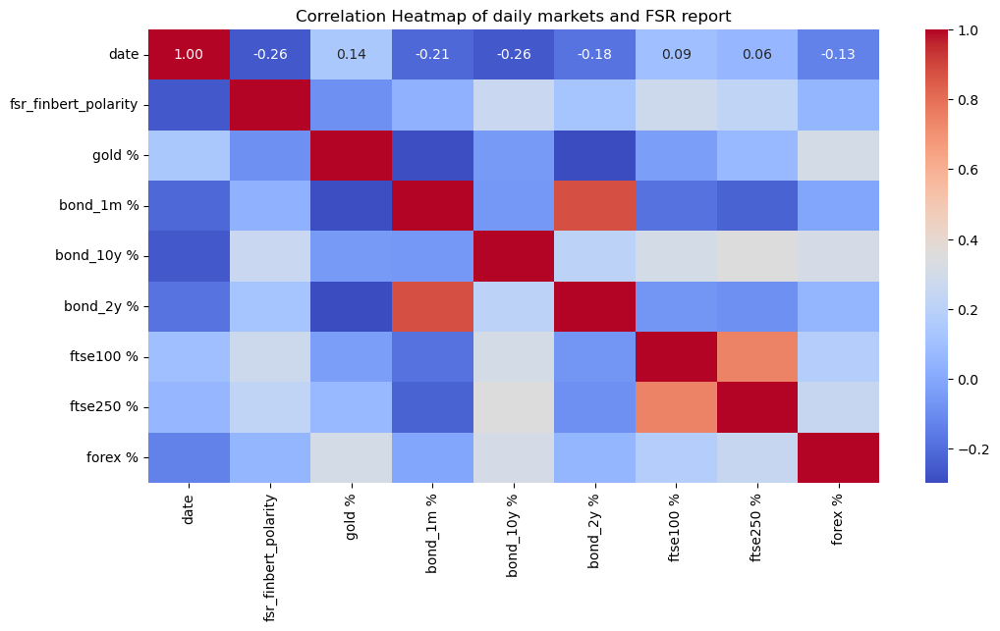

In [106]:
# Calculate correlation matrix for the filtered data
correlation_matrix = fsr_daily.corr()

# Plot correlation matrix with renamed axis labels
plt.figure(figsize=(12, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap of daily markets and FSR report')

# Show plot
plt.show()

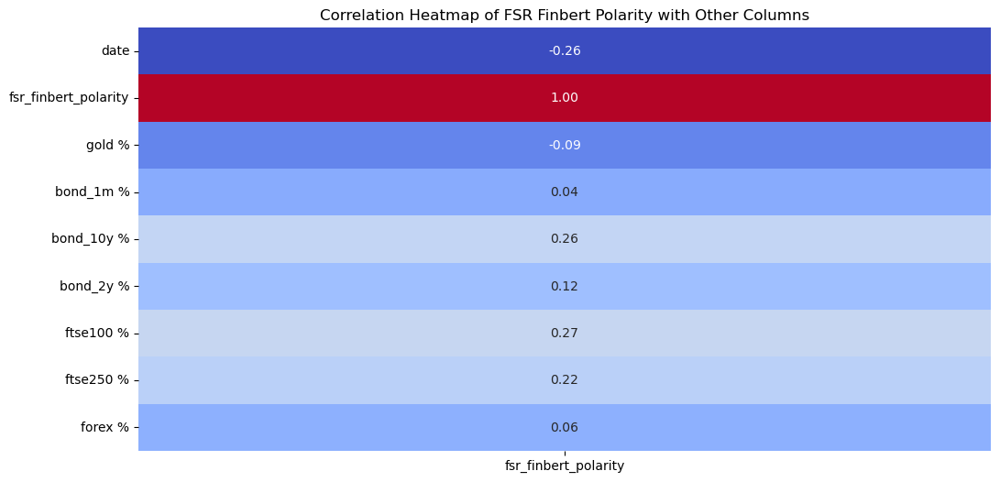

In [107]:
# Calculate correlation matrix for the filtered data
correlation_matrix = fsr_daily.corr()

# Extract correlation values for 'fsr_finbert_polarity' column
fsr_polarity_correlation = correlation_matrix['fsr_finbert_polarity']

# Plot correlation values for 'fsr_finbert_polarity'
plt.figure(figsize=(12, 6))
sns.heatmap(fsr_polarity_correlation.to_frame(), annot=True, cmap='coolwarm', fmt=".2f", cbar=False)
plt.title('Correlation Heatmap of FSR Finbert Polarity with Other Columns')

# Show plot
plt.show()

There are some statistical correlations in both but it's hard to pinpoint them as being causation due to the multitude of factors that would also influence something like the FTSE markets or bonds.

A quick look at the Governor speeches and reports over time.

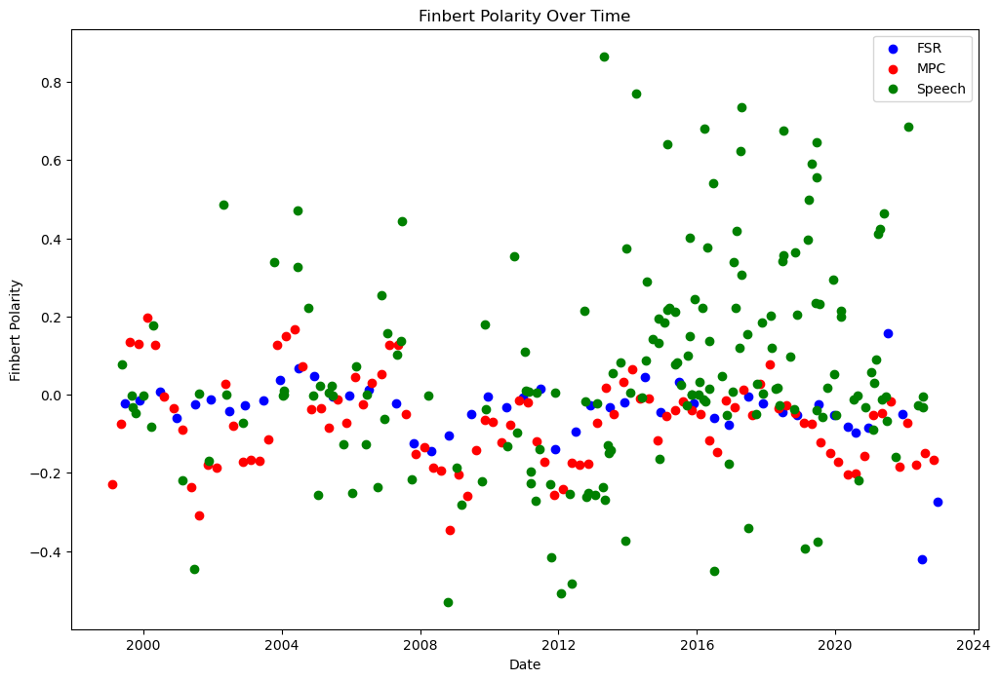

In [108]:
# Merge the DataFrames on the 'date' column
merged_df = pd.merge(fsr, mpc, on='date', how='outer')
merged_df = pd.merge(merged_df, speech_day[['date', 'finbert_polarity']], on='date', how='outer')

# Plot scatter plots
plt.figure(figsize=(12, 8))

# Scatter plot for 'fsr_finbert_polarity'
plt.scatter(merged_df['date'], merged_df['fsr_finbert_polarity'], label='FSR', color='blue')

# Scatter plot for 'mpc_finbert_polarity'
plt.scatter(merged_df['date'], merged_df['mpc_finbert_polarity'], label='MPC', color='red')

# Scatter plot for 'finbert_polarity' from 'speech_day'
plt.scatter(merged_df['date'], merged_df['finbert_polarity'], label='Speech', color='green')

# Add labels and legend
plt.xlabel('Date')
plt.ylabel('Finbert Polarity')
plt.title('Finbert Polarity Over Time')
plt.legend()

# Show plot
plt.show()

A lot more speeches and  more positive ones at the latter end of the time frame. This coincides with Mark Carney taking over as Governor from Mervyn King. 
A point worth noting.

A look at the Governor's speeches vs the two reports over any time frame.

In [109]:
# Create a function to plot the MPC, FSR, and Governor speeches over a chosen time
def lineplot_finbert_polarity(date_range, fsr_df, mpc_df, speech_day_df):
    # Merge the DataFrames on the 'date' column
    merged_df = pd.merge(fsr_df, mpc_df, on='date', how='outer')
    merged_df = pd.merge(merged_df, speech_day_df[['date', 'finbert_polarity']], on='date', how='outer')

    # Filter the DataFrame for the specified date range
    merged_df = merged_df[(merged_df['date'] >= date_range[0]) & (merged_df['date'] <= date_range[1])]

    # Plot line plots
    plt.figure(figsize=(12, 8))

    # Line plot for 'fsr_finbert_polarity'
    plt.plot(merged_df['date'], merged_df['fsr_finbert_polarity'], label='FSR', color='lightblue')

    # Line plot for 'mpc_finbert_polarity'
    plt.plot(merged_df['date'], merged_df['mpc_finbert_polarity'], label='MPC', color='blue')

    # Line plot for 'finbert_polarity' from 'speech_day'
    plt.plot(merged_df['date'], merged_df['finbert_polarity'], label='Governor Speech', color='salmon')

    # Add labels and legend
    plt.xlabel('Date')
    plt.ylabel('Finbert Polarity')
    plt.title(f'Finbert Polarity from {date_range[0]} to {date_range[1]}')
    plt.legend()

    # Show plot
    plt.show()

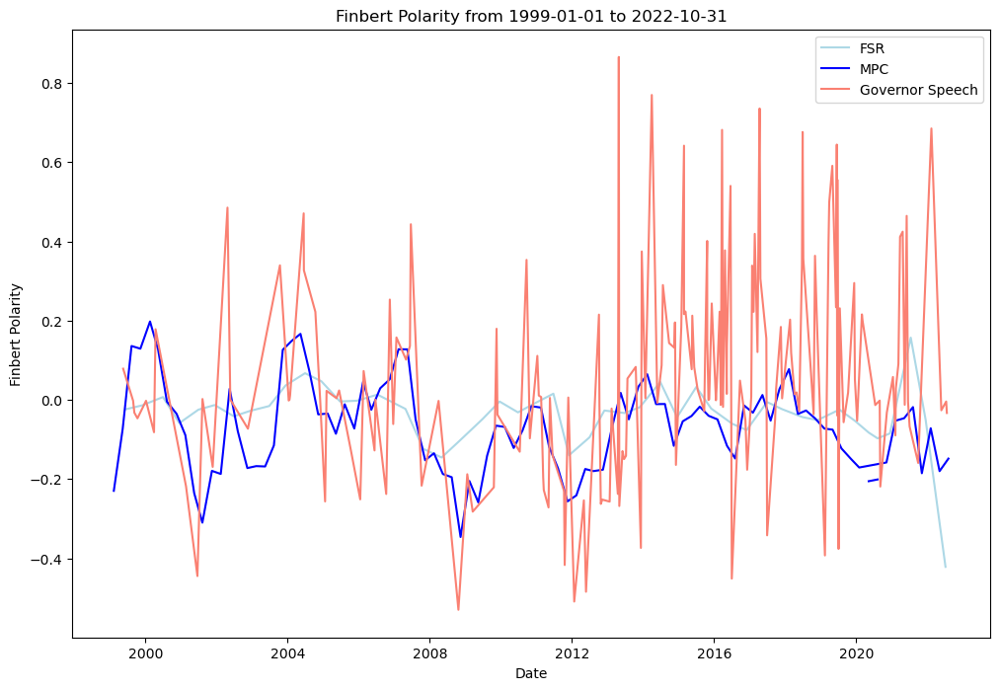

In [110]:
# The whole time frame
lineplot_finbert_polarity(('1999-01-01', '2022-10-31'), fsr, mpc, speech_day)

Loosely it seems like the speech polarity from the Governor correlates with the MPC reports more so.

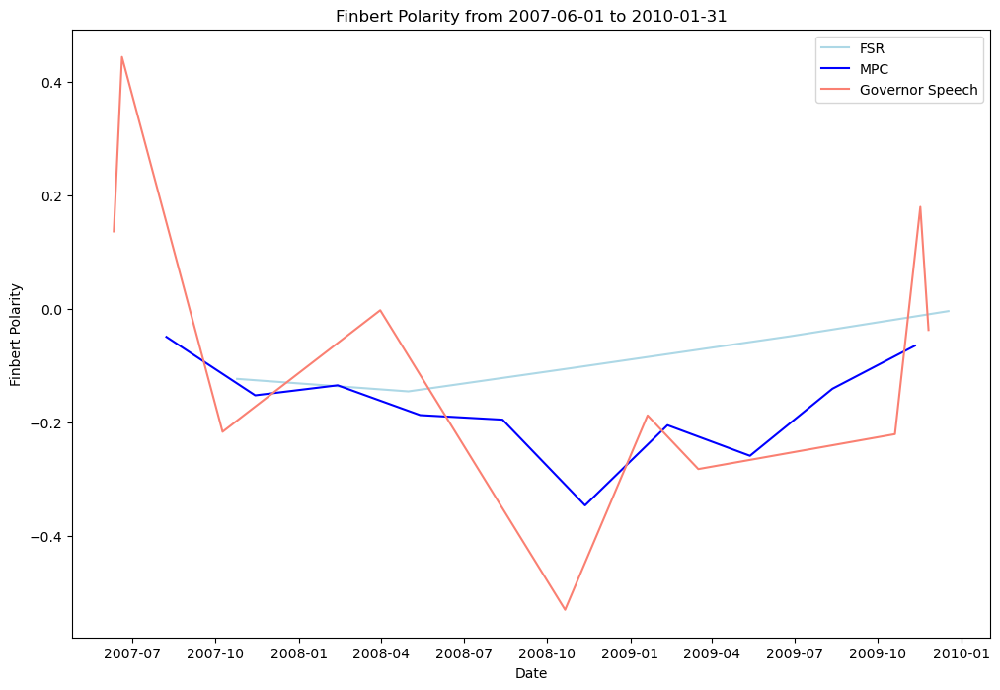

In [111]:
# The GFC period.
lineplot_finbert_polarity(('2007-06-01', '2010-01-31'), fsr, mpc, speech_day)

The FSR certainly seems to be a lot more neutral but it also is a less common occurrence

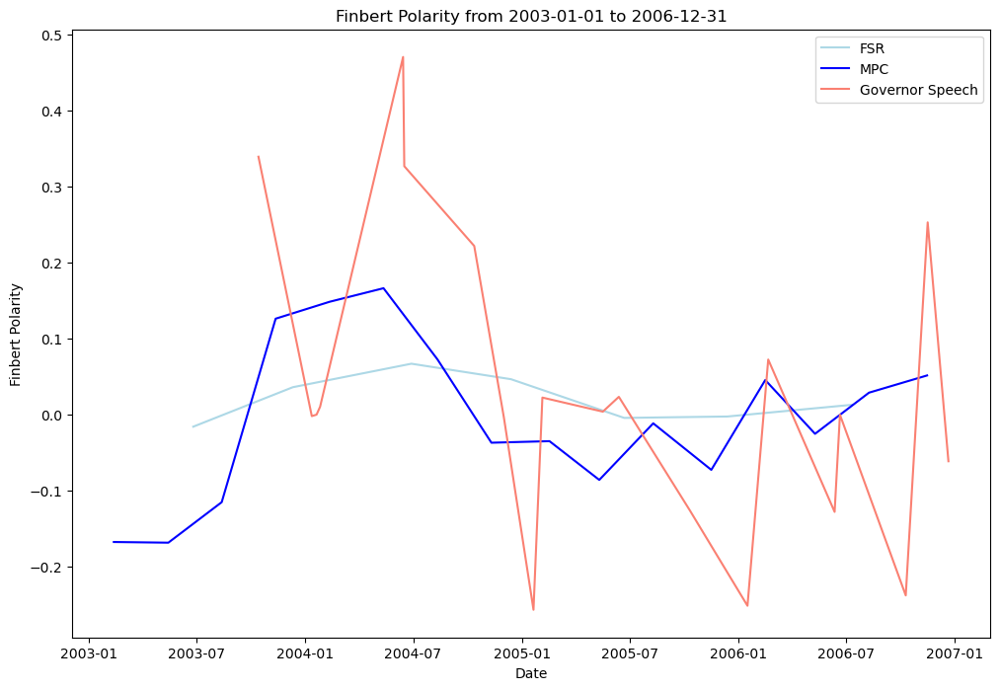

In [112]:
# The Golden Age
lineplot_finbert_polarity(('2003-01-01', '2006-12-31'), fsr, mpc, speech_day)

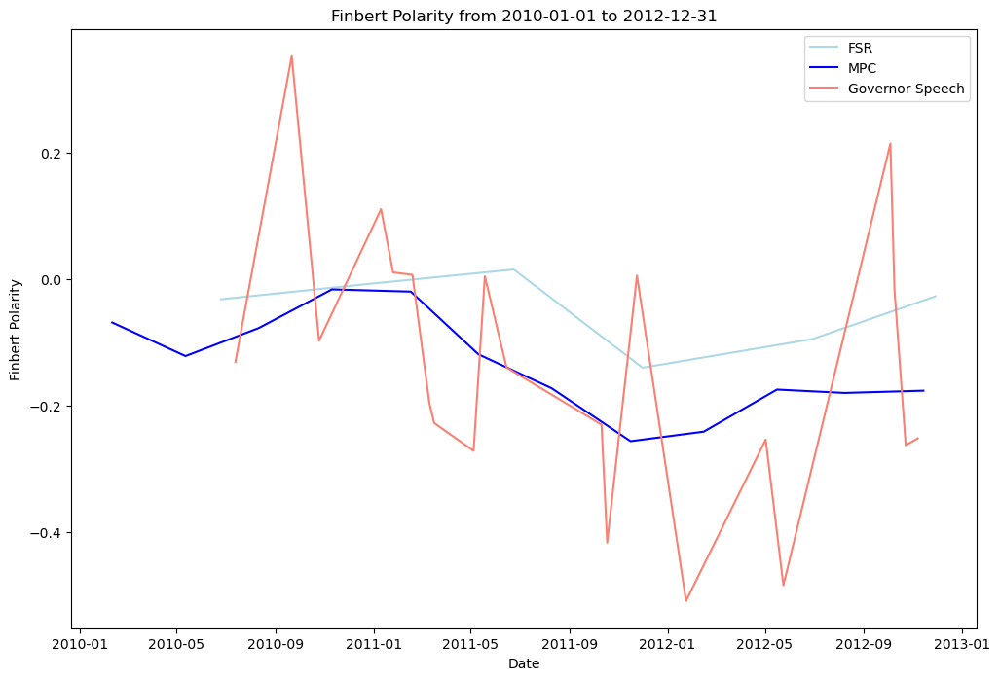

In [113]:
# The Slough of Despond.
lineplot_finbert_polarity(('2010-01-01', '2012-12-31'), fsr, mpc, speech_day)

I think whats clear is that looking into a smaller time frame with a lack of reports doeesn't really help much, especially when speeches can fluctuate considerably throughout the time frames

An attempt at a different way to plot it all

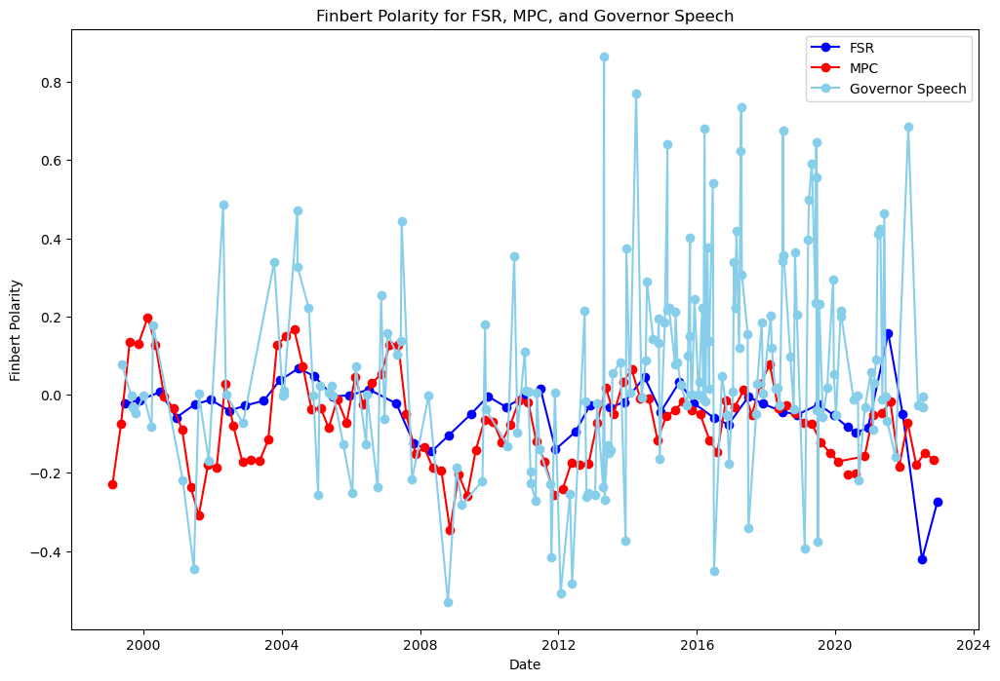

In [116]:
# Create a plot of the MPC, FSR and Governor speech data
def plot_finbert_polarity(fsr, mpc, speech_day):
    # Merge the dataframes on the 'date' column
    merged_df = pd.merge(fsr, mpc, on='date', how='outer')
    merged_df = pd.merge(merged_df, speech_day[['date', 'finbert_polarity']], on='date', how='outer')

    # Convert 'date' column to datetime format
    merged_df['date'] = pd.to_datetime(merged_df['date'])

    # Plot scatter plots for FSR, MPC, and Governor Speech
    plt.figure(figsize=(12, 8))
    plt.plot(merged_df['date'], merged_df['fsr_finbert_polarity'], c='blue', label='FSR', marker='o')
    plt.plot(merged_df['date'], merged_df['mpc_finbert_polarity'], c='red', label='MPC', marker='o')
    plt.plot(merged_df['date'], merged_df['finbert_polarity'], c='skyblue', label='Governor Speech', marker='o')

    # Add labels and legend
    plt.xlabel('Date')
    plt.ylabel('Finbert Polarity')
    plt.title('Finbert Polarity for FSR, MPC, and Governor Speech')
    plt.legend()

    # Show plot
    plt.show()

# Example usage:
plot_finbert_polarity(fsr, mpc, speech_day)

Too messy, not happy with that.

A look at creating a skyblue scatter point for positive speech sentiment and salmon for negative.

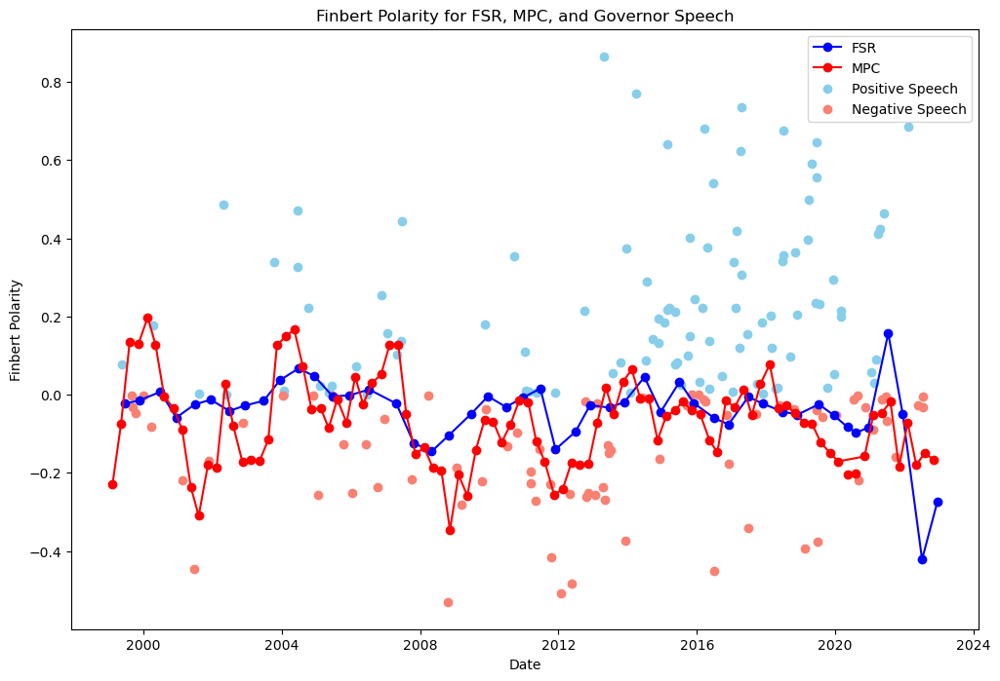

In [117]:
# Create a plot of the MPC, FSR and Governor speech data
def plot_finbert_polarity(fsr, mpc, speech_day):
    # Merge the dataframes on the 'date' column
    merged_df = pd.merge(fsr, mpc, on='date', how='outer')
    merged_df = pd.merge(merged_df, speech_day[['date', 'finbert_polarity']], on='date', how='outer')

    # Convert 'date' column to datetime format
    merged_df['date'] = pd.to_datetime(merged_df['date'])

    # Plot scatter plots for FSR and MPC
    plt.figure(figsize=(12, 8))
    plt.plot(merged_df['date'], merged_df['fsr_finbert_polarity'], c='blue', label='FSR', marker='o')
    plt.plot(merged_df['date'], merged_df['mpc_finbert_polarity'], c='red', label='MPC', marker='o')

    # Plot scatter plots for Governor Speech with different colors based on finbert_polarity value
    positive_speech = merged_df[merged_df['finbert_polarity'] > 0]
    negative_speech = merged_df[merged_df['finbert_polarity'] <= 0]
    plt.scatter(positive_speech['date'], positive_speech['finbert_polarity'], c='skyblue', label='Positive Speech', marker='o')
    plt.scatter(negative_speech['date'], negative_speech['finbert_polarity'], c='salmon', label='Negative Speech', marker='o')

    # Add labels and legend
    plt.xlabel('Date')
    plt.ylabel('Finbert Polarity')
    plt.title('Finbert Polarity for FSR, MPC, and Governor Speech')
    plt.legend()

    # Show plot
    plt.show()

# Example usage:
plot_finbert_polarity(fsr, mpc, speech_day)

Not a great way to view it.

A check on the aomunt of speeches after 2013, as seems like so many more.

In [118]:
# A check on the aomunt of speeches after 2013
start_date = pd.to_datetime('2013-01-01')
end_date = pd.to_datetime('2022-10-31')

# Filter the dataframe for rows within the specified date range
speeches_in_range = speech_day[(speech_day['date'] >= start_date) & (speech_day['date'] <= end_date)]

# Count the number of remaining rows
num_speeches = len(speeches_in_range)

print(f"There are {num_speeches} speeches.") 

There are 112 speeches.


Quarterly FinBERT speech scores were looked at due to this to see how this portrayed the data.

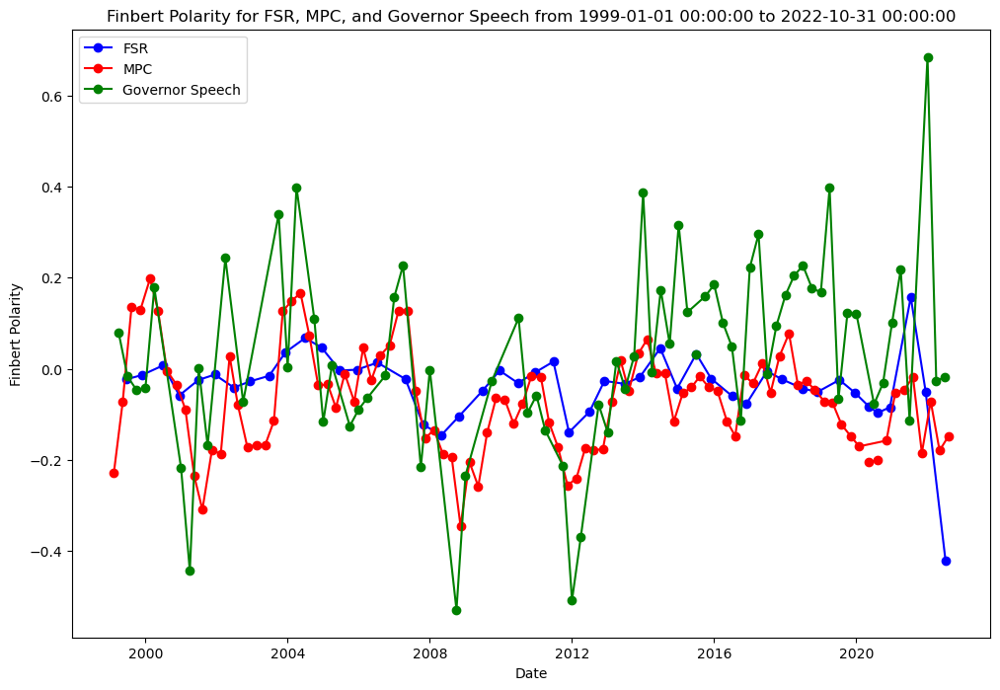

In [119]:
def plot_finbert_polarity(fsr, mpc, speech_day, start_date, end_date):
    # Calculate the quarterly mean of finbert_polarity
    quarterly_mean = speech_day.groupby(speech_day['date'].dt.to_period('Q'))['finbert_polarity'].mean().reset_index()

    # Convert 'date' column to datetime format
    quarterly_mean['date'] = quarterly_mean['date'].map(pd.Period.to_timestamp)

    # Merge the dataframes on the 'date' column
    merged_df = pd.merge(fsr, mpc, on='date', how='outer')
    merged_df = pd.merge(merged_df, quarterly_mean, on='date', how='outer')

    # Convert 'date' column to datetime format
    merged_df['date'] = pd.to_datetime(merged_df['date'])

    # Filter merged_df to only include rows within the specified date range
    merged_df = merged_df[(merged_df['date'] >= start_date) & (merged_df['date'] <= end_date)]

    # Plot scatter plots for FSR, MPC, and Governor Speech
    plt.figure(figsize=(12, 8))
    plt.plot(merged_df['date'], merged_df['fsr_finbert_polarity'], c='blue', label='FSR', marker='o')
    plt.plot(merged_df['date'], merged_df['mpc_finbert_polarity'], c='red', label='MPC', marker='o')
    plt.plot(merged_df['date'], merged_df['finbert_polarity'], c='green', label='Governor Speech', marker='o')

    # Add labels and legend
    plt.xlabel('Date')
    plt.ylabel('Finbert Polarity')
    plt.title(f'Finbert Polarity for FSR, MPC, and Governor Speech from {start_date} to {end_date}')
    plt.legend()

    # Show plot
    plt.show()

# Example usage:
start_date = pd.to_datetime('1999-01-01')
end_date = pd.to_datetime('2022-10-31')
plot_finbert_polarity(fsr, mpc, speech_day, start_date, end_date)

A look at them using the skyblue positive speech and salmon negative speech plot.

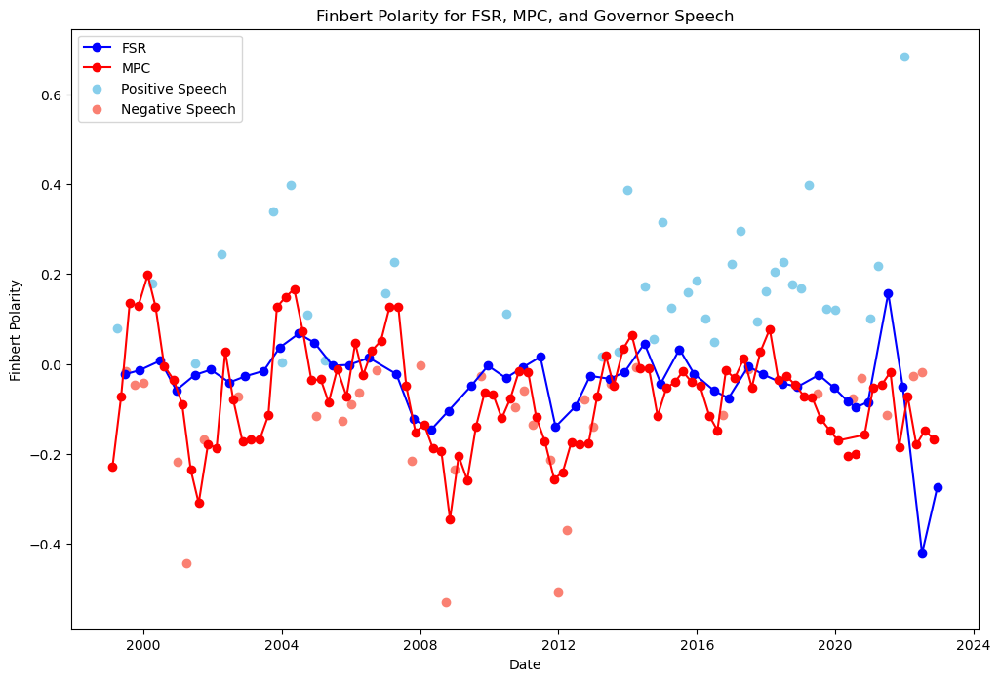

In [120]:
def plot_finbert_polarity(fsr, mpc, speech_day):
    # Calculate the quarterly mean of finbert_polarity
    quarterly_mean = speech_day.groupby(speech_day['date'].dt.to_period('Q'))['finbert_polarity'].mean().reset_index()

    # Convert 'date' column to datetime format
    quarterly_mean['date'] = quarterly_mean['date'].map(pd.Period.to_timestamp)

    # Merge the dataframes on the 'date' column
    merged_df = pd.merge(fsr, mpc, on='date', how='outer')
    merged_df = pd.merge(merged_df, quarterly_mean, on='date', how='outer')

    # Plot scatter plots for FSR and MPC
    plt.figure(figsize=(12, 8))
    plt.plot(merged_df['date'], merged_df['fsr_finbert_polarity'], c='blue', label='FSR', marker='o')
    plt.plot(merged_df['date'], merged_df['mpc_finbert_polarity'], c='red', label='MPC', marker='o')

    # Plot scatter plots for Governor Speech with different colors based on finbert_polarity value
    positive_speech = merged_df[merged_df['finbert_polarity'] > 0]
    negative_speech = merged_df[merged_df['finbert_polarity'] <= 0]
    plt.scatter(positive_speech['date'], positive_speech['finbert_polarity'], c='skyblue', label='Positive Speech', marker='o')
    plt.scatter(negative_speech['date'], negative_speech['finbert_polarity'], c='salmon', label='Negative Speech', marker='o')

    # Add labels and legend
    plt.xlabel('Date')
    plt.ylabel('Finbert Polarity')
    plt.title('Finbert Polarity for FSR, MPC, and Governor Speech')
    plt.legend()

    # Show plot
    plt.show()

# Example usage:
plot_finbert_polarity(fsr, mpc, speech_day)

A slightly different version of plotting it.

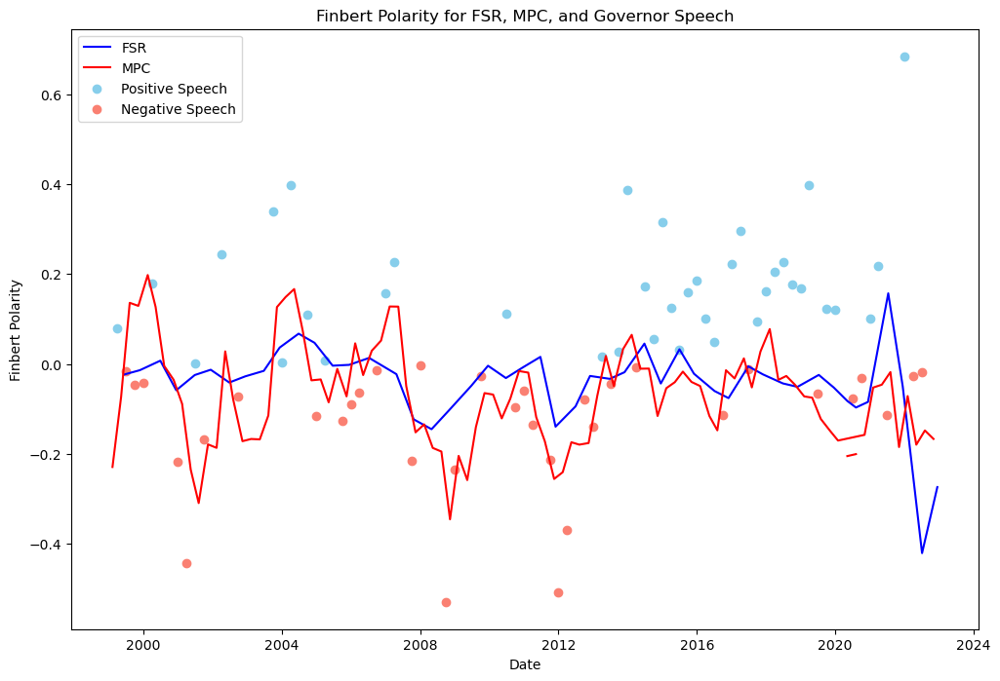

In [121]:
def plot_finbert_polarity(fsr, mpc, speech_day):
    # Calculate the quarterly mean of finbert_polarity
    quarterly_mean = speech_day.groupby(speech_day['date'].dt.to_period('Q'))['finbert_polarity'].mean().reset_index()

    # Convert 'date' column to datetime format
    quarterly_mean['date'] = quarterly_mean['date'].map(pd.Period.to_timestamp)

    # Merge the dataframes on the 'date' column
    merged_df = pd.merge(fsr, mpc, on='date', how='outer')
    merged_df = pd.merge(merged_df, quarterly_mean, on='date', how='outer')

    # Plot scatter plots for FSR and MPC
    plt.figure(figsize=(12, 8))
    plt.plot(merged_df['date'], merged_df['fsr_finbert_polarity'], c='blue', label='FSR', marker='')
    plt.plot(merged_df['date'], merged_df['mpc_finbert_polarity'], c='red', label='MPC', marker='')

    # Plot scatter plots for Governor Speech with different colors based on finbert_polarity value
    positive_speech = merged_df[merged_df['finbert_polarity'] > 0]
    negative_speech = merged_df[merged_df['finbert_polarity'] <= 0]
    plt.scatter(positive_speech['date'], positive_speech['finbert_polarity'], c='skyblue', label='Positive Speech', marker='o')
    plt.scatter(negative_speech['date'], negative_speech['finbert_polarity'], c='salmon', label='Negative Speech', marker='o')

    # Add labels and legend
    plt.xlabel('Date')
    plt.ylabel('Finbert Polarity')
    plt.title('Finbert Polarity for FSR, MPC, and Governor Speech')
    plt.legend()

    # Show plot
    plt.show()

# Example usage:
plot_finbert_polarity(fsr, mpc, speech_day)

After the many plots above I wanted to see how the reports looked against the template used with the periods of interest and key dates.

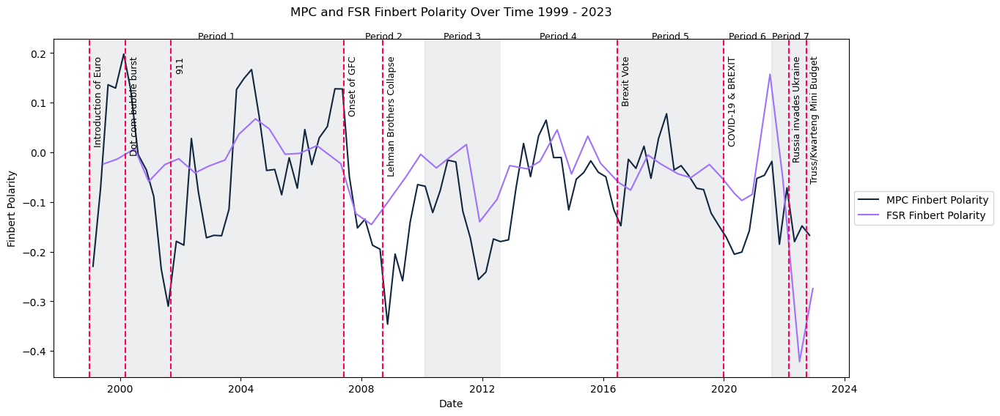

In [122]:
# Define the periods
periods = [
    ("Period 1", "1999", "2007-06-01"),
    ("Period 2", "2007-06-01", "2010-01-31"),
    ("Period 3", "2010-01-31", "2012-07-31"),
    ("Period 4", "2012-07-31", "2016-06-23"),
    ("Period 5", "2016-06-23", "2019-12-31"),
    ("Period 6", "2020-01-01", "2021-07-30"),
    ("Period 7", "2021-07-30", "2022-10-31")]

# Add key dates with labels
key_dates = {
    "Introduction of Euro": "1999-01-01",
    "Dot.com bubble burst": "2000-03-10",
    "911": "2001-09-11",
    "Onset of GFC": "2007-06-01",
    "Lehman Brothers Collapse": "2008-09-15",
    "Brexit Vote": "2016-06-23",
    "COVID-19 & BREXIT": "2020-01-01",
    "Russia invades Ukraine": "2022-02-24",
    "Truss/Kwarteng Mini Budget": "2022-09-23"}

# Create line plots of mpc_finbert_polarity and fsr_finbert_polarity
plt.figure(figsize=(14, 6))
mpc_plot = sns.lineplot(data=mpc, x='date',
                        y='mpc_finbert_polarity',
                        color='#12273F',
                        label='MPC Finbert Polarity')
fsr_plot = sns.lineplot(data=fsr, x='date',
                        y='fsr_finbert_polarity',
                        color='#9E71FE',
                        label='FSR Finbert Polarity')

# Shade and label the periods
for i, (period, start_date, end_date) in enumerate(periods):
    start_date = pd.to_datetime(start_date)
    end_date = pd.to_datetime(end_date)
    midpoint = start_date + (end_date - start_date) / 2
    color = '#C4C9CE' if i % 2 == 0 else 'white'
    plt.axvspan(start_date, end_date, color=color, alpha=0.3)
    
    # Adjust y-coordinate for all periods
    y_coord = plt.gca().get_ylim()[1] * 1.02  # Move to the top of the plot
    plt.text(midpoint, y_coord, period,
             horizontalalignment='center',
             verticalalignment='center', fontsize=9)

for label, date in key_dates.items():
    date = pd.to_datetime(date)
    plt.axvline(date, color='#FE0158', linestyle='--')
    plt.text(x=date + pd.DateOffset(days=50),
             y=plt.gca().get_ylim()[1] * 0.85,
             s=label, rotation=90,
             verticalalignment='top', fontsize=9)

# Add legend outside
plt.legend(loc='center left',
           bbox_to_anchor=(1, 0.5))

# Label plot
plt.xlabel('Date')
plt.ylabel('Finbert Polarity')
plt.title('MPC and FSR Finbert Polarity Over Time 1999 - 2023',
          y=1.05)

# Save figure
plt.savefig('mpc_fsr_finbert_polarity_over_time.png',
            bbox_inches='tight')

# Show
plt.show()

This looks good to me so now to add the Governor speeches at a monthly average

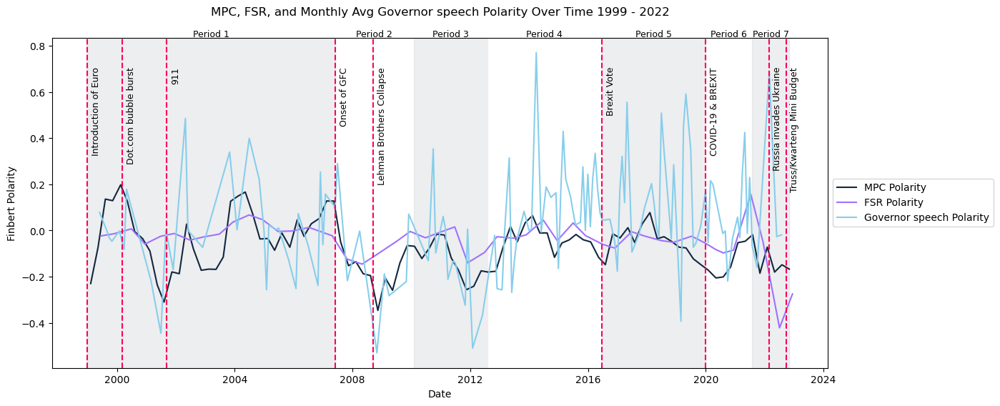

In [123]:
# Calculate monthly averages for 'finbert_polarity' in 'speech_day' DataFrame
speech_day['date'] = pd.to_datetime(speech_day['date'])  # Ensure 'date' column is in datetime format
monthly_avg_finbert_polarity = speech_day.resample('M', on='date')['finbert_polarity'].mean().reset_index()

# Define the periods
periods = [
    ("Period 1", "1999", "2007-06-01"),
    ("Period 2", "2007-06-01", "2010-01-31"),
    ("Period 3", "2010-01-31", "2012-07-31"),
    ("Period 4", "2012-07-31", "2016-06-23"),
    ("Period 5", "2016-06-23", "2019-12-31"),
    ("Period 6", "2020-01-01", "2021-07-30"),
    ("Period 7", "2021-07-30", "2022-10-31")]

# Add key dates with labels
key_dates = {
    "Introduction of Euro": "1999-01-01",
    "Dot.com bubble burst": "2000-03-10",
    "911": "2001-09-11",
    "Onset of GFC": "2007-06-01",
    "Lehman Brothers Collapse": "2008-09-15",
    "Brexit Vote": "2016-06-23",
    "COVID-19 & BREXIT": "2020-01-01",
    "Russia invades Ukraine": "2022-02-24",
    "Truss/Kwarteng Mini Budget": "2022-09-23"}

# Create line plots of mpc_finbert_polarity, fsr_finbert_polarity, and monthly average finbert_polarity
plt.figure(figsize=(14, 6))
mpc_plot = sns.lineplot(data=mpc, x='date',
                        y='mpc_finbert_polarity',
                        color='#12273F',
                        label='MPC Polarity')
fsr_plot = sns.lineplot(data=fsr, x='date',
                        y='fsr_finbert_polarity',
                        color='#9E71FE',
                        label='FSR Polarity')
monthly_avg_plot = sns.lineplot(data=monthly_avg_finbert_polarity, x='date',
                                y='finbert_polarity',
                                color='skyblue',
                                label='Governor speech Polarity')

# Shade and label the periods
for i, (period, start_date, end_date) in enumerate(periods):
    start_date = pd.to_datetime(start_date)
    end_date = pd.to_datetime(end_date)
    midpoint = start_date + (end_date - start_date) / 2
    color = '#C4C9CE' if i % 2 == 0 else 'white'
    plt.axvspan(start_date, end_date, color=color, alpha=0.3)
    
    # Adjust y-coordinate for all periods
    y_coord = plt.gca().get_ylim()[1] * 1.02  # Move to the top of the plot
    plt.text(midpoint, y_coord, period,
             horizontalalignment='center',
             verticalalignment='center', fontsize=9)

for label, date in key_dates.items():
    date = pd.to_datetime(date)
    plt.axvline(date, color='#FE0158', linestyle='--')
    plt.text(x=date + pd.DateOffset(days=50),
             y=plt.gca().get_ylim()[1] * 0.85,
             s=label, rotation=90,
             verticalalignment='top', fontsize=9)

# Add legend outside
plt.legend(loc='center left',
           bbox_to_anchor=(1, 0.5))

# Label plot
plt.xlabel('Date')
plt.ylabel('Finbert Polarity')
plt.title('MPC, FSR, and Monthly Avg Governor speech Polarity Over Time 1999 - 2022',
          y=1.05)

# Save figure
plt.savefig('mpc_fsr_monthly_avg_finbert_polarity_over_time.png',
            bbox_inches='tight')

# Show
plt.show()


Followed by all the speeches

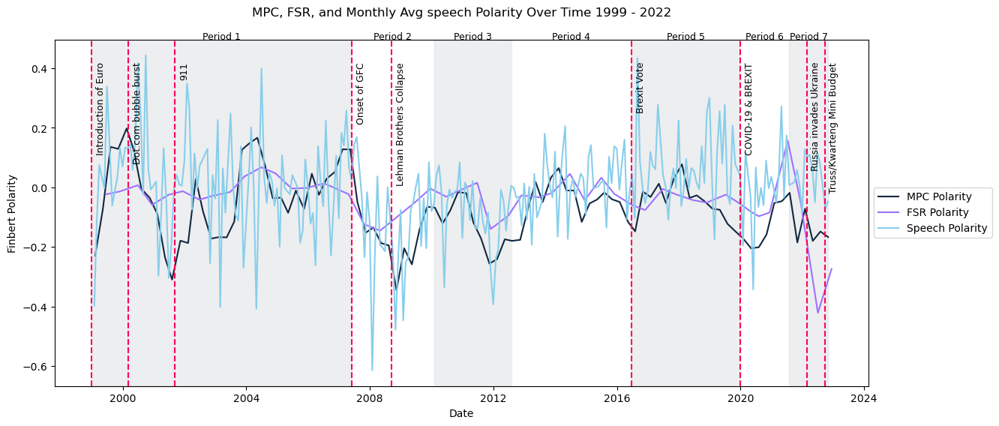

In [124]:
# Calculate monthly averages for 'finbert_polarity' in 'speech_day' DataFrame
# Ensure 'date' column is in datetime format
speeches['date'] = pd.to_datetime(speeches['date'])  
monthly_avg_finbert_polarity = speeches.resample('M', on='date')['finbert_polarity'].mean().reset_index()

# Define the periods
periods = [
    ("Period 1", "1999", "2007-06-01"),
    ("Period 2", "2007-06-01", "2010-01-31"),
    ("Period 3", "2010-01-31", "2012-07-31"),
    ("Period 4", "2012-07-31", "2016-06-23"),
    ("Period 5", "2016-06-23", "2019-12-31"),
    ("Period 6", "2020-01-01", "2021-07-30"),
    ("Period 7", "2021-07-30", "2022-10-31")]

# Add key dates with labels
key_dates = {
    "Introduction of Euro": "1999-01-01",
    "Dot.com bubble burst": "2000-03-10",
    "911": "2001-09-11",
    "Onset of GFC": "2007-06-01",
    "Lehman Brothers Collapse": "2008-09-15",
    "Brexit Vote": "2016-06-23",
    "COVID-19 & BREXIT": "2020-01-01",
    "Russia invades Ukraine": "2022-02-24",
    "Truss/Kwarteng Mini Budget": "2022-09-23"}

# Create line plots of mpc_finbert_polarity, fsr_finbert_polarity, and monthly average finbert_polarity
plt.figure(figsize=(14, 6))
mpc_plot = sns.lineplot(data=mpc, x='date',
                        y='mpc_finbert_polarity',
                        color='#12273F',
                        label='MPC Polarity')
fsr_plot = sns.lineplot(data=fsr, x='date',
                        y='fsr_finbert_polarity',
                        color='#9E71FE',
                        label='FSR Polarity')
monthly_avg_plot = sns.lineplot(data=monthly_avg_finbert_polarity, x='date',
                                y='finbert_polarity',
                                color='skyblue',
                                label='Speech Polarity')

# Shade and label the periods
for i, (period, start_date, end_date) in enumerate(periods):
    start_date = pd.to_datetime(start_date)
    end_date = pd.to_datetime(end_date)
    midpoint = start_date + (end_date - start_date) / 2
    color = '#C4C9CE' if i % 2 == 0 else 'white'
    plt.axvspan(start_date, end_date, color=color, alpha=0.3)
    
    # Adjust y-coordinate for all periods
    y_coord = plt.gca().get_ylim()[1] * 1.02  # Move to the top of the plot
    plt.text(midpoint, y_coord, period,
             horizontalalignment='center',
             verticalalignment='center', fontsize=9)

for label, date in key_dates.items():
    date = pd.to_datetime(date)
    plt.axvline(date, color='#FE0158', linestyle='--')
    plt.text(x=date + pd.DateOffset(days=50),
             y=plt.gca().get_ylim()[1] * 0.85,
             s=label, rotation=90,
             verticalalignment='top', fontsize=9)

# Add legend outside
plt.legend(loc='center left',
           bbox_to_anchor=(1, 0.5))

# Label plot
plt.xlabel('Date')
plt.ylabel('Finbert Polarity')
plt.title('MPC, FSR, and Monthly Avg speech Polarity Over Time 1999 - 2022',
          y=1.05)

# Save figure
plt.savefig('mpc_fsr_monthly_avg_finbert_polarity_over_time.png',
            bbox_inches='tight')

# Show
plt.show()

The Governor's speech plot certainly looks better and with the varying authors, settings, and topics of all the speeches I think that the Governor's speeches are better to show against the reports.

An attempt at a heat map to check for correaltion which didn't quite work and had no time to fix.

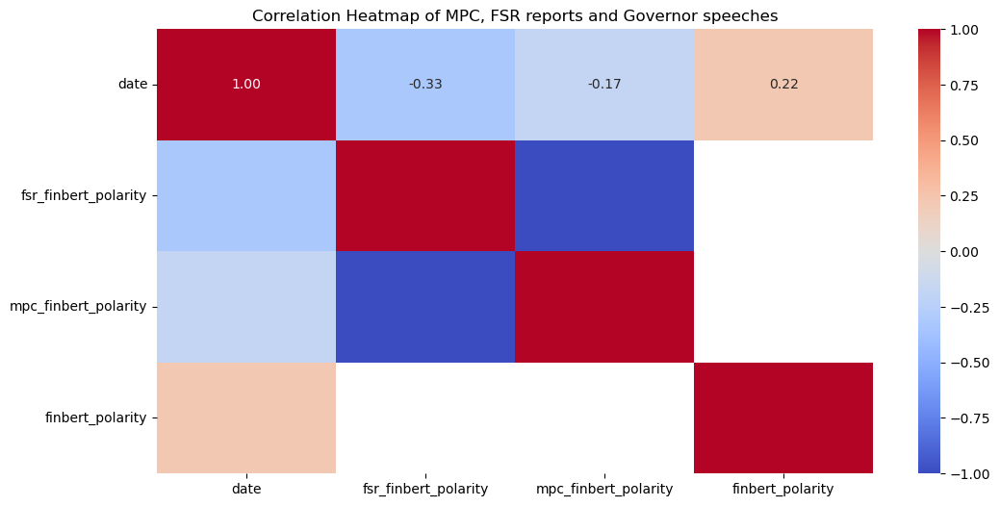

In [125]:
# Calculate correlation matrix for the filtered data
correlation_matrix = merged_df.corr()

# Plot correlation matrix with renamed axis labels
plt.figure(figsize=(12, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap of MPC, FSR reports and Governor speeches')
plt.show()

Calculating the amount of speeches and the change in their polarity after Carney took over as Governor.

In [126]:
speech_day_prior_2013 = speech_day[speech_day['date'] < '2013-07-01']
speech_day_after_2013 = speech_day[speech_day['date'] >= '2013-07-01']

# Calculate the average polarity value for each period
average_polarity_prior_2013 = speech_day_prior_2013['finbert_polarity'].mean()
average_polarity_after_2013 = speech_day_after_2013['finbert_polarity'].mean()

# Count the number of entries for each period
count_prior_2013 = speech_day_prior_2013.shape[0]
count_after_2013 = speech_day_after_2013.shape[0]

# Print the average polarity values and counts
print("Average polarity value prior Carney:", average_polarity_prior_2013)
print("Count prior to Carney:", count_prior_2013)
print("Average polarity value after Carney:", average_polarity_after_2013)
print("Count after Carney:", count_after_2013)

Average polarity value prior Carney: -0.040978985093333344
Count prior to Carney: 75
Average polarity value after Carney: 0.14212910173333335
Count after Carney: 105
